# COVID19 Risk Score Tuner 

Kevin Murphy (kpmurphy@google.com), Stelios Serghiou (serghiou@google.com), Adam Pearce (adampearce@google.com)

Last update:  **2020-11-13**

**Legal disclaimer**:
COVID Tuner is for modeling and research purposes only, and all pre-populated data are examples provided solely for reference. Health authorities remain responsible for determining and setting their own specific configuration parameters for their own apps.




## Overview

This Colab computes the probability of COVID transmission from a transmitter to a receiver, as a function of distance (estimated from bluetooth attenuation), duration, and infectiousness of the transmitter (estimated based on days since symtom onset), using a [standard exponential dose response model](http://qmrawiki.canr.msu.edu/index.php/Dose_response_assessment). The parameters of this model are derived from recent papers on the epidemiology of COVID, and on empirical bluetooth attenuation data (details below). 

In addition, the Colab computes the risk score, as defined by the [Google/ Apple Exposure Notification System](https://en.wikipedia.org/wiki/Exposure_Notification). This risk score approximates the probability of COVID transmission between two people. The score has [various parameters](https://enconfig.storage.googleapis.com/enconfig_fixed.html) that need to be set by the public health authority. This Colab lets the user visualize the effect of changing these parameters, as compared to the above model. 

There is also an [interactive web-app](https://risk-score-tuner.appspot.com/) version of this colab; the javascript code for this is at the bottom of this colab.


## References


* [Risk scoring calculation for the current NHSx contact tracing app](https://arxiv.org/abs/2005.11057), Mark Briers, Marcos Charalambides, Chris Holmes. 25 May 2020.

* [Digital Proximity Tracing in the COVID-19 Pandemic on Empirical Contact Networks](https://www.medrxiv.org/content/10.1101/2020.05.29.20115915v2)
Giulia Cencetti et al., June 2020. [Code](https://github.com/DigitalContactTracing/covid_code)

* [The timing of COVID-19 transmission](https://www.medrxiv.org/content/10.1101/2020.09.04.20188516v1.abstract), Luca Ferretti et al, Sept. 2020

* [Inferring proximity from Bluetooth Low Energy RSSI with Unscented Kalman Smoothers](https://arxiv.org/abs/2007.05057), Tom Lovett, Mark Briers, Marcos Charalambides, Radka Jersakova, James Lomax, Chris Holmes, July 2020.

* [Quantifying SARS-CoV-2-infection risk withing the Apple/Google exposure notification framework to inform quarantine recommendations](https://www.medrxiv.org/content/10.1101/2020.07.17.20156539v1), Amanda Wilson, Nathan Aviles,  Paloma  Beamer, Zsombor Szabo, Kacey  Ernst, Joanna Masel. July 2020.
[Code](https://github.com/awilson12/risk_scoring).





In [ ]:
import itertools
from dataclasses import dataclass
import collections
from collections import namedtuple

import numpy as np
import scipy.stats

import matplotlib.pyplot as plt
import matplotlib.cm as cm 

import sklearn
from sklearn import metrics

import IPython
from IPython.display import display, HTML

# Model

The probability of transmitting the virus from transmitter to receiver is given by a [standard exponential dose response model](http://qmrawiki.canr.msu.edu/index.php/Dose_response_assessment).

$$
\begin{align}
p(y=1|x) &= 1-e^{-\beta \; h(x)} \\
h(x) &= t \times f_{\text{dist}}(d)
\times f_{\text{inf}}(\Delta)
\end{align}
$$

where $x=(t,d,\Delta)$ is the exposure defined in terms of duration $t$, distance $d$ and days since symptom onset $\Delta$, and $h(x)$ is the hazard function, which computes the viral dose that is received.

We define $f_{\text{dist}}(d)$ and $f_{\text{inf}}(\Delta)$ below.
We also explain how to infer distance from bluetooh attenuation.

We set $\beta$ by hand, so that $p(y=1|x)=0.3$ when $t=8$ hours, $d=2$ m, and $\Delta=0$, to match the empirical attack rate in Wilson (2020).

The probability that the receiver gets infected is equal to the susceptibility times the probability of transmission. Susceptbility depends on many factors, such as the age of the receiver, whether they are wearing a mask, etc. We do not model this, since it is not part of the GAEN system.




## Infectiousness vs TOST





Suppose Bob gets infected and shows symptoms at time $T^s$.
Then Bob meets Alice, who gets exposed at time $T^e$.
Let $\Delta=T^s - T^e$ be time since onset of symptoms to transmission (TOST).
 (This is positive for symptomatic transmission, and negative for pre-symptomatic transmission.)
Let $f_{\rm{inf}}(\Delta)$ be the infectiousness as a function of TOST. 
To model $f_{\rm{inf}}$, we use one of the models proposed in  Ferretti et al 2020 (see supplementary Table 4). (The best fitting model is the Student t distribution.)




In [ ]:
def infectiousness_skew_logistic(tost):
  ps = scipy.stats.genlogistic.pdf(tost, 1.1248, loc=-0.2657, scale=1.5235)
  pmax = scipy.stats.genlogistic.pdf(0, 1.1248, loc=-0.2657, scale=1.5235)
  return ps/pmax

def infectiousness_student(tost):
  ps = scipy.stats.t.pdf(tost, 3.3454, loc=-0.0747, scale=1.8567)
  pmax = scipy.stats.t.pdf(0, 3.3454, loc=-0.0747, scale=1.8567)
  return ps/pmax

def infectiousness_student2(tost):
  rv = scipy.stats.t(df=3.3454, loc=-0.0747, scale=1.8567)
  ps = rv.pdf(tost)
  pminus2 = rv.pdf(-2)
  return ps/pminus2
  
def infectiousness_gaussian(tost):
  ps = scipy.stats.norm.pdf(tost, loc=0.0486, scale=2.7315)
  pmax = scipy.stats.norm.pdf(0, loc=0.0486, scale=2.7315)
  return ps/pmax

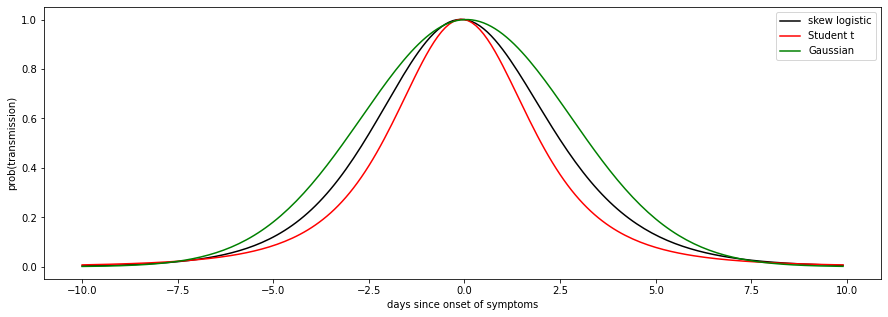

In [ ]:

plt.figure(figsize=(15,5))
tost = np.arange(-10, 10, 0.1)
ps =  infectiousness_skew_logistic(tost)
plt.plot(tost, ps, label='skew logistic', color='k')

ps =  infectiousness_student(tost)
plt.plot(tost, ps, label='Student t', color='r')

ps = infectiousness_gaussian(tost)
plt.plot(tost, ps, label='Gaussian', color='g')

plt.xlabel('days since onset of symptoms')
plt.ylabel('prob(transmission)')
plt.legend()

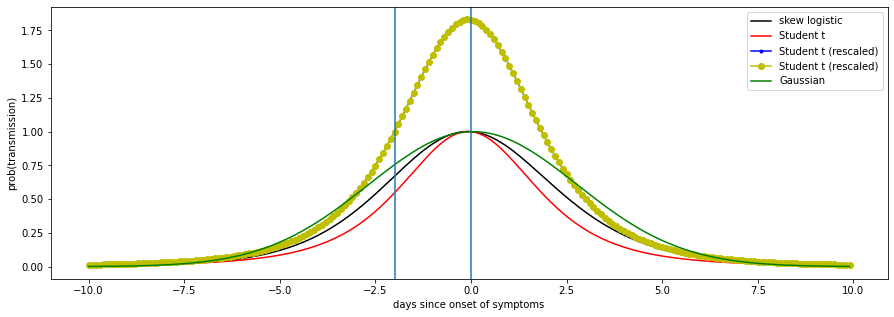

In [ ]:

plt.figure(figsize=(15,5))
tost = np.arange(-10, 10, 0.1)
ps =  infectiousness_skew_logistic(tost)
plt.plot(tost, ps, label='skew logistic', color='k')

ps =  infectiousness_student(tost)
plt.plot(tost, ps, label='Student t', color='r')

ps =  infectiousness_student2(tost)
plt.plot(tost, ps, label='Student t (rescaled)', color='b', marker='.')

ps =  infectiousness_student(tost)
pmax = infectiousness_student(-2)
ps = ps/pmax
plt.plot(tost, ps, label='Student t (rescaled)', color='y', marker='o')

ps = infectiousness_gaussian(tost)
plt.plot(tost, ps, label='Gaussian', color='g')

plt.xlabel('days since onset of symptoms')
plt.ylabel('prob(transmission)')
plt.legend()
plt.axvline(0)
plt.axvline(-2)

## Viral transmission vs distance

### Spline model

Wilson et al (2020) use a physical simulator of short-range aerosol spread. We [modified their Monte Carlo simulation code](https://github.com/probml/covid19/blob/master/WilsonMasel/distance_dose_figure_v2_stelios.R) to generate risk at different distances. We fit a cubic spline to this data (see code below). Thus we get the following non-parametric model.

$$
f_{\text{dist}}(d) =  \text{SplineInterpolate}(d; \text{SimData})
$$



In [ ]:
from scipy.interpolate import splev, splrep
import pandas as pd

def spline_fit():
  url = "https://raw.githubusercontent.com/probml/covid19/master/arizona-covid-droplet-sim/stelios-dose-data-scaled.csv"
  df = pd.read_csv(url)
  distances = df['distance'].to_numpy()
  doses = df['dose'].to_numpy()
  ndx1 = (distances <= 1)
  ndx2 = (distances > 1)
  x = distances[ndx1]
  y = doses[ndx1]
  spline1 = splrep(x, y) # (t, c, k), contains knots, coefficients, degree
  x = distances[ndx2]
  y = doses[ndx2]
  spline2 = splrep(x, y)
  return spline1, spline2

spline1, spline2 = spline_fit() # pre-compute fit
def transmission_vs_distance_spline(x, foo=42):
  if np.isscalar(x):
    x = np.array([x])
    scalar = True
  else:
    scalar = False
  n = len(x)
  ndx = np.where(x <= 1)
  y1 = splev(x, spline1)
  y2 = splev(x, spline2)
  y = np.zeros(n)
  y[x <= 1] = y1[x <= 1]
  y[x > 1] = y2[x > 1]
  if scalar:
    y = y[0]
  max_val = 60359.04 # transmission_vs_distance_spline(0)
  y = y/max_val # scale so that max value is 1.0
  return y


In [ ]:
def plot_transmission_fun(fun, ax, *args, **kwargs):
  use_log = kwargs.get('use_log', False)
  ttl = kwargs.get('title', None)
  x = np.linspace(0, 5, 100)
  y = fun(x, *args)
  ax.plot(x, y)
  ax.set_xlabel('distance (meters)')
  ax.set_ylabel('distance factor')
  if ttl:
    ax.set_title(ttl)
  if use_log:
    ax.set_yscale('log')

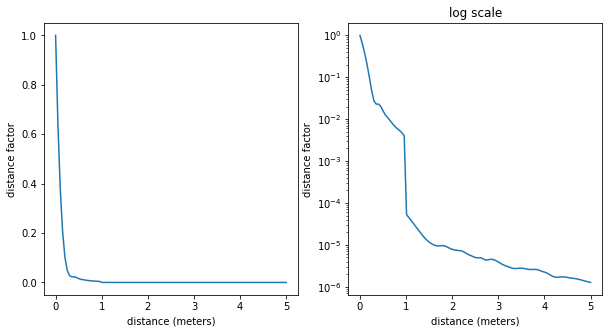

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
plot_transmission_fun(transmission_vs_distance_spline, axs[0],  use_log=False)
plot_transmission_fun(transmission_vs_distance_spline, axs[1],  use_log=True, title='log scale')


### Quadratic model


Briers (2020) propose the following quadratic model 
$$
f_{\text{dist}}(d) =  \min(1, D^2_{\min}/d^2)
 $$

They set
$D^2_{\min}=1$  based on argument of the physics of droplet spread.
However, we make this parameter adjustable, to capture the possibility of longer-range aerosal tranmissions.



In [ ]:
def transmission_vs_distance_quadratic(d, Dmin=1):
  eps = 1e-10
  m = np.power(Dmin,2)/(np.power(d, 2)+eps)
  return np.minimum(1, m)


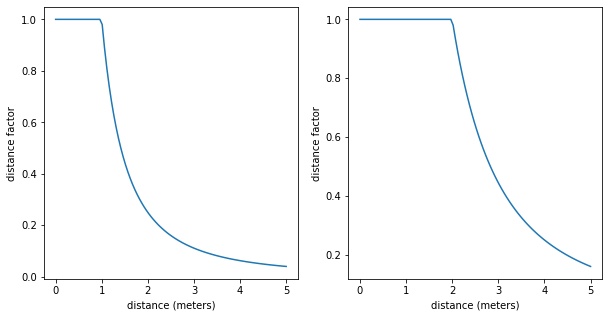

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(5*2,5))
plot_transmission_fun(transmission_vs_distance_quadratic, axs[0], 1)
plot_transmission_fun(transmission_vs_distance_quadratic, axs[1], 2)

### Sigmoid model

Cencetti et al (2020) propose the following sigmoidal decay function to encode the risk at different distances:


$$
f_{\text{dist}}(d) = 1-\frac{1}{1+\exp(-a d + b)}
 $$

They heuristically set $a = 1.5$ and $b=6.6$ so that the factor is $\approx 1$ for $d < 2$, $0.5$ at $d=4.4$ and $\approx 0$ for $d \geq 10$ (where $d$ is in meters).




To make these parameters more intuitive, and easier to adjust, we reparameterize the model in terms of its slope $w$, and its inflection point
$c$, which is where the curve crosses 0.5:

$$
f_{\text{dist}}(d) = 1-\frac{1}{1+\exp(-w d + w c)}
 $$



In [ ]:
def transmission_vs_distance_sigmoid(distance, slope=2, inflection=2):
  return 1-1/(1+np.exp(-slope*distance + slope*inflection))

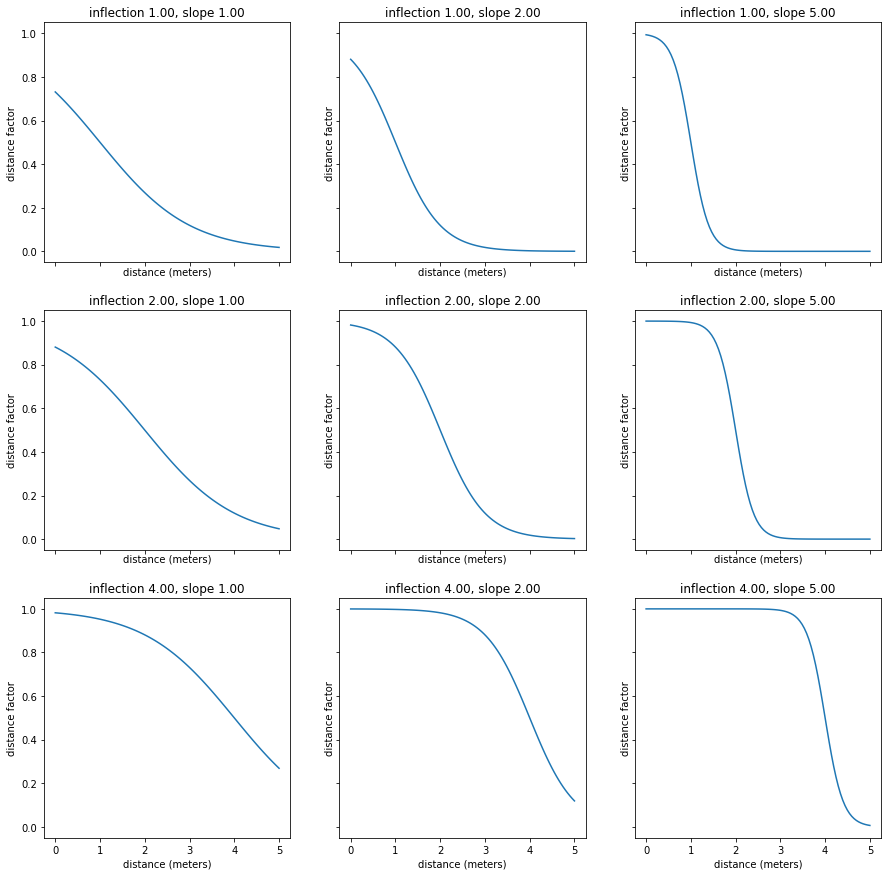

In [ ]:
inflections = [1,2,4]
slopes = [1,2,5]
m = len(inflections)
n = len(slopes)
fig, axs = plt.subplots(m,n, figsize=(5*n,5*m), sharex=True, sharey=True)
#axs = np.reshape(axs, (n,))
for i in range(m):
  inflection = inflections[i]
  for j in range(n):
    ax = axs[i,j]
    slope = slopes[j]
    ttl = 'inflection {:0.2f}, slope {:0.2f}'.format(inflection, slope)
    plot_transmission_fun(transmission_vs_distance_sigmoid, ax, slope, inflection, title=ttl)

### Comparison

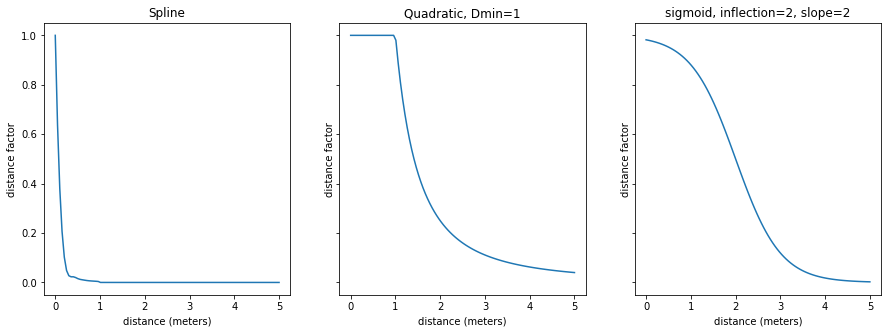

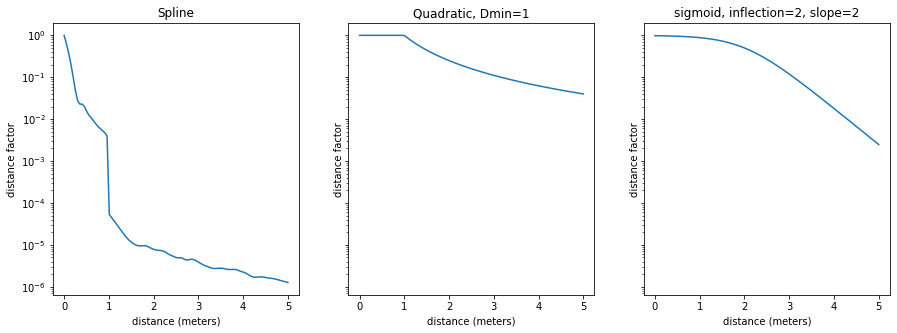

In [ ]:

log_scales = [False, True]
for log_scale in log_scales:  
  fig, axs = plt.subplots(1,3, figsize=(5*3,5), sharex=True, sharey=True)

  ttl = 'Spline'
  plot_transmission_fun(transmission_vs_distance_spline, axs[0], title=ttl, use_log=log_scale)

  ttl = 'Quadratic, Dmin=1'
  plot_transmission_fun(transmission_vs_distance_quadratic, axs[1], Dmin=1,  title=ttl, use_log=log_scale)

  ttl = 'sigmoid, inflection=2, slope=2'
  plot_transmission_fun(transmission_vs_distance_sigmoid, axs[2], slope=2, inflection=2, title=ttl,  use_log=log_scale)



## Bluetooth simulator



To map from distance $d$ to RSSI $R$, 
we use the discriminative log-normal regression model from Figure 4 of the Lovett et al 2020 paper,
which was fit to [Matrix data from MIT Lincoln Labs](https://github.com/mitll/https://github.com/mitll/MIT-Matrix-Data). 


$$
\begin{align}
\log(-R(d)) &\sim N(\mu(d),\sigma) \\
\mu(d) &= w \log(d) + b
\end{align}
$$
 where 
$w=0.21$,  $b=3.92$, $\sigma^2=0.33$.


To compute the expected distance $d$ from RSSI, we use
$$
\begin{align}
d &= \exp( (\log(-R) - b)/w ) 
\end{align}
$$

We also consider the simpler normal regression model  from figure 10 of the Lovett et al 2020 paper.

$$
\begin{align}
R(d) &\sim  N(\mu(d),\sigma) \\
\mu(d) &= w \log(d) + b
\end{align}
$$
 where 
$w=-8.69$,  $b=-67.9$, $\sigma^2=97.03$.
(By comparison, Bill Pugh's results suggest $A=60 + 20 log_{10}(d)$.)

To compute the expected distance $d$ from RSSI, we use:
$$
\begin{align}
d(R) = \exp[(R-b)/w]
\end{align}
$$

To convert from RSSI $R$ to attenuation $A$, we use

$$
A= t_x - r_x - R
$$
where
$t_x$ is the transmitter strength, $r_x$ is the receiver strength, (aka correction factor). According to Lovett, $t_x - r_x = 2.398$. Since $t_x - r_x \approx 0$,
we can simplify this by defining $A=-R$.


In [ ]:
@dataclass
class BleParams:
  slope: float
  intercept: float
  sigma: float
  model: str
  name: str 
  tx: float = 0.0
  correction: float = 2.398


ble_params_lognormal_briers = BleParams(slope = 0.127, intercept = 4.23, sigma = np.sqrt(0.49), model = 'log-normal', name='log-normal-new') # Mark Briers
ble_params_lognormal_lovett = BleParams(slope = 0.21, intercept = 3.92, sigma = np.sqrt(0.33), model = 'log-normal', name='log-normal-old') # Lovett paper
ble_params_normal_lovett = BleParams(slope = -8.69, intercept = -67.9, sigma = np.sqrt(97.03), model = 'normal', name='normal-lovett') # Lovett paper
ble_params_normal_sklearn = BleParams(slope = -5.422, intercept = -66.696, sigma = 10.323, model = 'normal', name='normal-sklearn') # sklearn.ridge on MIT matrix data
ble_params_default = ble_params_lognormal_lovett

In [ ]:



def atten_to_dist(atten, params=ble_params_default):
  rssi = -atten
  if params.model == 'log-normal':
     return np.exp((np.log(-rssi) - params.intercept)/params.slope)
  else:
    return np.exp((rssi - params.intercept)/params.slope)

def dist_to_atten(distance, params=ble_params_default):
  mu = params.intercept + params.slope * np.log(distance)
  if params.model == 'log-normal':
    rssi = -np.exp(mu)
  else:
    rssi = mu
  return -rssi

def dist_to_atten_sample(distances, params=ble_params_default, sigma=None):
  if sigma is None:
    sigma = params.sigma
  if sigma == 0:
    return dist_to_atten(distances, params)
  N = len(distances)
  mu = params.intercept + params.slope * np.log(distances)
  if params.model == 'log-normal':
    #rssi = -scipy.stats.lognorm(s=np.sqrt(sigma2), scale=np.exp(mus)).rvs()
    rssi = -np.random.lognormal(mean=mu, sigma=sigma)
  else:
    rssi = np.random.normal(loc=mu, scale=sigma)
  return -rssi


def dist_to_atten_bounds(distance, params=ble_params_default, sigma=None, factor=1):
  if sigma is None:
    sigma = params.sigma
  mu = params.intercept + params.slope * np.log(distance)
  mu_lower = mu - factor*sigma
  mu_upper = mu + factor*sigma
  if params.model == 'log-normal':
    rssi = -np.exp(mu)
    rssi_lower = -np.exp(mu_lower)
    rssi_upper = -np.exp(mu_upper)
  else:
    rssi = mu; rssi_lower = mu_lower; rssi_upper = mu_upper;
  return -rssi_lower, -rssi, -rssi_upper
  
def atten_to_dist_bounds(atten, params=ble_params_default, sigma=None, factor=1):
  if sigma is None:
    sigma = params.sigma
  if params.model == 'log-normal':
    atten_lower = atten / np.exp(factor * sigma)
    atten_upper = atten * np.exp(factor * sigma)
  else:
    atten_lower = atten - factor*sigma  
    atten_upper = atten + factor*sigma 
  dist = atten_to_dist(atten, params)
  dist_lower = atten_to_dist(atten_lower, params)
  dist_upper = atten_to_dist(atten_upper, params)
  return dist_lower, dist, dist_upper
  



### Plots

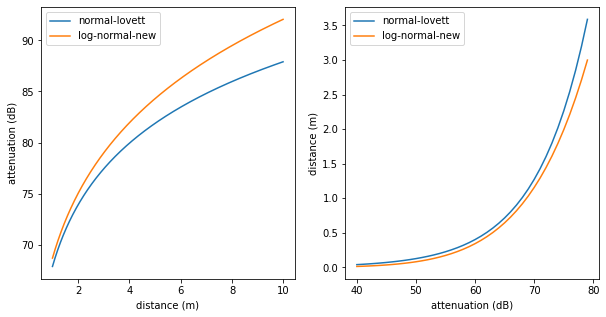

In [ ]:

ble_params_list = [ble_params_normal_lovett,  ble_params_lognormal_briers]
distances  = np.arange(1, 10, 0.01)
attens = np.arange(40,80,1)
n = 2
fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i, ble_params in enumerate(ble_params_list):
    mu = dist_to_atten(distances, ble_params)
    ax = axs[0]
    ax.plot(distances, mu,  label=ble_params.name)
    ax.set_ylabel('attenuation (dB)')
    ax.set_xlabel('distance (m)')
    ax.legend()

    mu = atten_to_dist(attens, ble_params)
    ax = axs[1]
    ax.plot(attens, mu, label=ble_params.name)
    ax.set_xlabel('attenuation (dB)')
    ax.set_ylabel('distance (m)')
    ax.legend()




In [ ]:
print(atten_to_dist(np.array([40, 80])))
print(dist_to_atten(np.array([0.5, 10])))

[0.33268006 9.02615823]
[43.57306099 81.73995025]


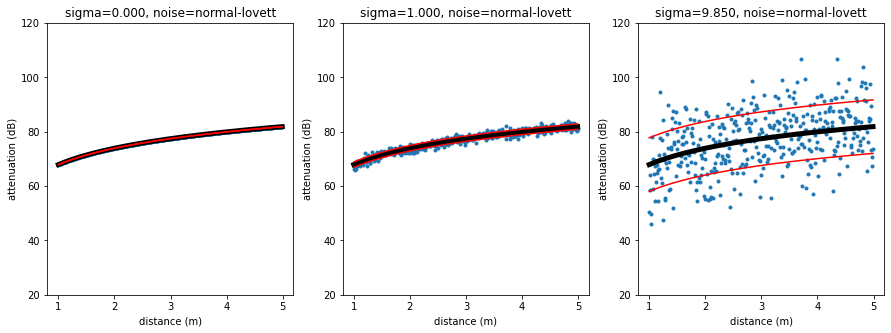

In [ ]:

def plot_curves(sigma_list, ble_params):
  distances  = np.arange(1, 5, 0.01)
  n = len(sigma_list)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=False)
  axs = np.reshape(axs, (n,))
  for i, sigma in enumerate(sigma_list):
    mu = dist_to_atten(distances, ble_params)
    np.random.seed(0)
    attens = dist_to_atten_sample(distances, ble_params, sigma=sigma)
    lower, atten, upper = dist_to_atten_bounds(distances, ble_params, sigma=sigma, factor=1)
    ax = axs[i]
    ax.plot(distances, attens, '.')
    ax.plot(distances, mu, 'k-', lw=5)
    ax.plot(distances, lower, 'r-')
    ax.plot(distances, upper, 'r-')
    ax.set_ylabel('attenuation (dB)')
    ax.set_xlabel('distance (m)')
    ax.set_title('sigma={:0.3f}, noise={}'.format(sigma, ble_params.name))
    ax.set_ylim(20,120)


sigma_list = [0, 1, np.sqrt(97.03)]
ble_params = ble_params_normal_lovett
plot_curves(sigma_list, ble_params)

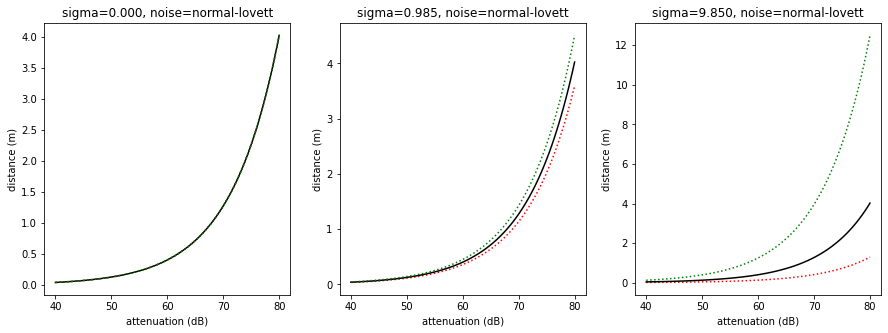

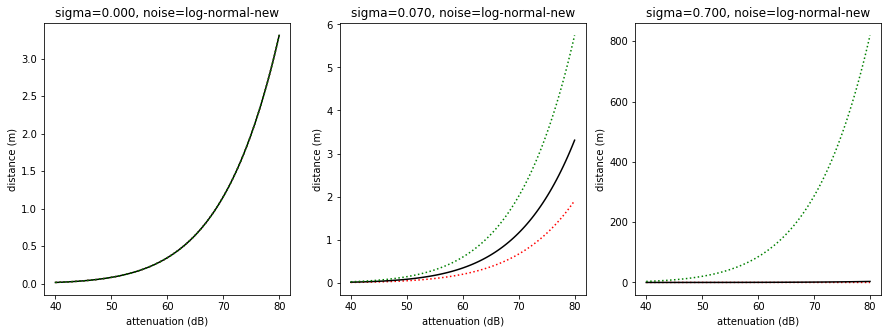

In [ ]:
def plot_curves(sigma_list, ble_params):
  atten = np.linspace(40, 80, 100)
  n = len(sigma_list)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=False)
  axs = np.reshape(axs, (n,))
  for i, sigma in enumerate(sigma_list):
    ax  = axs[i]
    dist_lower, dist, dist_upper = atten_to_dist_bounds(atten, ble_params, sigma=sigma)
    ax.plot(atten, dist_lower, 'r:')
    ax.plot(atten, dist, 'k-')
    ax.plot(atten, dist_upper, 'g:')
    ax.set_xlabel('attenuation (dB)')
    ax.set_ylabel('distance (m)')
    ax.set_title('sigma={:0.3f}, noise={}'.format(sigma, ble_params.name))




ble_params = ble_params_normal_lovett
sigma_mle = ble_params.sigma
sigma_list = [0, 0.1*sigma_mle, sigma_mle]
plot_curves(sigma_list, ble_params)

ble_params = ble_params_lognormal_briers
sigma_mle = ble_params.sigma
sigma_list = [0, 0.1*sigma_mle, sigma_mle]
plot_curves(sigma_list, ble_params)

### Compose bluetooth model and viral distance model

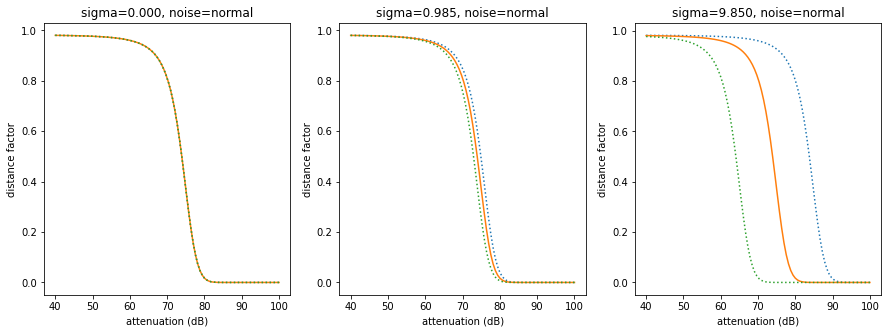

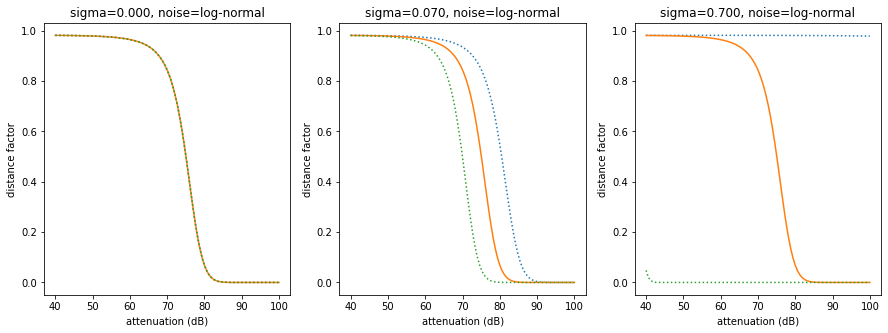

In [ ]:

def plot_curves(sigma_list, ble_params):
  atten = np.linspace(40, 100, 100)
  n = len(sigma_list)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=False)
  axs = np.reshape(axs, (n,))
  for i, sigma in enumerate(sigma_list):
    ax  = axs[i]
    dist_lower, dist, dist_upper = atten_to_dist_bounds(atten, ble_params, sigma=sigma)
    dose_lower = transmission_vs_distance_sigmoid(dist_lower)
    dose = transmission_vs_distance_sigmoid(dist)
    dose_upper = transmission_vs_distance_sigmoid(dist_upper)
    ax.plot(atten, dose_lower, ':')
    ax.plot(atten, dose)
    ax.plot(atten, dose_upper, ':')
    ax.set_xlabel('attenuation (dB)')
    ax.set_ylabel('distance factor')
    ax.set_title('sigma={:0.3f}, noise={}'.format(sigma, ble_params.model))




ble_params = ble_params_normal_lovett
sigma_mle = ble_params.sigma
sigma_list = [0, 0.1*sigma_mle, sigma_mle]
plot_curves(sigma_list, ble_params)

ble_params = ble_params_lognormal_briers
sigma_mle = ble_params.sigma
sigma_list = [0, 0.1*sigma_mle, sigma_mle]
plot_curves(sigma_list, ble_params)

## Overall probability model

Let $y=1$ iff the person receives a viral dose which is sufficiently high to cause infection, assuming 100% susceptibilty. We assume the probability of this event is as follows:

$$
\begin{align}
p(y=1|x) &= 1-e^{-\beta \; h(x)} \\
h(x) &= t \times f_{\text{dist}}(d)
\times f_{\text{inf}}(\Delta)
\end{align}
$$

where al the terms are defined above.


In [ ]:


@dataclass
class ModelParams:
  ble_params: BleParams = ble_params_default 
  distance_fun: str = 'sigmoid' # quadratic  or sigmoid
  distance_Dmin: float = 1.0
  distance_slope: float = 2.0
  distance_inflection: float = 2.0
  infectiousness_fun: str = 'skew-logistic' # student, gaussian or skew-logistic
  beta: float = 0.8*1e-3 # transmission rate to approximately match Wilson (2020) paper

def hazard_score_batch(attenuations, durations, symptom_days, params, distances=None):
  if distances is None:
    distances = atten_to_dist(attenuations, params.ble_params)
  if params.distance_fun == 'quadratic':
    fd = transmission_vs_distance_quadratic(distances, params.distance_Dmin)
  elif params.distance_fun == 'sigmoid':
    fd = transmission_vs_distance_sigmoid(distances, params.distance_slope, params.distance_inflection)
  elif params.distance_fun == 'spline':
    fd = transmission_vs_distance_spline(distances)

  if params.infectiousness_fun == 'gaussian':
    finf = infectiousness_gaussian(symptom_days) 
  elif params.infectiousness_fun == 'skew-logistic':
    finf = infectiousness_skew_logistic(symptom_days)
  elif params.infectiousness_fun == 'student':
    finf = infectiousness_student(symptom_days)

  doses  = durations * fd * finf 
  return doses

def prob_infection_batch(attenuations, durations, symptom_days, params, distances=None):
  doses = hazard_score_batch(attenuations, durations, symptom_days, params, distances)
  return 1-np.exp(-params.beta * doses)

params = ModelParams()
print(params)






ModelParams(ble_params=BleParams(slope=0.21, intercept=3.92, sigma=0.5744562646538028, model='log-normal', name='log-normal-old', tx=0.0, correction=2.398), distance_fun='sigmoid', distance_Dmin=1.0, distance_slope=2.0, distance_inflection=2.0, infectiousness_fun='skew-logistic', beta=0.0008)


Wilson (2020) say the attack rate for someone spending 8h in their home (and therefore presumably very close) to someone who is maximally infectious (e.g., onset=0) is about 30%. We tuned the beta parmeter by hand to match this.

In [ ]:
distance = 1 # very close
duration = 8*60
onset = 0
atten = dist_to_atten(distance)
pinfection = prob_infection_batch(atten, duration, onset, params)
print(pinfection) # should be close to 30%, according to Wilson
assert np.allclose(pinfection, 0.3, atol=1e-1)


0.2869659316009514


In [ ]:
distance = 1 
duration = 15
onset = 0
atten = dist_to_atten(distance)
dose = hazard_score_batch(atten, duration, onset, params)
print(dose)
pinfection = prob_infection_batch(atten, duration, onset, params)
print(pinfection) 

13.211956169668236
0.010513903363079335


The CDC guidelines define 15mins at 2m with an onset of -2 as the minimum meaningful exposure dose. We compute what this is below.

In [ ]:
distance = 2 
duration = 15
onset = -2
atten = dist_to_atten(distance)
dose = hazard_score_batch(atten, duration, onset, params)
print(dose)
pinfection = prob_infection_batch(atten, duration, onset, params)
print(pinfection) 


5.022819728622508
0.004010193395656114


## ENS risk score 

Consider a single exposure event $x=(t, a, \Delta)$, where $t$ is the duration (in minutes), $a$ is the attenuation, and $\Delta$ is the days since symptom onset.
Let $b(a)$ be the bucket into which the attenuation falls (based on the specified thresholds $\theta$), and let $i(\Delta)$ be the infectiousness level (based on the sympton onset mapping $\Psi$). The GAEN API defines the risk  in terms of effective exposure minutes, as follows:

$$
r(x; w,\theta,\Psi) = t \times w_b^{\text{atten}} \times w_i^{\text{inf}}
$$

The parameters $w$, $\theta$ and $\psi$ are specified by the configuration file provided by the PHA (see below).

We can convert this to a probability of infection using

$$
q(y=1|x) = 1-e^{-\beta \; r(x)}
$$
Thus we interpret the risk score as an approximation to the dose (hazard) function. Following Wilson(2020), we set $\beta=3.1 \times 10^{-6}$, which gives a probability of infection after 8h of exposure to a maximally infectious person at the minimal attenuation bucket of 0.3, which matches the empirical attack rate for at-home exposures.


In [ ]:

@dataclass
class RiskConfig:
    ble_thresholds: np.array  = np.array([])
    ble_weights: np.array  = np.array([])
    inf_levels: np.array  = np.array([])
    inf_weights: np.array  = np.array([])
    name: str = ''
    beta: float = 3.1  * 1e-4 # Wilson table 1 (divide by 100)

def get_one_hot(targets, num_classes):
  # https://stackoverflow.com/questions/38592324/one-hot-encoding-using-numpy
  I = np.eye(num_classes)
  r = np.atleast_1d(targets)
  res = I[r]
  s = list(r.shape) + [num_classes]
  return res.reshape(s)


def infectiousness_score_batch(symptom_days, levels, weights): 
  # Map each symptom onset day to a level, and return the correspond weights.
  # symptom_days is an array of ints in -14..14
  symptom_days = np.atleast_1d(symptom_days)
  labels = levels[symptom_days + 14]
  X = get_one_hot(labels, num_classes = len(weights))
  scores = np.matmul(X, weights)
  return scores

def attenuation_score_batch(attenuations, thresholds, weights):
  # Map each attenuation to the corresponding bucket
  # and return the corresponding set of weights.
  attenuations = np.atleast_1d(attenuations)
  labels = np.digitize(attenuations, thresholds)
  X = get_one_hot(labels, num_classes = len(weights))
  scores = np.matmul(X, weights)
  return scores

def risk_score_batch(attenuations, durations, symptom_days, config):
  attenuations = np.atleast_1d(attenuations)
  durations = np.atleast_1d(durations)
  symptom_days = np.atleast_1d(symptom_days)
  winf = infectiousness_score_batch(symptom_days, config.inf_levels, config.inf_weights)
  watten = attenuation_score_batch(attenuations, config.ble_thresholds, config.ble_weights)
  risks = durations * watten * winf
  return risks

def prob_risk_score_batch(attenuations, durations, symptom_days, config):
  risks = risk_score_batch(attenuations, durations, symptom_days, config)
  probs = 1-np.exp(-config.beta * risks)
  return probs

# Input distribution

## Make uniform grid of inputs

In [ ]:
def uniform_input_data_grid(max_dur = 30,  max_dist = 5, ngrid_dist = 25, ngrid_dur=20, min_dist=0.01, min_dur=5, onset=10):
  distances = np.linspace(min_dist, max_dist, ngrid_dist) # meters
  durations = np.linspace(min_dur, max_dur, ngrid_dur) # minutes
  symptoms = np.arange(-onset, onset+0.001, dtype=int) # must be int
  return distances, durations, symptoms

In [ ]:
distances, durations, symptoms = uniform_input_data_grid()
print(distances)
print(len(distances))

print(durations)
print(len(durations))

print(symptoms)
print(len(symptoms))

print(len(distances) * len(durations) * len(symptoms))

[0.01       0.21791667 0.42583333 0.63375    0.84166667 1.04958333
 1.2575     1.46541667 1.67333333 1.88125    2.08916667 2.29708333
 2.505      2.71291667 2.92083333 3.12875    3.33666667 3.54458333
 3.7525     3.96041667 4.16833333 4.37625    4.58416667 4.79208333
 5.        ]
25
[ 5.          6.31578947  7.63157895  8.94736842 10.26315789 11.57894737
 12.89473684 14.21052632 15.52631579 16.84210526 18.15789474 19.47368421
 20.78947368 22.10526316 23.42105263 24.73684211 26.05263158 27.36842105
 28.68421053 30.        ]
20
[-10  -9  -8  -7  -6  -5  -4  -3  -2  -1   0   1   2   3   4   5   6   7
   8   9  10]
21
10500


In [ ]:
def make_input_data(distances=None, durations=None, symptoms=None, ble_params=ble_params_default):
  if distances is None:
    distances, durations, symptoms = uniform_input_data_grid()
  attens = dist_to_atten(distances)
   
  # Make 3d cross product of the three 1d inputs
  vals = itertools.product(distances, durations, symptoms)
  X = np.vstack([np.array(v) for v in vals])
  distance_grid = X[:,0]
  duration_grid = X[:,1]
  symptom_grid = np.array(X[:,2], dtype=int)
  n = len(distance_grid)
  print('Making grid of {} distances x {} durations x {} onsets = {} points'.format(
      len(distances), len(durations), len(symptoms), n))

  # noise-free atteniations
  atten_grid = dist_to_atten(distance_grid, ble_params) 
                      
  # Make 2d matrix for surface plotting functions (for fixed duration)
  grid_2d_matrix = np.meshgrid(symptoms, attens)
  symptom_grid_2d_matrix, atten_grid_2d_matrix  = grid_2d_matrix
  vals = [z for z in zip(*(x.flat for x in grid_2d_matrix))]
  X = np.vstack([np.array(v) for v in vals])
  symptom_grid_2d = np.array(X[:,0], dtype=int)
  atten_grid_2d = X[:,1]

  data = {
          'distance_grid': distance_grid, 'atten_grid': atten_grid, 
          'duration_grid': duration_grid, 'symptom_grid': symptom_grid,
          'symptom_grid_2d_matrix': symptom_grid_2d_matrix,
          'atten_grid_2d_matrix': atten_grid_2d_matrix,
          'symptom_grid_2d': symptom_grid_2d,
          'atten_grid_2d': atten_grid_2d
          }
  return data

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


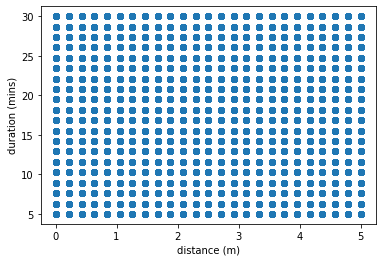

In [ ]:
data = make_input_data()
plt.figure()
plt.scatter(data['distance_grid'], data['duration_grid'])
plt.xlabel('distance (m)')
plt.ylabel('duration (mins)')


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
distance = data['distance_grid']
duration = data['duration_grid']
onset = data['symptom_grid']
ax.scatter(distance, duration, onset)
ax.set_xlabel('distance (m)')
ax.set_ylabel('duration (min)')
ax.set_zlabel('onset (day)')
#plt.colorbar()
ax.view_init(elev=10., azim=30)

## Grid probabilities

In [ ]:
def hazard_score_grid(data, params):
  doses = hazard_score_batch(data['atten_grid'], data['duration_grid'], data['symptom_grid'], params)
  return doses

def prob_infection_grid(data, params):
  doses = hazard_score_grid(data, params)
  ps = 1-np.exp(-params.beta * doses)
  return ps


def risk_score_grid(data, config):
  rs = risk_score_batch(data['atten_grid'], data['duration_grid'], data['symptom_grid'], config)
  return rs

def prob_risk_score_grid(data, config):
  risks = risk_score_grid(data, config)
  qs = 1-np.exp(-config.beta * risks)
  return qs


def risk_score_grid_sigma(data, config, sigma, ble_params=ble_params_default):
  distance_grid = data['distance_grid']
  duration_grid = data['duration_grid']
  symptom_grid = data['symptom_grid']
  atten_grid_lower, atten_grid_mid, atten_grid_upper = dist_to_atten_bounds(
      distance_grid, params=ble_params, sigma=sigma, factor=1)
  lower = risk_score_batch(atten_grid_lower, duration_grid, symptom_grid, config)
  mid = risk_score_batch(atten_grid_mid, duration_grid, symptom_grid, config)
  upper = risk_score_batch(atten_grid_upper, duration_grid, symptom_grid, config)
  return lower, mid, upper



In [ ]:
def compute_labels_grid_cdc(data, min_duration=15, max_distance=2,  min_onset=-2):
  ndx_dist = data['distance_grid'] <= max_distance
  ndx_dur = data['duration_grid'] >= min_duration
  ndx_onset = data['symptom_grid'] >= min_onset
  ndx = np.logical_and(ndx_dist, ndx_dur)
  ndx = np.logical_and(ndx, ndx_onset)
  n = len(ndx)
  y = np.zeros(n)
  y[ndx] = 1
  return y

def compute_labels_grid_prob(data, params, min_duration=15, max_distance=2, min_onset=-2):
  probs = prob_infection_grid(data, params)
  pthresh = compute_exposure_threshold(params, min_duration, max_distance, min_onset)
  y = 1.0*(probs >= pthresh)
  return y

## Weighted grid of inputs

In [ ]:
def make_names_from_bins(bins):
  names = []
  a1 = np.array([0])
  a2 = bins
  a3 = np.array([1e3])
  bins=np.concatenate((a1, a2, a3))
  n = len(bins)
  for i in range(1,n):
    name = '[{:d},{:d})'.format(int(bins[i-1]), int(bins[i]))
    names.append(name)
  return names

class ExposureDist:
  def __init__(self, atten_counts=np.ones(7), duration_counts= np.ones(7),  onset_counts=np.ones(21), name='expo-dist'):
    self.duration_counts = duration_counts
    self.atten_counts = atten_counts
    self.onset_counts = onset_counts
    self.duration_probs = duration_counts / np.sum(duration_counts)
    self.atten_probs = atten_counts / np.sum(atten_counts)
    self.distance_probs = self.atten_probs
    self.onset_probs = onset_counts / np.sum(onset_counts)
    self.name = name
    self.duration_bins = np.array([5, 10, 15, 22.5, 30, 60, 120])
    self.atten_bins = np.array([50, 55, 60, 65, 70, 75, 80])
    self.distance_bins = atten_to_dist(self.atten_bins)
    self.onset_vals = np.arange(-10,10+1)
    self.duration_names = make_names_from_bins(self.duration_bins)
    self.atten_names = make_names_from_bins(self.atten_bins)
    self.onset_names = ['{:d}'.format(i) for i in self.onset_vals]

    if not(len(self.duration_counts) == len(self.duration_bins)):
      print('duration count mismatch')
      print(self.duration_counts)
    if not(len(self.atten_counts) == len(self.atten_bins)):
      print('atten count mismatch')
      print(self.atten_counts)
    if not(len(self.onset_counts) == len(self.onset_vals)):
      print('onset count mismatch')
      print(self.onset_counts)

  def __repr__(self):
      return str(vars(self))

expo_dist_unif = ExposureDist()
print(expo_dist_unif)

onset_counts = 2*np.ones(21)
middle = np.arange(-5,5+1)
onset_counts[middle + 10] = 1
expo_dist_rnd = ExposureDist(atten_counts = np.array([1, 5, 5, 10, 10, 10, 5, 5]),
                             duration_counts = np.arange(10, 2, step=-1),
                             onset_counts = onset_counts)
print(expo_dist_rnd)



{'duration_counts': array([1., 1., 1., 1., 1., 1., 1.]), 'atten_counts': array([1., 1., 1., 1., 1., 1., 1.]), 'onset_counts': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1.]), 'duration_probs': array([0.14285714, 0.14285714, 0.14285714, 0.14285714, 0.14285714,
       0.14285714, 0.14285714]), 'atten_probs': array([0.14285714, 0.14285714, 0.14285714, 0.14285714, 0.14285714,
       0.14285714, 0.14285714]), 'distance_probs': array([0.14285714, 0.14285714, 0.14285714, 0.14285714, 0.14285714,
       0.14285714, 0.14285714]), 'onset_probs': array([0.04761905, 0.04761905, 0.04761905, 0.04761905, 0.04761905,
       0.04761905, 0.04761905, 0.04761905, 0.04761905, 0.04761905,
       0.04761905, 0.04761905, 0.04761905, 0.04761905, 0.04761905,
       0.04761905, 0.04761905, 0.04761905, 0.04761905, 0.04761905,
       0.04761905]), 'name': 'expo-dist', 'duration_bins': array([  5. ,  10. ,  15. ,  22.5,  30. ,  60. , 120. ]), 'atten_bins': array([50

In [ ]:
def compute_grid_weights(data, expo_dist):
  distance_grid = data['distance_grid']
  duration_grid = data['duration_grid']
  symptom_grid = data['symptom_grid']
  distance_buckets = np.digitize(distance_grid, expo_dist.distance_bins)
  distance_weights = expo_dist.distance_probs[distance_buckets]
  duration_buckets = np.digitize(duration_grid, expo_dist.duration_bins)
  duration_weights = expo_dist.duration_probs[duration_buckets]
  min_onset = np.min(expo_dist.onset_vals)
  onset_weights = expo_dist.onset_probs[symptom_grid + min_onset]
  weights = np.multiply(distance_weights, duration_weights)
  weights = np.multiply(weights, onset_weights)
  weights = weights / np.sum(weights)
  return weights

expo_dist = expo_dist_rnd
data = make_input_data()
w = compute_grid_weights(data, expo_dist)
print(len(w))



Making grid of 25 distances x 20 durations x 21 onsets = 10500 points
10500


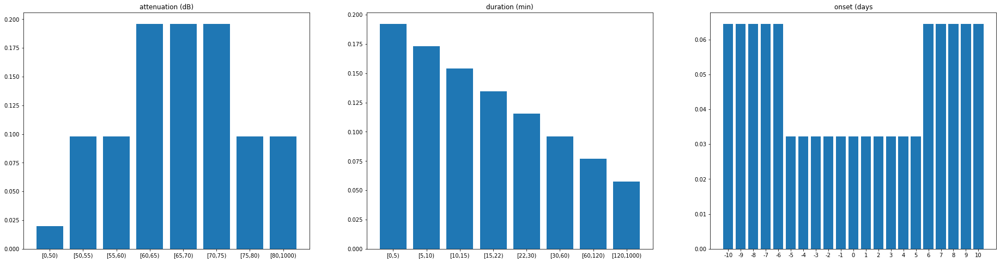

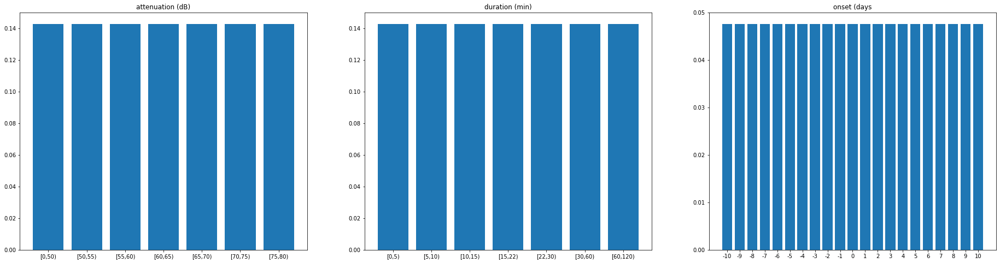

In [ ]:


def plot_expo_dist(dist):
  sz = 8
  fig, axs = plt.subplots(1,3, figsize=(sz*4,sz))
  axs = np.reshape(axs, (3))

  ax = axs[0]
  n = len(dist.atten_counts)
  ax.bar(np.arange(n), dist.atten_probs)
  ax.set_xticks(np.arange(n))
  ax.set_xticklabels(dist.atten_names)
  ax.set_title('attenuation (dB)')

  ax = axs[1]
  n = len(dist.duration_counts)
  ax.bar(np.arange(n), dist.duration_probs)
  ax.set_xticks(np.arange(n))
  ax.set_xticklabels(dist.duration_names)
  ax.set_title('duration (min)')

  ax = axs[2]
  n = len(dist.onset_counts)
  ax.bar(np.arange(n), dist.onset_probs)
  ax.set_xticks(np.arange(n))
  ax.set_xticklabels(dist.onset_names)
  ax.set_title('onset (days')

plot_expo_dist(expo_dist_rnd)
plot_expo_dist(expo_dist_unif)

In [ ]:
def add_plot(ax, data, cube, ttl):
  distance = data['distance_grid']
  duration = data['duration_grid']
  onset = data['symptom_grid']
  p = ax.scatter(distance, duration, onset, c=cube, alpha=0.2, cmap="jet")
  ax.set_xlabel('distance (m)')
  ax.set_ylabel('duration (min)')
  ax.set_zlabel('onset (day)')
  ax.set_title(ttl)
  ax.view_init(elev=10., azim=30)
  fig.colorbar(p,  shrink=0.5)
  
distances, durations, symptoms = uniform_input_data_grid(max_dur = 60,  max_dist = 10, ngrid_dist = 20, ngrid_dur=20, min_dist=0.1, min_dur=5)
data = make_input_data(distances, durations, symptoms)
weights = compute_grid_weights(data, expo_dist_rnd)
nrows = 1; ncols = 1; sz = 15;
fig = plt.figure(figsize=(sz*ncols, sz*nrows))
ax = fig.add_subplot(nrows, ncols, 1, projection='3d');
ttl = 'weights'
add_plot(ax, data, weights, ttl)




Making grid of 20 distances x 20 durations x 21 onsets = 8400 points


## Non-uniform sample  of inputs

In [ ]:
# Use the "official" ENPA bin boundaries
# https://docs.google.com/document/d/1ya0vWgdOBMc0B0MVoTt_0za69OAaCHEdFGbIl58kO0I/edit



def make_input_distributions(duration_counts=None, atten_counts=None, onset_counts=None):
  # We assume duration_counts and atten_counts are both of length 7.
  # We assume onset_counts has length 21 (-10..10)
  if duration_counts is None:
    duration_counts = duration_counts_rnd
  if atten_counts is None:
    atten_counts = atten_counts_rnd
  if onset_counts is None:
    onset_counts = onset_counts_rnd
                             
  # Note +1 in bin edges is to just be unambiguous about where integer values like 5 minutes fall
  durationBinLowerEdges = [5*60+1, 10*60+1, 15*60+1, 22.5*60+1, 30*60+1., 60*60*1, 120*60+1];
  n = len(durationBinLowerEdges) # 7
  duration_vals = np.array([(d-1)/60.0 for d in durationBinLowerEdges])
  #duration_vals = np.append(duration_vals, 1000) # for printing purposes
  #duration_labels = ['[{:0.1f},{:0.1f})'.format(duration_vals[i], duration_vals[i+1]) for i in range(n)]
  duration_labels = ['{:0.1f}-'.format(duration_vals[i]) for i in range(n)]
  duration_probs = duration_counts / np.sum(duration_counts)

  attenuationBinLowerEdges = [50.1, 55.1, 60.1, 65.1, 70.1, 75.1, 80.1];
  n = len(attenuationBinLowerEdges) # 7
  atten_vals = np.array([a-0.1 for a in attenuationBinLowerEdges])
  atten_labels = ['{:0.1f}-'.format(atten_vals[i]) for i in range(n)]
  atten_probs = atten_counts / np.sum(atten_counts)

  # Derive distance distribution from attenuation distribution
  distance_vals = np.array([atten_to_dist(a-0.1) for a in attenuationBinLowerEdges])
  n = len(attenuationBinLowerEdges) # 7
  distance_labels = ['{:0.1f}-'.format(distance_vals[i]) for i in range(n)]
  distance_counts = atten_counts
  distance_probs = distance_counts / np.sum(distance_counts)

  max_onset = 10
  onset_vals = np.arange(-max_onset, max_onset+0.1)
  onset_probs = onset_counts / np.sum(onset_counts)
  onset_labels = ['{}'.format(i) for i in onset_vals]

  distributions = {
      'duration_vals': duration_vals, 'duration_labels': duration_labels, 'duration_probs': duration_probs,
      'distance_vals': distance_vals, 'distance_labels': distance_labels, 'distance_probs': distance_probs,
      'atten_vals': atten_vals, 'atten_labels': atten_labels, 'atten_probs': atten_probs,
      'onset_vals': onset_vals, 'onset_labels': onset_labels, 'onset_probs': onset_probs
  }
  return distributions
     

def plot_input_distributions(dist):
  sz = 5
  fig, axs = plt.subplots(1,4, figsize=(sz*4,sz))
  axs = np.reshape(axs, (4))

  n = len(dist['distance_labels'])
  axs[0].bar(np.arange(n), dist['distance_probs'])
  axs[0].set_xticks(np.arange(n))
  axs[0].set_xticklabels(dist['distance_labels'])
  axs[0].set_title('distance (m)')

  n = len(dist['atten_labels'])
  axs[1].bar(np.arange(n), dist['atten_probs'])
  axs[1].set_xticks(np.arange(n))
  axs[1].set_xticklabels(dist['atten_labels'])
  axs[1].set_title('attenuations (dB)')

  n = len(dist['duration_labels'])
  #axs[1].bar(duration_vals, duration_probs)
  axs[2].bar(np.arange(n), dist['duration_probs'])
  axs[2].set_xticks(np.arange(n))
  axs[2].set_xticklabels(dist['duration_labels'])
  axs[2].set_title('durations (mins)')

  n = len(dist['onset_labels'])
  axs[3].bar(np.arange(n), dist['onset_probs'])
  axs[3].set_xticks(np.arange(n))
  axs[3].set_xticklabels(dist['onset_labels'])
  axs[3].set_title('symptom onset')



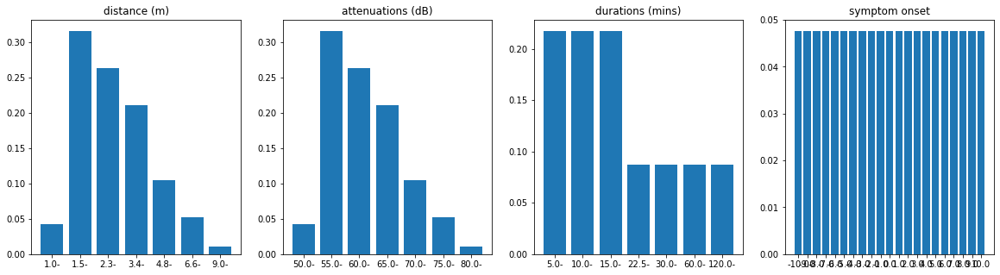

In [ ]:
duration_counts_rnd = np.array([50, 50, 50, 20, 20, 20, 20])
atten_counts_rnd = np.array([4, 30, 25, 20, 10, 5, 1])
onset_counts_rnd = np.ones(21)

distrib = make_input_distributions(duration_counts_rnd, atten_counts_rnd, onset_counts_rnd)
plot_input_distributions(distrib)


In [ ]:


def sample_from_input_distributions(nsamples, dist):
  distances = np.random.choice(dist['distance_vals'], nsamples, p=dist['distance_probs'])
  durations = np.random.choice(dist['duration_vals'], nsamples, p=dist['duration_probs'])
  onsets = np.random.choice(dist['onset_vals'], nsamples, p=dist['onset_probs'])
  return  distances, durations, onsets

def compute_empirical_distributions(distrib, distances, durations, onsets):  
  # We define the last (rightmost) bin for duration as (120-0.1, 1000)
  # where 120 is the left edge of the final bin.
  counts, _ = np.histogram(distances, bins=np.append(distrib['distance_vals']-0.1, 1000))
  distance_probs = counts / np.sum(counts)

  counts, _ = np.histogram(durations, bins=np.append(distrib['duration_vals']-0.1, 1000))
  duration_probs = counts / np.sum(counts)

  counts, _ = np.histogram(onsets, bins=np.append(distrib['onset_vals']-0.1, 1000))
  onset_probs = counts / np.sum(counts)

  distributions = {
      'duration_vals': distrib['duration_vals'], 'duration_labels': distrib['duration_labels'],
      'duration_probs': duration_probs,
      'distance_vals': distrib['distance_vals'], 'distance_labels': distrib['distance_labels'],
      'distance_probs': distance_probs,
      'atten_vals': distrib['atten_vals'], 'atten_labels': distrib['atten_labels'],
      'atten_probs': distance_probs,
      'onset_vals': distrib['onset_vals'], 'onset_labels': distrib['onset_labels'],
      'onset_probs': onset_probs
  }
  return distributions





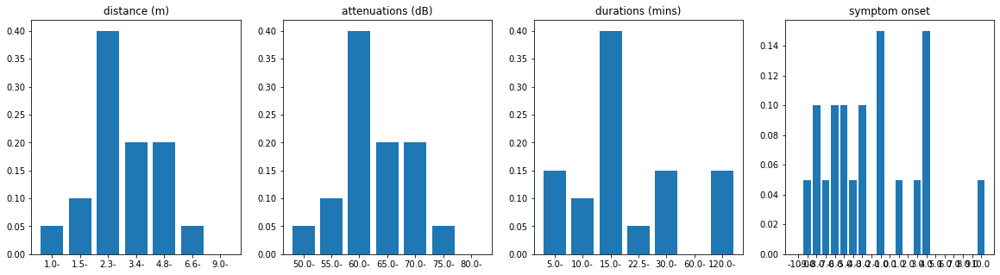

In [ ]:
np.random.seed(0)
distrib = make_input_distributions(duration_counts_rnd, atten_counts_rnd, onset_counts_rnd)
N = 20
distances, durations, onsets = sample_from_input_distributions(N, distrib)
distrib_sample = compute_empirical_distributions(distrib, distances, durations, onsets)
plot_input_distributions(distrib_sample)

# Specify risk configurations

## v1 configurations

To specify the mapping from symptom onset to infectiousness level,
 most health authorities consider the simple "step" infection function shown below, where they use weight 100\% on the standard level.

<img src="https://github.com/probml/covid19/blob/master/Figures/gaen-onset-mapping-step.png?raw=true">


In [ ]:
x = np.arange(-14, 14+0.01)
n = len(x)
assert (n==29)

pre_drop = np.array([-14, -13, -12, -11, -10, -9, -8, -7, -6])
pre = np.array([-5, -4, -3])
mid = np.array([-2, -1, 0, 1, 2])
post = np.array([3, 4, 5])
post_drop = np.array([6, 7, 8, 9, 10, 11, 12, 13, 14])

inf_levels_step = np.zeros(n, dtype=int)
inf_levels_step[mid+14] = 1
inf_levels_step[post+14] = 1
inf_levels_step[post_drop+14] = 1
print(inf_levels_step)
inf_weights_step = np.array([0, 100, 0])/100 # high is ignored

[0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
ble_thresh_swiss_v1 = np.array([55, 63])
ble_weights_swiss_v1 = np.array([100, 50, 0])/100

config_swiss = RiskConfig(ble_thresholds = ble_thresh_swiss_v1,
                          ble_weights = ble_weights_swiss_v1,
                          inf_levels = inf_levels_step,
                          inf_weights = inf_weights_step,
                          name= 'Switzerland')


ble_thresh_irish_v1 = np.array([56, 62])
ble_weights_irish_v1 = np.array([100, 100, 0])/100

config_ireland = RiskConfig(ble_thresholds = ble_thresh_irish_v1,
                            ble_weights = ble_weights_irish_v1,
                            inf_levels = inf_levels_step,
                            inf_weights = inf_weights_step,
                            name= 'Ireland')




## LFPH configurations


[LFPH doc](https://docs.google.com/document/d/1IlQHPZGi3QbD-LDUo27lH6KA-zlQMic6EofB6gl2aGA/edit?ts=5fada80e#)

Infectiousness config narrow.


<img src="https://github.com/probml/covid19/blob/master/Figures/gaen-inf-narrow.png?raw=true">

Infectiousness config wide.


<img src="https://github.com/probml/covid19/blob/master/Figures/gaen-inf-wide.png?raw=true">



In [ ]:

inf_levels_narrow = np.zeros(29, dtype=int)
inf_levels_narrow[-3+14] = 1
for t in [-2, -1, 0, 1, 2, 3]:
  inf_levels_narrow[t+14] = 2
inf_levels_narrow[4+14] = 1
print(inf_levels_narrow)
inf_weights_narrow = np.array([0, 30, 100])/100

inf_levels_wide = np.zeros(29, dtype=int)
for t in [-5, -4]:
  inf_levels_wide[t+14] = 1
for t in [-3, -2, -1, 0, 1, 2, 3, 4]:
  inf_levels_wide[t+14] = 2
for t in [5, 6, 7, 8, 9]:
  inf_levels_wide[t+14] = 1
print(inf_levels_wide)
inf_weights_wide = np.array([0, 75, 250])/100


[0 0 0 0 0 0 0 0 0 0 0 1 2 2 2 2 2 2 1 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 1 1 2 2 2 2 2 2 2 2 1 1 1 1 1 0 0 0 0 0]


In [ ]:
ble_thresh_wide = np.array([55, 70, 80])
ble_weights_wide = np.array([200, 100, 25, 0])/100
ble_thresh_narrow = np.array([53, 62, 70])
ble_weights_narrow = np.array([150, 100, 40, 0])/100

In [ ]:
config_lfph_ble_narrow_inf_narrow = RiskConfig(
    ble_thresholds = ble_thresh_narrow,
    ble_weights = ble_weights_narrow,
    inf_levels = inf_levels_narrow,
    inf_weights = inf_weights_narrow,
    name= 'LFPH-BleNarrow-InfNarrow')

config_lfph_ble_wide_inf_narrow = RiskConfig(
    ble_thresholds = ble_thresh_wide,
    ble_weights = ble_weights_wide,
    inf_levels = inf_levels_narrow,
    inf_weights = inf_weights_narrow,
    name= 'LFPH-BleWide-InfNarrow')

config_lfph_ble_narrow_inf_wide = RiskConfig(
    ble_thresholds = ble_thresh_narrow,
    ble_weights = ble_weights_narrow,
    inf_levels = inf_levels_wide,
    inf_weights = inf_weights_wide,
    name= 'LFPH-BleNarrow-InfWide')

config_lfph_ble_wide_inf_wide = RiskConfig(
    ble_thresholds = ble_thresh_wide,
    ble_weights = ble_weights_wide,
    inf_levels = inf_levels_wide,
    inf_weights = inf_weights_wide,
    name= 'LFPH-BleWide-InfWide')

## Augmented configurations

We can get better results  using the "bell" infection function shown below.


<img src="https://github.com/probml/covid19/blob/master/Figures/gaen-onset-mapping.png?raw=true">

This is based on the following recent paper:

* [The timing of COVID-19 transmission](https://www.medrxiv.org/content/10.1101/2020.09.04.20188516v1.abstract), Luca Ferretti et al, Sept. 2020

In [ ]:
x = np.arange(-14, 14+0.01)
n = len(x)
assert (n==29)

pre_drop = np.array([-14, -13, -12, -11, -10, -9, -8, -7, -6])
pre = np.array([-5, -4, -3])
mid = np.array([-2, -1, 0, 1, 2])
post = np.array([3, 4, 5])
post_drop = np.array([6, 7, 8, 9, 10, 11, 12, 13, 14])



inf_levels_bell = np.zeros(n, dtype=int)
inf_levels_bell[pre+14] = 1
inf_levels_bell[mid+14] = 2
inf_levels_bell[post+14] = 1
print(inf_levels_bell)
inf_weights_bell = np.array([0, 100, 250])/100

[0 0 0 0 0 0 0 0 0 1 1 1 2 2 2 2 2 1 1 1 0 0 0 0 0 0 0 0 0]


In [ ]:
ble_thresh_swiss_v2 = np.array([55, 60, 65])
ble_weights_swiss_v2 = np.array([100, 50, 20, 5])/100

config_swiss_inf2 = RiskConfig(ble_thresholds = ble_thresh_swiss_v1,
                          ble_weights = ble_weights_swiss_v1,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'Swiss(Inf2)')
 
config_swiss_ble2 = RiskConfig(ble_thresholds = ble_thresh_swiss_v2,
                          ble_weights = ble_weights_swiss_v2,
                          inf_levels = inf_levels_step,
                          inf_weights = inf_weights_step,
                          name= 'Swiss(Ble2)')        

config_swiss_inf2_ble2 = RiskConfig(ble_thresholds = ble_thresh_swiss_v2,
                          ble_weights = ble_weights_swiss_v2,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'Swiss(Inf2,Ble2)')  



In [ ]:


ble_thresh_irish_v2 = np.array([56, 62, 65])
ble_weights_irish_v2 = np.array([100, 50, 10, 1])/100


config_ireland_inf2 = RiskConfig(ble_thresholds = ble_thresh_irish_v1,
                          ble_weights = ble_weights_irish_v1,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'Irish(Inf2)')
 
config_ireland_ble2 = RiskConfig(ble_thresholds = ble_thresh_irish_v2,
                          ble_weights = ble_weights_irish_v2,
                          inf_levels = inf_levels_step,
                          inf_weights = inf_weights_step,
                          name= 'Irish(Ble2)')        

config_ireland_inf2_ble2 = RiskConfig(ble_thresholds = ble_thresh_irish_v2,
                          ble_weights = ble_weights_irish_v2,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'Irish(Inf2,Ble2)') 

## Arizona configurations



In this section, we show configuration for Arizona's [CovidWatch app](https://www.covidwatch.org/). This uses v1 of the API, so there are 6 infectiousness levels, with weights from the Wilson (2020) paper, as shown below.



<img src="https://github.com/probml/covid19/blob/master/Figures/infectiousness-TOST-MaselFig5A.png?raw=true">

In [ ]:
# https://www.medrxiv.org/content/10.1101/2020.07.17.20156539v2
# Arizona v1. ble_weights: [2.39, .60 , 0.06], 
# Arizona v2: 2.15, 0.79, 0.19

def arizona_infectiousness_params_v1():
  inf_pre = np.zeros((9), dtype=int)
  inf_post = np.zeros((5), dtype=int)
  inf_mid = np.array([1, 3, 4, 5, 6, 6, 6, 6, 5, 4, 3, 2, 2, 1, 1])
  inf_levels = np.concatenate((inf_pre, inf_mid, inf_post))
  inf_weights = np.array([0, 10**1, 10**1.2, 10**1.4, 10**1.6, 10**1.8, 10**2])/100
  return inf_levels, inf_weights


def arizona_infectiousness_params_v2():
  # Interpolating from Arizona by averaging some bins
  inf_levels = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0,  1, 1, 1, 2, 2,    2,    2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0 ], dtype=int)
  #inf_weights = np.array([0,  0.2, 1])
  inf_weights = np.array([0,  10**1.6, 10**2])/100
  return inf_levels, inf_weights

def arizona_ble_params_v1():
  thresholds = np.array([50, 70])
  weights = np.array([2.15, 0.79, 0.19]) #v2 of paper
  #weights = np.array([2.39, 0.6, 0.06]) #v1 of paper
  return thresholds, weights

def arizona_ble_params_v2():
  #thresholds = np.array([50, 70, 75])
  thresholds = np.array([50, 60, 70])
  weights = np.array([2.15, 0.79, 0.19, 0.1])
  return thresholds, weights

levels, weights = arizona_infectiousness_params_v1()
thresholds, ble_weights = arizona_ble_params_v1()
config_arizona_inf1_ble1 = RiskConfig(ble_thresholds = thresholds,
                            ble_weights = ble_weights,
                            inf_weights = weights,
                            inf_levels = levels,
                            name = 'Arizona(Inf1,Ble1)')

levels, weights = arizona_infectiousness_params_v2()
thresholds, ble_weights = arizona_ble_params_v1()
config_arizona_inf2_ble1 = RiskConfig(ble_thresholds = thresholds,
                            ble_weights = ble_weights,
                            inf_weights = weights,
                            inf_levels = levels,
                            name = 'Arizona(Inf2,Ble1)')

levels, weights = arizona_infectiousness_params_v1()
thresholds, ble_weights = arizona_ble_params_v2()
config_arizona_inf1_ble2 = RiskConfig(ble_thresholds = thresholds,
                            ble_weights = ble_weights,
                            inf_weights = weights,
                            inf_levels = levels,
                            name = 'Arizona(Inf1,Ble2)')

levels, weights = arizona_infectiousness_params_v2()
thresholds, ble_weights = arizona_ble_params_v2()
config_arizona_inf2_ble2 = RiskConfig(ble_thresholds = thresholds,
                            ble_weights = ble_weights,
                            inf_weights = weights,
                            inf_levels = levels,
                            name = 'Arizona(Inf2,Ble2)')

## Other configurations

In [ ]:
config_baseline = RiskConfig(ble_thresholds = np.array([54, 61, 65]),
                          ble_weights = np.array([100, 50, 10, 1])/100,
                          inf_levels = inf_levels_bell, 
                          inf_weights = np.array([0, 100, 250])/100,
                          name= 'Baseline') 

config_baseline_inf2_ble2 = RiskConfig(ble_thresholds = np.array([54, 61, 65]),
                          ble_weights = np.array([100, 50, 10, 1])/100,
                          inf_levels = inf_levels_bell,
                          inf_weights = np.array([0, 50, 100])/100,
                          name= 'Baseline(Inf2,Ble2)') 

config_baseline_inf2_ble1 = RiskConfig(ble_thresholds = np.array([54, 61]),
                          ble_weights = np.array([100, 50, 10])/100,
                          inf_levels = inf_levels_bell,
                          inf_weights = np.array([0, 50, 100])/100,
                          name= 'Baseline(Inf2,Ble1)')

levels, weights = arizona_infectiousness_params_v1()
config_baseline_inf1_ble2 = RiskConfig(ble_thresholds = np.array([54, 61, 65]),
                          ble_weights = np.array([100, 50, 10, 1])/100,
                          inf_levels = levels,
                          inf_weights = weights,
                          name= 'Baseline(Inf1,Ble2)') 

config_baseline_inf1_ble1 = RiskConfig(ble_thresholds = np.array([54, 61]),
                          ble_weights = np.array([100, 50, 10])/100,
                          inf_levels = levels,
                          inf_weights = weights,
                          name= 'Baseline(Inf1,Ble1)')


# MLE from this colab
# https://colab.research.google.com/drive/15nXTff9J5ENSMMv--jv3GZBiJDK575LC#scrollTo=JasV7lszXPG2&line=40&uniqifier=1
config_mle_old = RiskConfig(ble_thresholds=np.array([48, 55, 68]), 
                        ble_weights=np.array([0.85666157, 0.48723532, 0.09916121, 0.01088132]), 
                        inf_levels=inf_levels_bell,
                        inf_weights=np.array([0.05143722, 0.38729749, 2.09296849]),
                        name='MLE-SLSQP_thresh')
print(config_mle_old)


config_mle = RiskConfig(
    ble_thresholds = np.array([51, 55, 60]),
    ble_weights = np.array([2.0 , 0.85736429, 0.43377265, 0.09823837]), 
    inf_levels = inf_levels_bell,
    inf_weights = np.array([0.0 , 0.16224057, 0.86111397]),
    name='MLE', beta=0.00031)
print(config_mle)



RiskConfig(ble_thresholds=array([48, 55, 68]), ble_weights=array([0.85666157, 0.48723532, 0.09916121, 0.01088132]), inf_levels=array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0]), inf_weights=array([0.05143722, 0.38729749, 2.09296849]), name='MLE-SLSQP_thresh', beta=0.00031)
RiskConfig(ble_thresholds=array([51, 55, 60]), ble_weights=array([2.        , 0.85736429, 0.43377265, 0.09823837]), inf_levels=array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0]), inf_weights=array([0.        , 0.16224057, 0.86111397]), name='MLE', beta=0.00031)


# Binary classification

One way to compare configurations is in terms of their ability to classify a 'risky' exposure vs a 'safe' exposure. We can define this in several ways.

## 'Risky' vs 'safe' exposure

Let $x^*$ correspond to a "meaningful exposure",
[which is defined by the CDC](https://www.cdc.gov/coronavirus/2019-ncov/php/contact-tracing/contact-tracing-plan/appendix.html#contact) to be "a close contact is defined as any individual who was within 6 feet of an infected person for at least 15 minutes starting from 2 days before illness onset." At this exposure level, the probability of infection is $p^*=p(y=1|x^*)$. We can classify a new exposure $x$ as risky iff $p(x)>p^*$. Alternatively, we can just compare $x$ to $x^*$ in terms of its features (although this does not let us trade off risk factors).






In [ ]:
def compute_exposure_threshold(params, duration=15, distance=2, symptom_onset=-2):
  atten = dist_to_atten(distance, params.ble_params)
  pthresh = prob_infection_batch(atten, duration, symptom_onset, params)
  return pthresh

params = ModelParams()
pthresh_cdc = compute_exposure_threshold(params)
print(pthresh_cdc)

0.004010193395656114


In [ ]:
def compute_labels_grid_features(data, min_duration=15, max_distance=2,  min_onset=-2):
  ndx_dist = data['distance_grid'] <= max_distance
  ndx_dur = data['duration_grid'] >= min_duration
  ndx_onset = data['symptom_grid'] >= min_onset
  ndx = np.logical_and(ndx_dist, ndx_dur)
  ndx = np.logical_and(ndx, ndx_onset)
  n = len(ndx)
  y = np.zeros(n)
  y[ndx] = 1
  return y

def compute_labels_grid_prob(data, params, min_duration=15, max_distance=2, min_onset=-2):
  probs = prob_infection_grid(data, params)
  pthresh = compute_exposure_threshold(params, min_duration, max_distance, min_onset)
  y = 1.0*(probs >= pthresh)
  return y

## Compare configurations on a set of scenarios

In [ ]:
# Make some scenarios
#%load_ext google.colab.data_table

distances = np.array([1.5, 2, 2.5])
durations = np.array([10, 15, 20])
symptoms = np.array([-2, 0])

data = make_input_data(distances, durations, symptoms)
params = ModelParams()

pthresh = compute_exposure_threshold
probs = prob_infection_grid(data, params)

labels_features = compute_labels_grid_features(data)
labels_prob = compute_labels_grid_prob(data, params)
labels_agree = (labels_features == labels_prob)

X = {'distances': data['distance_grid'],
     'durations': data['duration_grid'],
     'symptoms': data['symptom_grid'],
     'label(features)': labels_features,
     'label(prob)': labels_prob,
     'label(same?)': labels_agree,
      'P(infect)': probs }
df = pd.DataFrame(data = X)

#df.style.hide_index()
#df

from IPython.display import display, HTML
display(HTML(df.to_html(index=False)))

Making grid of 3 distances x 3 durations x 2 onsets = 18 points


distances,durations,symptoms,label(features),label(prob),label(same?),P(infect)
1.5,10.0,-2,0.0,0.0,True,0.003909
1.5,10.0,0,0.0,1.0,False,0.005831
1.5,15.0,-2,1.0,1.0,True,0.005858
1.5,15.0,0,1.0,1.0,True,0.008734
1.5,20.0,-2,1.0,1.0,True,0.007803
1.5,20.0,0,1.0,1.0,True,0.011629
2.0,10.0,-2,0.0,0.0,True,0.002675
2.0,10.0,0,0.0,0.0,True,0.003992
2.0,15.0,-2,1.0,1.0,True,0.004010
2.0,15.0,0,1.0,1.0,True,0.005982


In [ ]:
distances = np.array([1.5, 2, 2.5, 3, 4, 5, 6])
durations = np.array([10, 15, 20])
symptoms = np.array([-2, 0])
attens = dist_to_atten(distances)

data = make_input_data(distances, durations, symptoms)
params = ModelParams(distance_fun='sigmoid', distance_inflection=2.0)

pthresh = compute_exposure_threshold
probs = prob_infection_grid(data, params)


labels_features = compute_labels_grid_features(data)
labels_prob = compute_labels_grid_prob(data, params)

X = {'distances': data['distance_grid'],
     'durations': data['duration_grid'],
     'symptoms': data['symptom_grid'],
      'P(infect)': probs,
     'label(prob)': labels_prob }
df = pd.DataFrame(data = X)

names = []
risk_thresh = 15
config_list = [config_mle, config_swiss,  config_swiss_ble2, config_swiss_inf2, config_swiss_inf2_ble2]
for config in config_list:
  risks = risk_score_grid(data,  config)
  X[config.name] = risks
  pred = (risks >= risk_thresh)
  labels = labels_prob
  npos = np.sum(labels==1)
  nneg = np.sum(labels==0)
  ntp = np.sum((pred==1) * (labels==1))
  nfp = np.sum((pred==1) * (labels==0))
  names.append(config.name)

df = pd.DataFrame(data = X)

from IPython.display import display, HTML
display(HTML(df.to_html(index=False)))

Making grid of 7 distances x 3 durations x 2 onsets = 42 points


distances,durations,symptoms,P(infect),label(prob),MLE,Switzerland,Swiss(Ble2),Swiss(Inf2),"Swiss(Inf2,Ble2)"
1.5,10.0,-2,0.003909,0.0,7.382884,10.0,10.00,25.00,25.000
1.5,10.0,0,0.005831,1.0,7.382884,10.0,10.00,25.00,25.000
1.5,15.0,-2,0.005858,1.0,11.074326,15.0,15.00,37.50,37.500
1.5,15.0,0,0.008734,1.0,11.074326,15.0,15.00,37.50,37.500
1.5,20.0,-2,0.007803,1.0,14.765767,20.0,20.00,50.00,50.000
1.5,20.0,0,0.011629,1.0,14.765767,20.0,20.00,50.00,50.000
2.0,10.0,-2,0.002675,0.0,3.735277,5.0,5.00,12.50,12.500
2.0,10.0,0,0.003992,0.0,3.735277,5.0,5.00,12.50,12.500
2.0,15.0,-2,0.004010,1.0,5.602915,7.5,7.50,18.75,18.750
2.0,15.0,0,0.005982,1.0,5.602915,7.5,7.50,18.75,18.750


## 3d cubes

In [ ]:


distances, durations, symptoms = uniform_input_data_grid(max_dur = 60,  max_dist = 5, ngrid_dist = 25, ngrid_dur=25, min_dist=0.1, min_dur=5)
data = make_input_data(distances, durations, symptoms)
distance = data['distance_grid']
duration = data['duration_grid']
onset = data['symptom_grid']
params = ModelParams()
thresholds = {'duration': [15, 5], 'distance': [2, 2], 'onset': [-2,-2]}
nthresh = len(thresholds)
fignum = 1
for n in range(2):
  min_duration = thresholds['duration'][n]
  max_distance = thresholds['distance'][n]
  min_onset = thresholds['onset'][n]
  labels_features = compute_labels_grid_features(data, min_duration, max_distance, min_onset)
  labels_prob = compute_labels_grid_prob(data, params, min_duration, max_distance, min_onset)
  ys = [labels_features, labels_prob]
  nrows = 2; ncols = 2; sz = 10;
  fig = plt.figure(figsize=(sz*ncols, sz*nrows))
  for i in range(2):
    y = ys[i]
    ax = fig.add_subplot(nrows, ncols, fignum, projection='3d');
    ax.scatter(distance, duration, onset, c=y)
    ax.set_xlabel('distance (m)')
    ax.set_ylabel('duration (min)')
    ax.set_zlabel('onset (day)')
    if i==0:
      npos = np.sum(labels_features)
      ntot = len(distance)
      pos_frac = npos/ntot;
      ttl = 'pos={:0.1f}%, dur>={} & dist<={} & onset>={}'.format(pos_frac*100, min_duration, max_distance, min_onset)
    else:
      npos = np.sum(labels_prob)
      ntot = len(distance)
      pos_frac = npos/ntot;
      ttl = 'pos={:0.2f}%, p>=p(dur={}, dist={}, onset={})'.format(pos_frac*100, min_duration, max_distance, min_onset)
    ax.set_title(ttl)
    ax.view_init(elev=10., azim=30)
    fignum += 1

Making grid of 25 distances x 25 durations x 21 onsets = 13125 points


In [ ]:
distances, durations, symptoms = uniform_input_data_grid(max_dur = 60,  max_dist = 5, ngrid_dist = 20, ngrid_dur=20, min_dist=0.1, min_dur=5)
data = make_input_data(distances, durations, symptoms)
distance = data['distance_grid']
duration = data['duration_grid']
onset = data['symptom_grid']

params = ModelParams()
pinfect = prob_infection_grid(data, params)
expo_dist = expo_dist_rnd

labels_features = compute_labels_grid_features(data, min_duration=15, max_distance=2, min_onset=-2)
labels_prob = compute_labels_grid_prob(data, params, min_duration=15, max_distance=2, min_onset=-2)
labels_true  = labels_prob

def add_plot(ax, cube, ttl):
  p = ax.scatter(distance, duration, onset, c=cube, alpha=0.2, cmap="viridis")
  ax.set_xlabel('distance (m)')
  ax.set_ylabel('duration (min)')
  ax.set_zlabel('onset (day)')
  ax.set_title(ttl)
  ax.view_init(elev=10., azim=30)
  fig.colorbar(p,  shrink=0.5)

config_list = [config_mle, config_swiss]


n = len(config_list)
nrows = n; ncols = 5; sz = 6;
fig = plt.figure(figsize=(sz*ncols, sz*nrows))
counter = 0
risk_thresh = 15
for i in range(n):
  config = config_list[i]
  risk_scores = risk_score_grid(data, config)
  labels_pred = (risk_scores>=risk_thresh)

  tp = np.multiply(labels_pred==1, labels_true==1) 
  fp = np.multiply(labels_pred==1, labels_true==0) 
  tn = np.multiply(labels_pred==0, labels_true==0)
  fn = np.multiply(labels_pred==0, labels_true==1) 
  errors = np.zeros_like(tp)
  errors = errors + 1*tp + 2*fp + 3*tn + 4*fn

  counter += 1
  ax = fig.add_subplot(nrows, ncols, counter, projection='3d');
  ttl = 'p(infect), {}'.format(config.name)
  add_plot(ax, pinfect, ttl)

  counter += 1
  ax = fig.add_subplot(nrows, ncols, counter, projection='3d');
  ttl = 'p(infect)>p*, {}'.format(config.name)
  add_plot(ax, labels_true, ttl)

  counter += 1
  ax = fig.add_subplot(nrows, ncols, counter, projection='3d');
  ttl = 'risk scores, {}'.format(config.name)
  add_plot(ax, risk_scores, ttl)

  counter += 1
  ax = fig.add_subplot(nrows, ncols, counter, projection='3d');
  ttl = 'risk >= {}, {}'.format(risk_thresh, config.name)
  add_plot(ax, labels_pred, ttl)

  if True:
    counter += 1
    ax = fig.add_subplot(nrows, ncols, counter, projection='3d');
    ttl = 'errors, {}'.format(config.name)
    add_plot(ax, errors, ttl)



plt.tight_layout()

Making grid of 20 distances x 20 durations x 21 onsets = 8400 points


In [ ]:
data = make_input_data()
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
distance = data['distance_grid']
duration = data['duration_grid']
onset = data['symptom_grid']
ps = prob_infection_batch([], duration, onset, params, distance)
ax.scatter(distance, duration, onset, c=ps)
ax.set_xlabel('distance (m)')
ax.set_ylabel('duration (min)')
ax.set_zlabel('onset (day)')
#plt.colorbar()
ax.view_init(elev=10., azim=30)

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


## Cube plotting code


In [ ]:


def plot_cubes(data, params, config, risk_thresh=15, min_duration=15, max_distance=2, min_onset=-2):
  distance = data['distance_grid']
  duration = data['duration_grid']
  onset = data['symptom_grid']
  pinfect = prob_infection_grid(data, params)
  labels_true = compute_labels_grid_prob(data, params, min_duration=min_duration,
                                         max_distance=max_distance, min_onset=min_onset)
  risk_scores = risk_score_grid(data, config)
  labels_pred = (risk_scores>=risk_thresh)

  nrows = 1; ncols = 2; sz = 10
  fig = plt.figure(figsize=(sz*ncols, sz*nrows))
  cubes = [labels_true, labels_pred]
  #cubes = [pinfect, labels_pred]
  ttls = ['true labels (dur>={}, dist<={}, onset>={})'.format(min_duration, max_distance, min_onset),
          'predicted labels (risk thresh={:0.1f})'.format(risk_thresh)]
  for i in range(2):
    cube = cubes[i]
    ttl = ttls[i]
    ax = fig.add_subplot(nrows, ncols, i+1, projection='3d');
    p = ax.scatter(onset, distance, duration, c=cube, alpha=0.3, cmap="viridis")
    ax.set_ylabel('distance (m)')
    ax.set_zlabel('duration (min)')
    ax.set_xlabel('onset (day)')
    ax.set_title(ttl)
    ax.view_init(elev=10., azim=30)
    fig.colorbar(p,  shrink=0.5)




In [ ]:
distances, durations, symptoms = uniform_input_data_grid(max_dur = 30,  max_dist = 5, ngrid_dist = 25, ngrid_dur=25, min_dist=0.1, min_dur=5)
data = make_input_data(distances, durations, symptoms)
plot_cubes(data, params, config_mle, risk_thresh=15)
plot_cubes(data, params, config_mle, risk_thresh=5)

Making grid of 25 distances x 25 durations x 21 onsets = 13125 points


## Confusion matrices

In [ ]:

from sklearn.metrics import confusion_matrix

#https://stackoverflow.com/questions/32462881/add-colorbar-to-existing-axis
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_confusion_matrices(data, config_list, risk_thresh=15):
  params = ModelParams()
  labels = compute_labels_grid_prob(data, params)
  n = len(config_list)
  sz = 7
  fig, axs = plt.subplots(1,n, figsize=(sz*n,sz))
  for i, config in enumerate(config_list):
    ax = axs[i]
    scores = risk_score_grid(data, config)
    predicted = (scores >= risk_thresh)
    cf = confusion_matrix(labels, predicted)
    plot_binary_confusion_matrix(ax, cf, config.name)


def plot_binary_confusion_matrix(ax, cf, ttl):
  im = ax.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
  #im = ax.imshow(cf,interpolation='nearest')
  divider = make_axes_locatable(ax)
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(im, cax=cax, orientation='vertical')
  #fig.colorbar(im)

  ax.set_title(ttl)
  ax.set_xlabel('Predicted')
  ax.set_ylabel('Actual')
  tick_marks = [0, 1]
  class_labels = ['0','1']
  ax.set_xticks(tick_marks)
  ax.set_xticklabels(class_labels)
  ax.set_yticks(tick_marks)
  ax.set_yticklabels(class_labels)

  # plotting text value inside cells
  thresh = cf.max() / 2.
  TN = cf[0,0]
  FP = cf[0,1]
  FN = cf[1,0]
  TP = cf[1,1]
  TNR = TN/(TN+FP) # specifity
  FPR = FP/(TN+FP) 
  FNR = FN/(FN+TP)
  TPR = TP/(FN+TP) # sensitivity = recall
  NPV = FN/(TN+FN) 
  FDR = FP/(FP+TP)
  FOR = FN/(TN+FN)
  prec = TP/(FP+TP) # PPV
  nabove = FP+TP
  for i in range(2):
    for j in range(2):
      if (i==0) & (j==0):
        txt = 'TN={:d}'.format(TN)
      elif (i==0) & (j==1):
        txt = 'FP={:d}'.format(FP)
      elif (i==1) & (j==0):
        txt = 'FN={:d}'.format(FN)
      elif (i==1) & (j==1):
        txt = 'TP={:d}'.format(TP)
      color='white' if cf[i,j] >thresh else 'black'
      #color = 'black'
      ax.text(j,i,txt,horizontalalignment='center',color=color,fontsize=14)

Making grid of 20 distances x 20 durations x 21 onsets = 8400 points


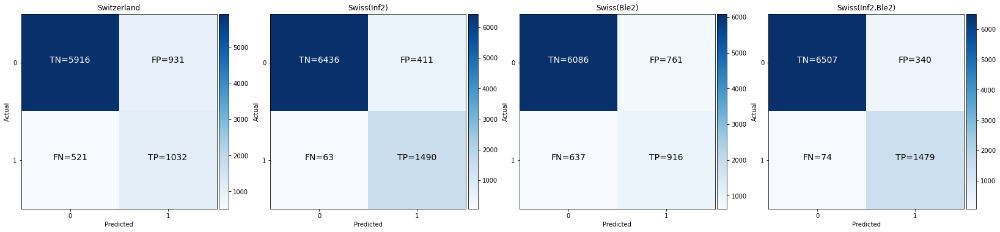

In [ ]:
# Comparison of augmentation
config_list = [config_swiss, config_swiss_inf2, config_swiss_ble2, config_swiss_inf2_ble2] 

distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

plot_confusion_matrices(data, config_list)


# ROC curves

## Standard ROC curve


Once we have a set of true binary labels $y_n$ and risk scores $r_n$  we can compute the following quantities for each risk threshold $\theta$, from which we can derive the ROC curve, which plots true positive rate (TPR) vs false positive rate (FPR), comptued as follows:

$$
\begin{align}
\text{TP}(\theta) &= \sum_{n=1}^N I[y_n=1] * I[r_n \geq \theta] \\
\text{FP}(\theta) &= \sum_{n=1}^N I[y_n=0] * I[r_n \geq \theta] \\
\text{nPos} &= \sum_{n=1}^N I[y_n=1] \\
\text{nNeg} &= \sum_{n=1}^N I[y_n=0] \\
\text{TPR}(\theta) &= \frac{\text{TP}(\theta)}{\text{nPos}} \\
\text{FPR}(\theta) &= \frac{\text{FP}(\theta)}{\text{nNeg}} 
\end{align}
$$

In [ ]:
def compute_ROC_curve(data, params, config,  pthresh=pthresh_cdc):
  scores = risk_score_grid(data, config)
  probs = prob_infection_grid(data, params)
  labels = 1.0*(probs >= pthresh)
  fpr, tpr, thresholds = metrics.roc_curve(labels, scores)
  auc = metrics.auc(fpr, tpr)
  npos = np.sum(labels==1)
  nneg = np.sum(labels==0)
  results = {'fpr': fpr, 'tpr': tpr, 'thresholds': thresholds, 'auc': auc,
             'npos': npos, 'nneg': nneg, 'labels': labels, 'scores': scores}
  return results



In [ ]:

def interpolate_roc(grid_thresh, fpr, tpr, thresholds, npos, nneg, popsize=100):
  # convert from any desired set of target thresholds to point on ROC curve
  ndx = np.argsort(thresholds) # must be increasing for np.interp to work
  thresholds = thresholds[ndx]
  fpr = fpr[ndx]
  tpr = tpr[ndx]
  grid_fpr = np.interp(grid_thresh, thresholds, fpr)
  grid_tpr = np.interp(grid_thresh, thresholds, tpr)
  grid_nfp = nneg * grid_fpr
  grid_ntp = npos * grid_tpr
  npop = npos + nneg
  frac_notified = (grid_nfp + grid_ntp)/npop
  nabove = frac_notified * popsize
  stats = {'thresh_table': grid_thresh,
           'fpr_table': grid_fpr,
           'tpr_table': grid_tpr,
           'nabove_table': nabove, 
           'frac_table': frac_notified,
           'npos': npos,
           'nneg': nneg }
  return stats

In [ ]:

def find_operating_threshold(fpr, tpr, thresholds, grid_fpr):
  # convert from any desired target fpr to corresponding tpr and threshold
  grid_thresh = np.interp(grid_fpr, fpr, thresholds)
  grid_tpr = np.interp(grid_fpr, fpr, tpr)
  return grid_thresh, grid_tpr



def compute_roc_stats_at_threshold(labels, scores, target_thresh=15):
  # Compute performance statistics at given threshold
  npos = np.sum(labels==1); nneg = np.sum(labels==0)
  fp = np.sum( (labels==0) * (scores > target_thresh) ) 
  tp = np.sum( (labels==1) * (scores > target_thresh) )
  target_fpr = fp / nneg;
  target_tpr = tp / npos;
  target_tnr = 1-target_fpr
  target_fnr = 1-target_tpr

  nfp = nneg * target_fpr
  ntp = npos * target_tpr
  ntn = nneg * target_tnr
  nfn = npos * target_fnr

  npred_pos = nfp + ntp 
  npred_neg = ntn + nfn
  nabove = npred_pos
  prec = ntp / npred_pos
  recall = ntp/ npos # sensitivity
  spec = ntn / nneg # specifity
  fdr = nfp / npred_pos
  npv = ntn / npred_neg

  txt = 'Thresh: {:0.3f}\n #EN: {:0.1f}/{:0.1f}={:0.3f}\n Prec: {:0.1f}/{:0.1f}={:0.3f}\n Recall: {:0.1f}/{:0.1f}={:0.3f}\n FDR: {:0.1f}/{:0.1f}={:0.3f}'.format(
           target_thresh,
           npred_pos,  (npos+nneg), npred_pos / (npos+nneg), 
            ntp, npred_pos, prec,
            ntp, npos, recall, 
            nfp, npred_pos,  fdr)
  stats = {
           'target_fpr': target_fpr,
           'target_tpr': target_tpr,
           'target_thresh': target_thresh,
           'npred_pos': npred_pos,
           'nabove': nabove,
           'prec': prec,
           'recall': recall,
           'spec': spec,
           'fdr': fdr,
           'npv': npv, 
           'npos': npos,
           'nneg': nneg,
           'ntp': ntp,
           'nfp': nfp,
           'txt': txt
           }

  return stats

In [ ]:
from cycler import cycler
import itertools

def add_roc_curve(data, params, config, ax, color, show_text=False, marker=None, pthresh=pthresh_cdc):
  res = compute_ROC_curve(data, params, config, pthresh)
  fpr = res['fpr']; tpr = res['tpr'];
  thresholds = res['thresholds']; auc = res['auc']
  label = '{}: auc {:0.3f}'.format(config.name, auc)
  if marker:
    ax.plot(fpr, tpr, label=label, color=color, marker=marker)
  else:
    ax.plot(fpr, tpr, label=label, color=color)
  ax.legend()
  ax.set_xlabel('FPR')
  ax.set_ylabel('TPR')
  stats = compute_roc_stats_at_threshold(res['labels'], res['scores'])
  x = stats['target_fpr'];
  y = stats['target_tpr']
  txt = stats['txt']
  #ax.set_title('label {}'.format(label_type))
  if show_text:
    ax.plot(x, y, '*', color=color, markersize=15)
    #x = 0.4; y = 0.2;
    dx = 0.05; dy = -0.07
    ax.text(x+dx, y+dy, txt, color=color)


def plot_roc_curves(data, config_list,  same_fig=False, show_text=False, pthresh=pthresh_cdc, params=ModelParams()):
  n = len(config_list)
  prop_cycle = plt.rcParams['axes.prop_cycle']
  colors = prop_cycle.by_key()['color']
  markers = itertools.cycle((',', '+', '.', 'o', '*')) 
  if same_fig:  
    fig, ax = plt.subplots(1,1, figsize=(5,5))
  else:
    fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
    if n==1:
      axs = [axs]
  for i, config in enumerate(config_list):
    color = colors[i]
    marker = next(markers)
    marker = None
    if not same_fig:
       ax = axs[i]
    add_roc_curve(data, params, config, ax, color, show_text, marker, pthresh_cdc)
  



In [ ]:


def compare_roc_curves(data, config_list, risk_thresh=15, pthresh=pthresh_cdc, params=ModelParams()):
  name_list = []
  nabove_list = []
  prec_list = []
  recall_list = []
  fdr_list = []
  auc_list = []
  npv_list = []
  spec_list = []
  for i, config in enumerate(config_list):
    res = compute_ROC_curve(data, params, config, pthresh)
    stats = compute_roc_stats_at_threshold(res['labels'], res['scores'], risk_thresh)
    name_list.append(config.name)
    nabove_list.append(stats['nabove'])
    prec_list.append(stats['prec'])
    recall_list.append(stats['recall'])
    fdr_list.append(stats['fdr'])
    npv_list.append(stats['npv'])
    spec_list.append(stats['spec'])
    auc_list.append(res['auc'])

  X = {'name': name_list,
       'auc': auc_list,
       '#en': nabove_list,
       'sens': recall_list,
       'spec': spec_list ,
       'ppv': prec_list,
       'npv': npv_list }
  df = pd.DataFrame(data = X)
  print(df)
  #from IPython.display import display, HTML
  IPython.display.display(IPython.display.HTML(df.to_html(index=False, float_format=lambda x: '{:5.3f}'.format(x))))

Making grid of 25 distances x 25 durations x 21 onsets = 13125 points
          name      auc     #en      sens     spec       ppv       npv
0  Switzerland  0.85468  1560.0  0.458507  0.93083  0.492308  0.921574


name,auc,#en,sens,spec,ppv,npv
Switzerland,0.855,1560.000,0.459,0.931,0.492,0.922


Making grid of 25 distances x 25 durations x 21 onsets = 13125 points
          name       auc    #en      sens      spec       ppv       npv
0  Switzerland  0.603104  195.0  0.058507  0.991528  0.502564  0.878036


name,auc,#en,sens,spec,ppv,npv
Switzerland,0.603,195.000,0.059,0.992,0.503,0.878


Making grid of 25 distances x 25 durations x 21 onsets = 13125 points
          name       auc    #en      sens      spec       ppv       npv
0  Switzerland  0.603107  390.0  0.117015  0.983057  0.502564  0.883863


name,auc,#en,sens,spec,ppv,npv
Switzerland,0.603,390.000,0.117,0.983,0.503,0.884


Making grid of 25 distances x 25 durations x 21 onsets = 13125 points
          name       auc    #en      sens      spec       ppv       npv
0  Switzerland  0.603104  195.0  0.058507  0.991528  0.502564  0.878036


name,auc,#en,sens,spec,ppv,npv
Switzerland,0.603,195.000,0.059,0.992,0.503,0.878


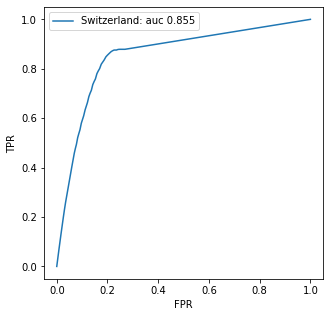

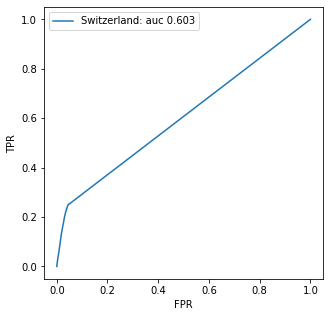

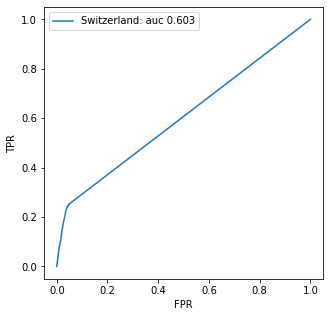

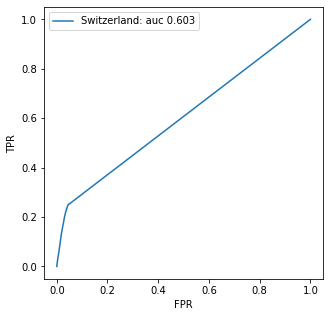

In [ ]:
# Comparison of ble
config_list = [config_swiss ] 

#distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
distances, durations, symptoms = uniform_input_data_grid(max_dur=30, min_dist=0.01, max_dist=5, ngrid_dist=25, ngrid_dur=25)
#distances, durations, symptoms = uniform_input_data_grid(max_dist=10, ngrid_dist = 25, ngrid_dur=25, max_dur=60, onset=14)

params_lognormal_old = ModelParams()
params_lognormal_old.ble_params = ble_params_lognormal_lovett
pthresh = compute_exposure_threshold(params_lognormal_old)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms, ble_params=ble_params_lognormal_lovett)
compare_roc_curves(data, config_list, params=params_lognormal_old, pthresh=pthresh)
plot_roc_curves(data, config_list, params=params_lognormal_old, pthresh=pthresh)

params_lognormal_new = ModelParams()
params_lognormal_new.ble_params = ble_params_lognormal_briers
pthresh = compute_exposure_threshold(params_lognormal_new)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms, ble_params=ble_params_lognormal_briers)
compare_roc_curves(data, config_list, params=params_lognormal_new, pthresh=pthresh)
plot_roc_curves(data, config_list, params=params_lognormal_new, pthresh=pthresh)


params_normal = ModelParams()
params_normal.ble_params = ble_params_normal_lovett
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms, ble_params=ble_params_normal_lovett)
compare_roc_curves(data, config_list, params=params_normal)
plot_roc_curves(data, config_list, params=params_normal)

params_normal_sklearn = ModelParams()
params_normal_sklearn.ble_params = ble_params_normal_sklearn
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms, ble_params=ble_params_normal_sklearn)
compare_roc_curves(data, config_list, params=params_normal_sklearn)
plot_roc_curves(data, config_list, params=params_normal_sklearn)


In [ ]:
# Comparison of v1 vs v2
config_list = [config_arizona_inf1_ble1, config_arizona_inf2_ble1, config_arizona_inf1_ble2, config_arizona_inf2_ble2 ] 

distances, durations, symptoms = uniform_input_data_grid(max_dist=10, ngrid_dist = 25, ngrid_dur=25, max_dur=60, onset=14)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

compare_roc_curves(data, config_list, risk_thresh=15)


Making grid of 25 distances x 25 durations x 29 onsets = 18125 points
                 name       auc     #en      sens      spec       ppv       npv
0  Arizona(Inf1,Ble1)  0.979676  1674.0  0.829134  0.963156  0.629032  0.986809
1  Arizona(Inf2,Ble1)  0.969213  2280.0  0.862205  0.929694  0.480263  0.988956
2  Arizona(Inf1,Ble2)  0.993139  1002.0  0.730709  0.995610  0.926148  0.980027
3  Arizona(Inf2,Ble2)  0.983371  1380.0  0.763780  0.975675  0.702899  0.982084


name,auc,#en,sens,spec,ppv,npv
"Arizona(Inf1,Ble1)",0.980,1674.000,0.829,0.963,0.629,0.987
"Arizona(Inf2,Ble1)",0.969,2280.000,0.862,0.930,0.480,0.989
"Arizona(Inf1,Ble2)",0.993,1002.000,0.731,0.996,0.926,0.980
"Arizona(Inf2,Ble2)",0.983,1380.000,0.764,0.976,0.703,0.982


In [ ]:
# Comparison of v1 vs v2
config_list = [config_baseline_inf1_ble1, config_baseline_inf2_ble1, config_baseline_inf1_ble2, config_baseline_inf2_ble2] 

distances, durations, symptoms = uniform_input_data_grid(max_dist=10, ngrid_dist = 25, ngrid_dur=25, max_dur=60, onset=10)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

compare_roc_curves(data, config_list, risk_thresh=15)

Making grid of 25 distances x 25 durations x 21 onsets = 13125 points
                  name       auc    #en      sens      spec       ppv       npv
0  Baseline(Inf1,Ble1)  0.987419  672.0  0.529134  1.000000  1.000000  0.951979
1  Baseline(Inf2,Ble1)  0.987136  876.0  0.648031  0.995529  0.939498  0.963507
2  Baseline(Inf1,Ble2)  0.993967  672.0  0.529134  1.000000  1.000000  0.951979
3  Baseline(Inf2,Ble2)  0.993256  876.0  0.648031  0.995529  0.939498  0.963507


name,auc,#en,sens,spec,ppv,npv
"Baseline(Inf1,Ble1)",0.987,672.000,0.529,1.000,1.000,0.952
"Baseline(Inf2,Ble1)",0.987,876.000,0.648,0.996,0.939,0.964
"Baseline(Inf1,Ble2)",0.994,672.000,0.529,1.000,1.000,0.952
"Baseline(Inf2,Ble2)",0.993,876.000,0.648,0.996,0.939,0.964


Making grid of 20 distances x 20 durations x 21 onsets = 8400 points
               name       auc     #en      sens      spec       ppv       npv
0       Switzerland  0.814215  1963.0  0.664520  0.864028  0.525726  0.919062
1       Swiss(Inf2)  0.980208  1901.0  0.959433  0.939974  0.783798  0.990306
2       Swiss(Ble2)  0.791001  1677.0  0.589826  0.888856  0.546213  0.905251
3  Swiss(Inf2,Ble2)  0.989334  1819.0  0.952350  0.950343  0.813084  0.988756


name,auc,#en,sens,spec,ppv,npv
Switzerland,0.814,1963.000,0.665,0.864,0.526,0.919
Swiss(Inf2),0.980,1901.000,0.959,0.940,0.784,0.990
Swiss(Ble2),0.791,1677.000,0.590,0.889,0.546,0.905
"Swiss(Inf2,Ble2)",0.989,1819.000,0.952,0.950,0.813,0.989


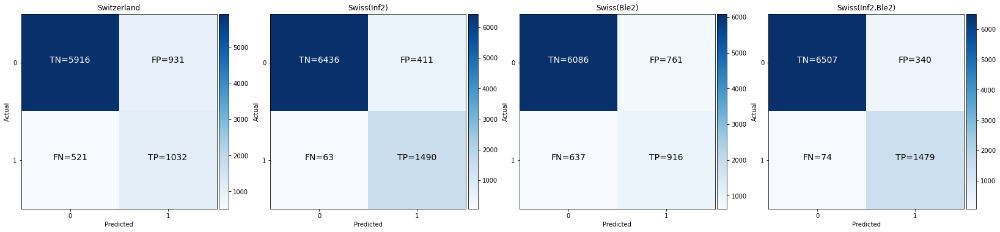

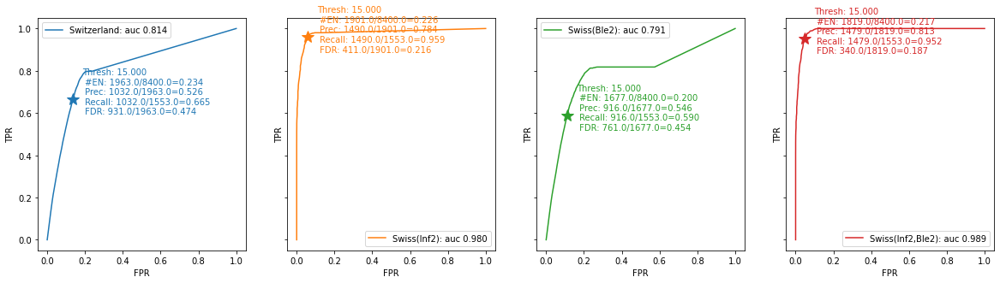

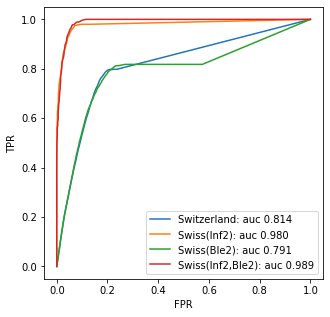

In [ ]:
# Comparison of augmentation
config_list = [config_swiss, config_swiss_inf2, config_swiss_ble2, config_swiss_inf2_ble2] 

distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

compare_roc_curves(data, config_list)
plot_confusion_matrices(data, config_list)

plot_roc_curves(data, config_list, same_fig=False, show_text=True)
plot_roc_curves(data, config_list, same_fig=True, show_text=False)

Making grid of 20 distances x 20 durations x 21 onsets = 8400 points
               name       auc     #en      sens      spec       ppv       npv
0           Ireland  0.810004  2288.0  0.730844  0.831605  0.496066  0.931610
1       Irish(Inf2)  0.975089  2101.0  0.974887  0.914269  0.720609  0.993809
2       Irish(Ble2)  0.791919  2028.0  0.683194  0.858770  0.523176  0.922787
3  Irish(Inf2,Ble2)  0.990396  1941.0  0.967804  0.936030  0.774343  0.992259


name,auc,#en,sens,spec,ppv,npv
Ireland,0.810,2288.000,0.731,0.832,0.496,0.932
Irish(Inf2),0.975,2101.000,0.975,0.914,0.721,0.994
Irish(Ble2),0.792,2028.000,0.683,0.859,0.523,0.923
"Irish(Inf2,Ble2)",0.990,1941.000,0.968,0.936,0.774,0.992


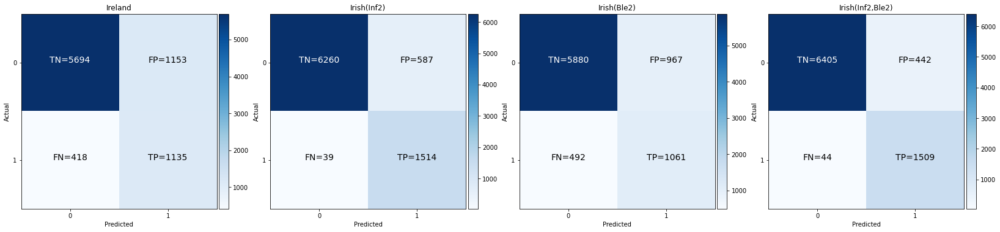

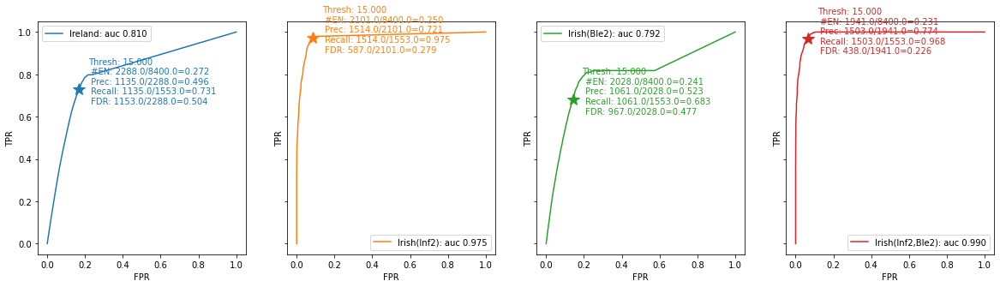

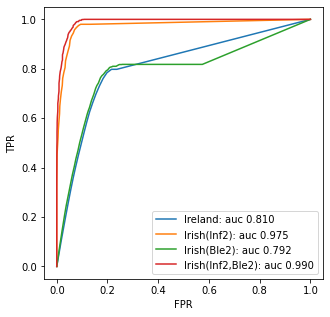

In [ ]:
# Comparison of augmentation
config_list = [config_ireland, config_ireland_inf2, config_ireland_ble2, config_ireland_inf2_ble2] 

distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

plot_confusion_matrices(data, config_list)
compare_roc_curves(data, config_list)

plot_roc_curves(data, config_list, same_fig=False, show_text=True)
plot_roc_curves(data, config_list, same_fig=True, show_text=False)


Making grid of 20 distances x 20 durations x 21 onsets = 8400 points
               name       auc     #en      sens      spec       ppv       npv
0               MLE  0.977484   725.0  0.466838  1.000000  1.000000  0.892117
1       Switzerland  0.814215  1963.0  0.664520  0.864028  0.525726  0.919062
2  Swiss(Inf2,Ble2)  0.989334  1819.0  0.952350  0.950343  0.813084  0.988756


name,auc,#en,sens,spec,ppv,npv
MLE,0.977,725.000,0.467,1.000,1.000,0.892
Switzerland,0.814,1963.000,0.665,0.864,0.526,0.919
"Swiss(Inf2,Ble2)",0.989,1819.000,0.952,0.950,0.813,0.989


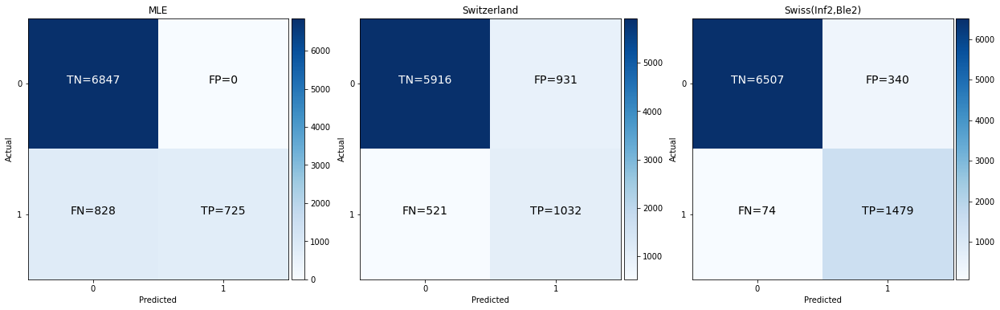

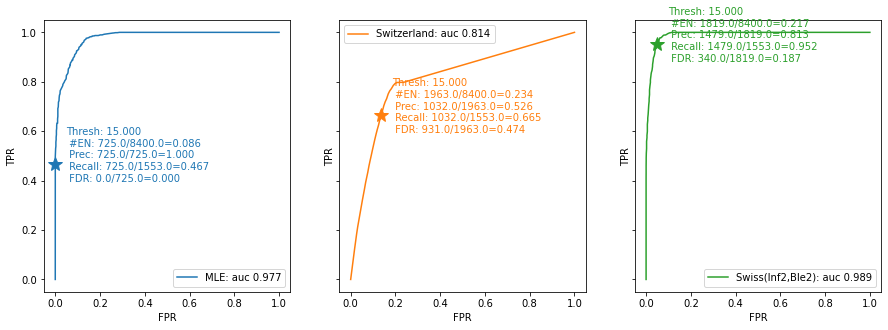

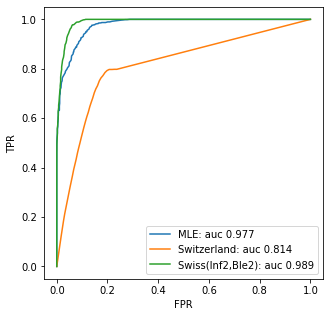

In [ ]:
# Comparison with MLE
config_list = [config_mle, config_swiss, config_swiss_inf2_ble2]

distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)

plot_confusion_matrices(data, config_list)
compare_roc_curves(data, config_list)
plot_roc_curves(data, config_list, same_fig=False, show_text=True)
plot_roc_curves(data, config_list, same_fig=True, show_text=False)

Making grid of 20 distances x 20 durations x 21 onsets = 8400 points
Making grid of 20 distances x 20 durations x 21 onsets = 8400 points


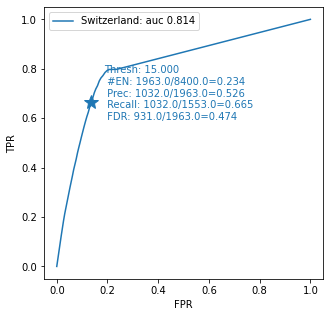

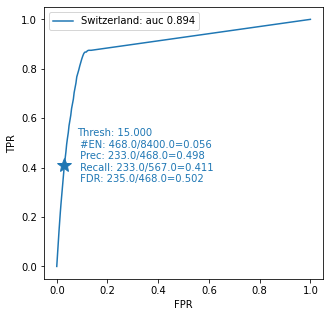

In [ ]:
# Effect of input grid
config_list = [config_swiss]

distances, durations, symptoms = uniform_input_data_grid(max_dist=5, ngrid_dist = 20, ngrid_dur=20, max_dur=60)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)
plot_roc_curves(data, config_list, same_fig=False, show_text=True)

distances, durations, symptoms = uniform_input_data_grid(max_dist=10, ngrid_dist = 20, ngrid_dur=20, max_dur=30)
data = make_input_data(distances=distances, durations=durations, symptoms=symptoms)
plot_roc_curves(data, config_list, same_fig=False, show_text=True)



Making grid of 20 distances x 20 durations x 20 onsets = 8000 points
Making grid of 20 distances x 20 durations x 20 onsets = 8000 points
Making grid of 20 distances x 20 durations x 20 onsets = 8000 points
Making grid of 20 distances x 20 durations x 20 onsets = 8000 points
Making grid of 20 distances x 20 durations x 20 onsets = 8000 points
Making grid of 20 distances x 20 durations x 20 onsets = 8000 points


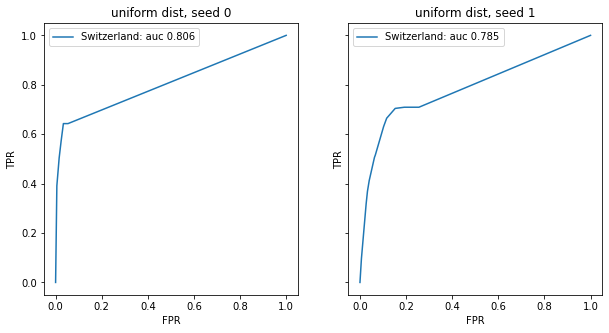

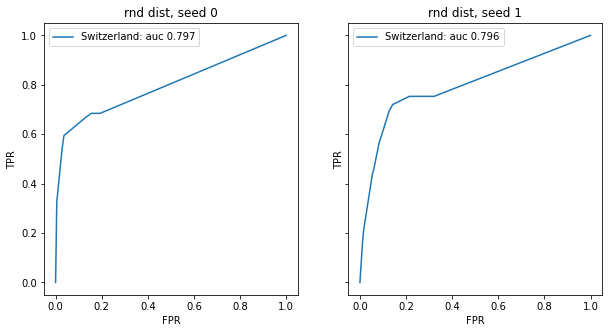

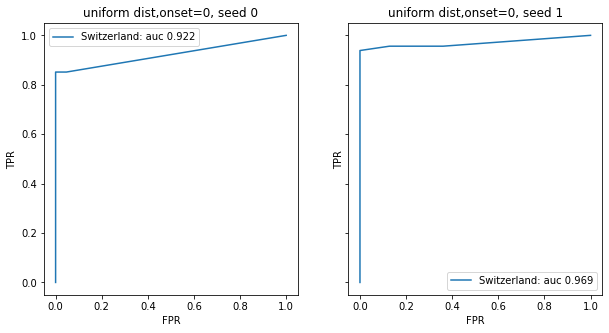

In [ ]:
# Effect of input distribution

def plot_curves(distrib, config_list, ttl=''):
  params = ModelParams()
  N = 20
  seeds = [0, 1]
  n = len(seeds)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
  for j, seed in enumerate(seeds):
    ax = axs[j]
    np.random.seed(seed)
    distances, durations, onsets = sample_from_input_distributions(N, distrib)   
    data = make_input_data(distances=distances, durations=durations, symptoms=onsets) # N^3
    prop_cycle = plt.rcParams['axes.prop_cycle']
    colors = prop_cycle.by_key()['color'] 
    for i, config in enumerate(config_list):
      color = colors[i]
      add_roc_curve(data, params, config, ax, color, show_text=False)
    ax.set_title('{}, seed {}'.format(ttl, seed))

config_list = [ config_swiss]

# Use uniform counts - similar to uniform grid
distrib = make_input_distributions(
    duration_counts = np.ones(7), atten_counts = np.ones(7), onset_counts = np.ones(21))
plot_curves(distrib, config_list, 'uniform dist')

distrib = make_input_distributions(duration_counts_rnd, atten_counts_rnd, onset_counts_rnd)
plot_curves(distrib, config_list, 'rnd dist')

# Use uniform counts , except we put all the onset mass at 0.
# This should elimiminate most of the difference between the configs.
onset_counts = np.zeros(21)
onset_counts[10] = 1.0 # spike at onset=0
distrib = make_input_distributions(
    duration_counts = np.ones(7),
    atten_counts = np.ones(7),
    onset_counts = onset_counts)
plot_curves(distrib, config_list, 'uniform dist,onset=0')

## ROC curves with upper/ lower bounds

In [ ]:
def compute_ROC_curve_upper_lower(labels, scores_lower, scores_mid, scores_upper):
  npos = np.sum(labels==1)
  nneg = np.sum(labels==0)
  fpr_lower, tpr_lower, thresholds_lower = metrics.roc_curve(labels, scores_lower)
  fpr, tpr, thresholds = metrics.roc_curve(labels, scores_mid)
  fpr_upper, tpr_upper, thresholds_upper = metrics.roc_curve(labels, scores_upper)

  fpr_grid = np.linspace(0, 1, 100)
  tpr_lower_grid = np.interp(fpr_grid, fpr_lower, tpr_lower)
  tpr_upper_grid = np.interp(fpr_grid, fpr_upper, tpr_upper)
  tpr_grid = np.mean(np.stack([tpr_lower_grid, tpr_upper_grid], 0), 0)

  #auc = metrics.auc(fpr_grid, tpr_grid)
  auc_lower = metrics.auc(fpr_grid, tpr_lower_grid)
  auc_upper = metrics.auc(fpr_grid, tpr_upper_grid)
  auc = metrics.auc(fpr, tpr)
  
  # for mousing over ROC curve in UI
  target_fpr = np.arange(0, 1, .01)
  target_thresh, target_tpr = find_operating_threshold(fpr, tpr, thresholds, target_fpr)
  #target_thresh, target_tpr = find_operating_threshold(fpr_upper, tpr_upper, thresholds_upper, target_fpr)

  results = {'fpr': fpr, 'tpr': tpr, 'thresholds': thresholds, 'auc': auc, 'auc_lower': auc_lower, 'auc_upper': auc_upper, 
          'target_fpr': target_fpr, 'target_thresh': target_thresh, 'target_tpr': target_tpr,
          'npos': npos, 'nneg': nneg, 'labels': labels, 'scores': scores_upper,
          'fpr_lower': fpr_lower, 'tpr_lower': tpr_lower,
          'fpr_upper': fpr_upper, 'tpr_upper': tpr_upper,
          'fpr_grid': fpr_grid, 'tpr_grid': tpr_grid,
          'tpr_lower_grid': tpr_lower_grid, 'tpr_upper_grid': tpr_upper_grid
          }
  return results



In [ ]:
def compute_ROC_curve_with_sigma(data, params, config, sigma, pthresh):
  probs = prob_infection_grid(data, params)
  labels = 1.0*(probs >= pthresh)
  scores_lower, scores_mid, scores_upper = risk_score_grid_sigma(data, config, sigma)
  rv = compute_ROC_curve_upper_lower(labels, scores_lower, scores_mid, scores_upper)
  return rv

In [ ]:
def  add_roc_plot_with_bounds(data, sigma, params, config, ax, color, show_text=True, pthresh=pthresh_cdc):
  res = compute_ROC_curve_with_sigma(data, params, config, sigma, pthresh)
  fpr = res['fpr']; tpr = res['tpr'];
  thresholds = res['thresholds']; auc = res['auc']
  label = '{}: auc {:0.3f}'.format(config.name, auc)
  ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='grey', alpha=0.8)
  ax.plot(fpr, tpr, '--',  color=color)
  ax.set_xlabel('FPR')
  ax.set_ylabel('TPR')
  ttl = 'sigma {:0.3f}'.format(sigma)
  ax.set_title(ttl)

  fpr_lower = res['fpr_lower']; tpr_lower = res['tpr_lower'];
  fpr_upper = res['fpr_upper']; tpr_upper = res['tpr_upper'];
  fpr_grid = res['fpr_grid'];   tpr_grid = res['tpr_grid'];  
  tpr_lower_grid = res['tpr_lower_grid'];   tpr_upper_grid = res['tpr_upper_grid'];
  ax.plot(fpr_lower, tpr_lower, ':', color=color)
  ax.plot(fpr_upper, tpr_upper, ':', color=color)
  ax.plot(fpr_grid, tpr_grid, '-', lw=2, color=color, label=label)
  ax.fill_between(fpr_grid, tpr_lower_grid, tpr_upper_grid, color=color, alpha=0.4)
  ax.legend()

  stats = compute_roc_stats_at_threshold(res['labels'], res['scores'], target_thresh=15)
  x = stats['target_fpr'];
  y = stats['target_tpr']
  txt = stats['txt']
  ax.plot(x, y, '*', color=color, markersize=15)
  if show_text:
    #x = 0.4; y = 0.2;
    dx = 0.05; dy = -0.07
    ax.text(x+dx, y+dy, txt, color=color)



Making grid of 15 distances x 15 durations x 21 onsets = 4725 points


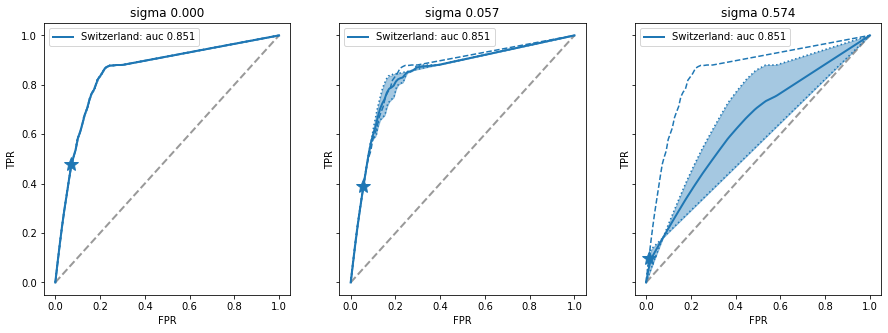

In [ ]:
def plot_curves(data, config_list, sigmas):
  params = ModelParams()
  prop_cycle = plt.rcParams['axes.prop_cycle']
  colors = prop_cycle.by_key()['color']
  n = len(sigmas)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
  for n, sigma in enumerate(sigmas):
    for i, config in enumerate(config_list):
      add_roc_plot_with_bounds(data, sigma, params, config, axs[n], colors[i], show_text=False)

config_list = [config_swiss]
ble_params = ble_params_default
sigma_mle = ble_params.sigma
sigmas = [0, 0.1*sigma_mle, sigma_mle] 
distances, durations, symptoms = uniform_input_data_grid(max_dur=30, max_dist=5, ngrid_dist=15, ngrid_dur=15)
data = make_input_data(distances, durations, symptoms)
plot_curves(data, config_list, sigmas)

## Expected ROC curve

Ultimately we want to detect people who are infected, not people who exceed the arbitrary CDC threshold of "meaningful exposure". Unfortunately, we do not know the true infection status (binary label) of each event, we just have the probabilities $p_n=p(y=1|x_n)$. We can regard these as "soft labels", and hence  compute the expected number of false positives and false negatvies as follows:


$$
\begin{align}
E[\text{TP}(\theta)] &= \sum_{n=1}^N p[y_n=1] * I[r_n \geq \theta] \\
E[\text{FP}(\theta)] &= \sum_{n=1}^N p[y_n=0] * I[r_n \geq \theta] \\
E[\text{nPos}] &= \sum_{n=1}^N p[y_n=1]  \\
E[\text{nNeg}] &= \sum_{n=1}^N p[y_n=0] 
\end{align}
$$

The ratio $\frac{E[\text{TP}(\theta)]}{E[\text{nPos}]}$ is biased estimate of the TPR, and similarly for the expected FPR. Since the denominator is a constant independent of the risk score, we can ignore it when comparing different risk scores, i.e., we can just plot ETP vs EFP, which will have the same shape. Of course, if we also change the underlying probability model, the soft labels $p_n$ will change, but this is also true of the case when we derive binary labels $y_n$ by thresholding $p_n$. 


If we want to keep the denominator term, so we can work with ratios as in a traditional ROC curve, we can use the method in Liao et al (2017) to compute an unbiased approximation to $E[\text{TPR}]$ and $E[\text{FPR}]$. We have not yet implemented this. Instead, we currently used the biased estimator  
$E[\text{TPR}] \approx \frac{E[\text{TP}(\theta)]}{E[\text{nPos}]}$, and similarly for $E[\text{FPR}]$.

* [ROC Curve Analysis in the Presence of Imperfect Reference Standards](https://pubmed.ncbi.nlm.nih.gov/28694878/), Peizhou Liao, Hao Wu, Tianwei Yu, Statistics in Biosciences, 2017. [R code](https://rdrr.io/cran/ROCS/man/e.roc.html).

In [ ]:
def expected_roc_curve(probs, scores):
  '''This is just like
  fpr, tpr, thresholds = metrics.roc_curve(y, scores)
  except y(i) is replaced by probs(i) = p(y(i)=1)
  '''
  thresholds = np.sort(np.unique(scores))[::-1] # descending
  N = len(thresholds)
  scores2 = np.tile(scores[:, np.newaxis], N)
  labels = (scores2 >= thresholds) # each column is a different binary labeling
  probs2 = np.tile(probs[:, np.newaxis], N)
  FPs = np.sum(np.multiply(labels, 1-probs2), axis=0)
  TPs = np.sum(np.multiply(labels, probs2), axis=0)
  nabove = np.sum(labels, axis=0)
  npos = np.sum(probs)
  nneg = np.sum(1-probs)
  fpr = FPs / nneg
  tpr = TPs / npos
  fdr = FPs / nabove
  ppv = TPs / nabove
  return fpr, tpr, thresholds

In [ ]:
def compute_eROC_curve(data, params, config):
  probs = prob_infection_grid(data, params)
  scores = risk_score_grid(data, config)
  #labels = (probs > pthresh)
  #fpr, tpr, thresholds = metrics.roc_curve(labels, scores)
  fpr, tpr, thresholds = expected_roc_curve(probs, scores)
  auc = metrics.auc(fpr, tpr)
  npos = np.sum(probs)
  nneg = np.sum(1-probs)
  results = {'fpr': fpr, 'tpr': tpr, 'thresholds': thresholds, 'auc': auc,
             'npos': npos, 'nneg': nneg}
  return results

In [ ]:
def plot_eroc_curves(data, config_list, same_fig=False):
  params = ModelParams()
  n = len(config_list)
  if same_fig:  
    fig, ax = plt.subplots(1,1, figsize=(5,5))
  else:
    fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
    if n==1:
      axs = [axs]
  for i, config in enumerate(config_list):
    res = compute_eROC_curve(data, params, config) # see below
    fpr = res['fpr']; tpr = res['tpr'];
    thresholds = res['thresholds']; auc = res['auc']
    if not same_fig:
       ax = axs[i]
    ax.plot(fpr, tpr, label= '{}: auc {:0.3f}'.format(config.name, auc))
    ax.legend()
    ax.set_xlabel('E[FPR]')
    ax.set_ylabel('E[TPR]')

    

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


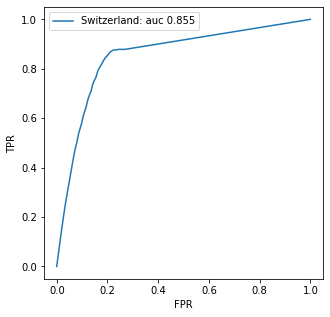

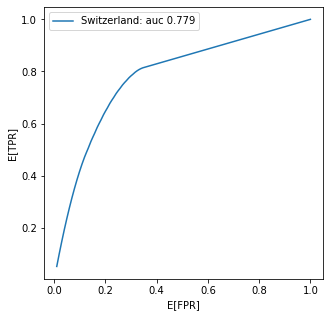

In [ ]:
config_list = [config_swiss]
data = make_input_data() # regular grid
plot_roc_curves(data, config_list,  same_fig=False)
plot_eroc_curves(data, config_list,  same_fig=False)

## Weighted ROC curve

The ROC curve is computed wrt a finite set of $N$ points. Since not all points are equally likely, we associate a weight $w_n$ with each one, to reflect how likely it is to occur. We then change from zero-one loss to *weighted zero-one loss*. The corresponding metrics are show below. This is similar to expected ROC, where $p_n=w_n I(y_n=1)$ but now $1-p_n \neq w_n I(y_n=0)$ unless $w=1$.

$$
\begin{align}
\text{wTP}(\theta) &= \sum_{n=1}^N w_n * I[y_n=1] * I[r_n \geq \theta] \\
\text{wFP}(\theta) &= \sum_{n=1}^N w_n * I[y_n=0] * I[r_n \geq \theta] \\
\text{nPos} &= \sum_{n=1}^N w_n I[y_n=1]  \\
\text{nNeg} &= \sum_{n=1}^N w_n I[y_n=0] 
\end{align}
$$



In [ ]:


def weighted_roc_curve(true_labels, scores, weights):
  fpr, tpr, thresholds = metrics.roc_curve(true_labels, scores, sample_weight=weights)
  return fpr, tpr, thresholds

def weighted_roc_curve_old(true_labels, scores, weights):
  wlabels_pos = np.multiply(true_labels, weights)
  wlabels_neg = np.multiply(1-true_labels, weights)
  thresholds = np.sort(np.unique(scores))[::-1] # descending
  N = len(thresholds)
  scores2 = np.tile(scores[:, np.newaxis], N)
  pred_labels_pos = (scores2 >= thresholds) # each column is a different binary labeling
  wlabels2_pos = np.tile(wlabels_pos[:, np.newaxis], N)
  wlabels2_neg = np.tile(wlabels_neg[:, np.newaxis], N)
  FPs = np.sum(np.multiply(pred_labels_pos, wlabels2_neg), axis=0)
  TPs = np.sum(np.multiply(pred_labels_pos, wlabels2_pos), axis=0)
  npos = np.sum(wlabels_pos)
  nneg = np.sum(wlabels_neg)
  fpr = FPs / nneg
  tpr = TPs / npos
  return fpr, tpr, thresholds

In [ ]:

#roc = compute_weighted_ROC_curve_with_sigma(data_grid, params_js, config_js, sigma, pthresh, expo_dist, w)
#rv['auc'] = {'mid': roc['auc'], 'low': roc['auc_lower'], 'high': roc['auc_upper']}
#rv['roc_array'] = compute_stats_at_roc_with_bounds(roc)

def compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w=None):
  probs = prob_infection_grid(data, params)
  labels = 1.0*(probs > pthresh)
  scores_lower, scores, scores_upper = risk_score_grid_sigma(data, config, sigma, params.ble_params)
  if w is None:
    weights = compute_grid_weights(data, expo_dist)
  else:
    weights = w*np.ones_like(probs)
  fpr, tpr, thresholds = weighted_roc_curve(labels, scores, weights)
  auc = metrics.auc(fpr, tpr)
  npos = np.sum(labels)
  nneg = np.sum(1-labels)

  # upper / lower bounds
  fpr_lower, tpr_lower, thresholds_lower = weighted_roc_curve(labels, scores_lower, weights)
  auc_lower = metrics.auc(fpr_lower, tpr_lower)
  fpr_upper, tpr_upper, thresholds_upper = weighted_roc_curve(labels, scores_upper, weights)
  auc_upper = metrics.auc(fpr_upper, tpr_upper)
  aucs = np.sort([auc_lower, auc_upper])
  auc_lower = aucs[0]; auc_upper = aucs[1]

  # interpolate to common grid 
  interp_lower = interpolate_roc(thresholds, fpr_lower, tpr_lower, thresholds_lower, npos, nneg)
  interp_upper = interpolate_roc(thresholds, fpr_upper, tpr_upper, thresholds_upper, npos, nneg)

  interp_fpr = fpr # matches thresholds

  interp_tpr_lower = interp_lower['tpr_table']
  interp_tpr_upper = interp_upper['tpr_table']
  interp_tpr = (interp_tpr_upper + interp_tpr_lower)/2
  
  interp_auc_lower = metrics.auc(interp_fpr, interp_tpr_lower)
  interp_auc_upper = metrics.auc(interp_fpr, interp_tpr_upper)
  interp_auc = metrics.auc(interp_fpr, interp_tpr)
  aucs = np.sort([interp_auc_lower, interp_auc_upper])
  interp_auc_lower = aucs[0]; interp_auc_upper = aucs[1]

  results = {'fpr': fpr, 'tpr': tpr, 'thresholds': thresholds, 
             'auc': auc, 'npos': npos, 'nneg': nneg,
             'labels': labels, 'scores': scores, 'weights': weights,
             'fpr_lower': fpr_lower, 'tpr_lower': tpr_lower, 
             'auc_lower': auc_lower, 'thresholds_lower': thresholds_lower,
             'fpr_upper': fpr_upper, 'tpr_upper': tpr_upper,
             'auc_upper': auc_upper, 'thresholds_upper': thresholds_upper,
             'sigma': sigma, 'name': config.name ,
             'interp_fpr': interp_fpr, 
             'interp_tpr_lower': interp_tpr_lower, 'interp_tpr': interp_tpr, 'interp_tpr_upper': interp_tpr_upper, 
             'interp_auc_lower': interp_auc_lower, 'interp_auc': interp_auc, 'interp_auc_upper': interp_auc_upper,
  } 
  return results




In [ ]:
def plot_wroc_curves(data, config_list, expo_dist, sigma=0, same_fig=False, w=None):
  params = ModelParams()
  pthresh = pthresh_cdc
  n = len(config_list)
  if same_fig:  
    fig, ax = plt.subplots(1,1, figsize=(5,5))
  else:
    fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
    if n==1:
      axs = [axs]
  for i, config in enumerate(config_list):
    res = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w) 
    fpr = res['fpr']; tpr = res['tpr']; auc = res['auc']
    if not same_fig:
       ax = axs[i]
    ax.set_xlabel('wFPR')
    ax.set_ylabel('wTPR')
    fpr_lower = res['fpr_lower']; tpr_lower = res['tpr_lower']; auc_lower = res['auc_lower']
    fpr_upper = res['fpr_upper']; tpr_upper = res['tpr_upper']; auc_upper = res['auc_upper']
    ax.plot(fpr_lower, tpr_lower, ':')
    ax.plot(fpr_upper, tpr_upper, ':')
    name = '{}, auc: {:0.3f} ({:0.3f}-{:0.3f})'.format(config.name, auc, auc_lower, auc_upper)
    ax.plot(fpr, tpr, label= name)
    ax.legend()


In [ ]:
def plot_wroc_curves_fill(data, config_list, expo_dist, sigma=0, same_fig=False, w=None, params=ModelParams()):
  pthresh = compute_exposure_threshold(params)
  n = len(config_list)
  if same_fig:  
    fig, ax = plt.subplots(1,1, figsize=(5,5))
  else:
    fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
    if n==1:
      axs = [axs]
  for i, config in enumerate(config_list):
    res = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w) 
    fpr = res['fpr']; tpr = res['tpr']; auc = res['auc']
    npos = res['npos']; nneg = res['nneg']
    if not same_fig:
       ax = axs[i]
    ax.set_xlabel('wFPR')
    ax.set_ylabel('wTPR')
    fpr_lower = res['fpr_lower']; tpr_lower = res['tpr_lower']; auc_lower = res['auc_lower']; 
    fpr_upper = res['fpr_upper']; tpr_upper = res['tpr_upper']; auc_upper = res['auc_upper']
    ax.plot(fpr_lower, tpr_lower, 'b:o')
    ax.plot(fpr_upper, tpr_upper, 'r:o')
    name = '{}, auc: {:0.3f} ({:0.3f}-{:0.3f})'.format(config.name, auc, auc_lower, auc_upper)
    ax.plot(fpr, tpr, 'k--o', label= name)
    ax.legend()
    
    thresh  = res['thresholds']; thresh_lower = res['thresholds_lower']; thresh_upper = res['thresholds_upper']
    interp_lower = interpolate_roc(thresh, fpr_lower, tpr_lower, thresh_lower, npos, nneg)
    interp_upper = interpolate_roc(thresh, fpr_upper, tpr_upper, thresh_upper, npos, nneg)
    interp_tpr_lower = interp_lower['tpr_table']
    interp_tpr_upper = interp_upper['tpr_table']
    interp_tpr_mid = (interp_tpr_upper + interp_tpr_lower)/2
    ax.fill_between(fpr, interp_tpr_lower, interp_tpr_upper,  alpha=0.4)
    ax.plot(fpr, interp_tpr_mid, 'g-o')

In [ ]:
def plot_wroc_curves_interp(data, config_list, expo_dist, sigma=0, same_fig=False, w=None, params=ModelParams()):
  pthresh = compute_exposure_threshold(params)
  n = len(config_list)
  if same_fig:  
    fig, ax = plt.subplots(1,1, figsize=(5,5))
  else:
    fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
    if n==1:
      axs = [axs]
  for i, config in enumerate(config_list):
    res = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w) 
    fpr = res['interp_fpr']; tpr = res['interp_tpr'];
    tpr_lower = res['interp_tpr_lower']; tpr_upper = res['interp_tpr_upper']
    auc = res['interp_auc'];
    auc_lower = res['interp_auc_lower']; auc_upper = res['interp_auc_upper']
    #auc_lower = res['interp_auc_upper']; auc_upper = res['interp_auc_lower']
    if not same_fig:
       ax = axs[i]
    ax.set_xlabel('wFPR')
    ax.set_ylabel('wTPR')
    name = '{}, auc: {:0.3f} ({:0.3f}-{:0.3f})'.format(config.name, auc, auc_lower, auc_upper)
    ax.fill_between(fpr, tpr_lower, tpr_upper,  alpha=0.4)
    ax.plot(fpr, tpr,'r', label=name)
    ax.legend()

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points
Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


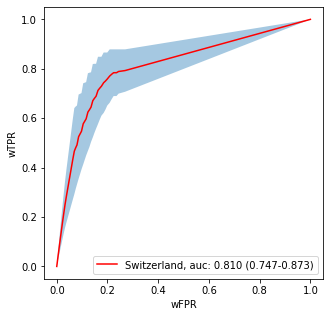

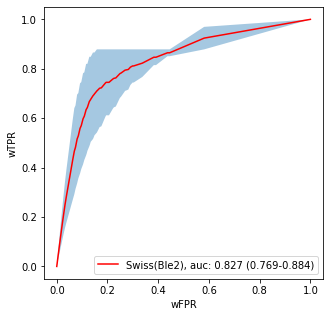

In [ ]:
config_list = [config_swiss]
data = make_input_data() # regular grid
plot_wroc_curves_interp(data, config_list,  expo_dist_rnd, sigma=0.1, w=1)

config_list = [config_swiss_ble2]
data = make_input_data() # regular grid
plot_wroc_curves_interp(data, config_list,  expo_dist_rnd, sigma=0.1, w=1)

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


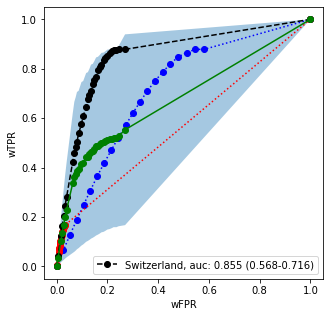

In [ ]:
config_list = [config_swiss]
data = make_input_data() # regular grid
plot_wroc_curves_fill(data, config_list,  expo_dist_rnd, sigma=0.5, w=1)


Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


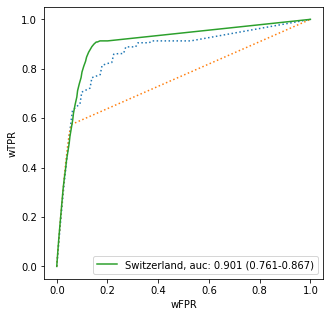

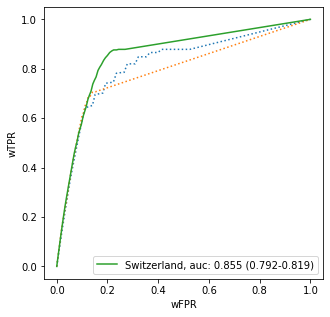

In [ ]:
config_list = [config_swiss]
data = make_input_data() # regular grid
plot_wroc_curves(data, config_list,  expo_dist_rnd, sigma=0.1, w=None)
plot_wroc_curves(data, config_list,  expo_dist_rnd, sigma=0.1, w=1)

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


Text(0.5, 1.0, '0.855')

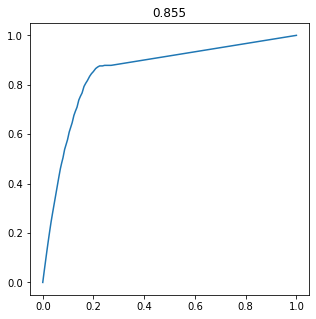

In [ ]:
data = make_input_data() 
params = ModelParams()
config  = config_swiss
sigma = 0.1
pthresh = pthresh_cdc
expo_dist = expo_dist_rnd

roc = compute_ROC_curve(data, params, config,  pthresh)
plt.figure(figsize=(5,5))
plt.plot(roc['fpr'], roc['tpr'])
plt.title('{:0.3f}'.format(roc['auc']))

## ROC stats at thresholds with confidence interval

In [ ]:
def compute_vals(field, stats_noiseless, stats_low_recall, stats_high_recall):
  val_clean = stats_noiseless[field]
  val_range = np.sort([stats_low_recall[field], stats_high_recall[field]])
  val_low = val_range[0]; val_high = val_range[1]; val_mid = np.mean([val_low, val_high]) 
  return val_low, val_mid, val_high, val_clean

def insert_vals(stats_bounds, field, val_low, val_mid, val_high, val_clean):
  stats_bounds['{}_low'.format(field)] = val_low
  stats_bounds['{}_mid'.format(field)] = val_mid
  stats_bounds['{}_high'.format(field)] = val_high
  stats_bounds['{}_clean'.format(field)] = val_clean
  return stats_bounds

In [ ]:
def compute_stats_at_roc_thresh_with_bounds(risk_thresh, roc):
  thresh = roc['thresholds']
  all_thresh = np.linspace(np.min(thresh), np.max(thresh)+1e-3, 100)  
  table = interpolate_roc(all_thresh, roc['fpr'], roc['tpr'], roc['thresholds'], roc['npos'], roc['nneg'])
  stats_noiseless = compute_stats_at_roc_thresh(risk_thresh, table)

  # atten-sigma means contact appears closer means higher recall (sensitivity)
  table_lower = interpolate_roc(all_thresh, roc['fpr_lower'], roc['tpr_lower'], roc['thresholds_lower'], roc['npos'], roc['nneg'])
  stats_high_recall = compute_stats_at_roc_thresh(risk_thresh, table_lower)

  # atten+sigma means contact appears further means lower recall
  table_upper = interpolate_roc(all_thresh, roc['fpr_upper'], roc['tpr_upper'], roc['thresholds_upper'], roc['npos'], roc['nneg'])
  stats_low_recall = compute_stats_at_roc_thresh(risk_thresh, table_upper)

  stats_bounds = {}
  for field in ['thresh', 'fpr', 'tpr', 'frac', 'nabove', 'sens', 'spec', 'ppv', 'npv']:
    val_low, val_mid, val_high, val_clean = compute_vals(field, stats_noiseless, stats_low_recall, stats_high_recall)
    stats_bounds = insert_vals(stats_bounds, field, val_low, val_mid, val_high, val_clean)

  stats_bounds['auc_mid'] = roc['interp_auc']
  stats_bounds['auc_low'] = roc['interp_auc_lower']
  stats_bounds['auc_high'] = roc['interp_auc_upper']
  stats_bounds['auc_clean'] = roc['auc']
  return stats_bounds

def compute_stats_at_roc_thresh(risk_thresh, table):
  all_thresh = table['thresh_table']
  ndx = np.argmin(np.abs(all_thresh - risk_thresh))
  nearest_thresh = all_thresh[ndx]
  fpr = table['fpr_table'][ndx]
  tpr = table['tpr_table'][ndx]
  nabove = table['nabove_table'][ndx]
  frac_notified = table['frac_table'][ndx]
  npos = table['npos']
  nneg = table['nneg']

  nfp = fpr * nneg
  ntp = tpr * npos
  nfn = (1-tpr) * npos
  ntn = (1-fpr) * nneg
  npred_pos = nfp + ntp 
  npred_neg = ntn + nfn

  prec = ntp / npred_pos
  recall = ntp/ npos # sensitivity
  spec = ntn / nneg # specifity
  fdr = nfp / npred_pos
  npv = ntn / npred_neg

  stats = {
    'thresh': nearest_thresh,
    'nabove': nabove,
    'frac': frac_notified,
    'sens': recall,
    'spec': spec,
    'ppv': prec,
    'npv': npv,
    'fpr': fpr,
    'tpr': tpr, 
  }

  return stats

In [ ]:
def compute_stats_at_threshold(risk_thresh, thresh_table, fpr_table, tpr_table, nabove_table, frac_table, npos, nneg):
  ndx = np.argmin(np.abs(thresh_table - risk_thresh))
  nearest_thresh = thresh_table[ndx]
  fpr = fpr_table[ndx]
  tpr = tpr_table[ndx]
  nabove = nabove_table[ndx]
  frac_notified = frac_table[ndx]

  nfp = fpr * nneg
  ntp = tpr * npos
  nfn = (1-tpr) * npos
  ntn = (1-fpr) * nneg
  npred_pos = nfp + ntp 
  npred_neg = ntn + nfn

  prec = ntp / npred_pos
  recall = ntp/ npos # sensitivity
  spec = ntn / nneg # specifity
  fdr = nfp / npred_pos
  npv = ntn / npred_neg

  stats = {
    'thresh': nearest_thresh,
    'nabove': nabove,
    'frac': frac_notified,
    'sens': recall,
    'spec': spec,
    'ppv': prec,
    'npv': npv,
    'fpr': fpr,
    'tpr': tpr, 
  }
  return stats

In [ ]:


def compute_stats_from_roc(roc):
  # interpolate to common grid
  thresh = roc['thresholds']
  fpr = roc['fpr']; tpr = roc['tpr']
  npos = roc['npos']; nneg = roc['nneg']
  interp_lower = interpolate_roc(thresh, roc['fpr_lower'], roc['tpr_lower'], roc['thresholds_lower'], npos, nneg)
  interp_upper = interpolate_roc(thresh, roc['fpr_upper'], roc['tpr_upper'], roc['thresholds_upper'], npos, nneg)
  interp_clean = interpolate_roc(thresh, fpr, tpr, thresh, npos, nneg)
  
  interp_fpr_lower = interp_lower['fpr_table']
  interp_fpr_upper = interp_upper['fpr_table']
  interp_fpr_mid = (interp_fpr_upper + interp_fpr_lower)/2
  interp_fpr_clean = interp_clean['fpr_table']
  assert np.allclose(fpr, interp_fpr_clean)

  interp_tpr_lower = interp_lower['tpr_table']
  interp_tpr_upper = interp_upper['tpr_table']
  interp_tpr_mid = (interp_tpr_upper + interp_tpr_lower)/2
  interp_tpr_clean = interp_clean['tpr_table']
  assert np.allclose(tpr, interp_tpr_clean) 
  
  interp_frac_lower = interp_lower['frac_table']
  interp_frac_upper = interp_upper['frac_table']
  interp_frac_mid = (interp_frac_upper + interp_frac_lower)/2
  interp_frac_clean = interp_clean['frac_table']
  
  interp_nabove_lower = interp_lower['nabove_table']
  interp_nabove_upper = interp_upper['nabove_table']
  interp_nabove_mid = (interp_nabove_upper + interp_nabove_lower)/2
  interp_nabove_clean = interp_clean['nabove_table']

  def calc_thresh_stats(risk_thresh):
    stats_high_recall = compute_stats_at_threshold(risk_thresh, thresh, fpr, interp_tpr_lower, interp_nabove_lower, interp_frac_lower, npos, nneg)
    stats_mid = compute_stats_at_threshold(risk_thresh, thresh, interp_fpr_lower, interp_tpr_mid, interp_nabove_mid, interp_frac_mid, npos, nneg)
    stats_low_recall = compute_stats_at_threshold(risk_thresh, thresh, interp_fpr_upper, interp_tpr_upper, interp_nabove_upper, interp_frac_upper, npos, nneg)
    stats_clean = compute_stats_at_threshold(risk_thresh, thresh, interp_fpr_clean, interp_tpr_clean, interp_nabove_clean, interp_frac_clean, npos, nneg)
    stats_bounds = {}
    for field in ['nabove', 'frac', 'sens', 'spec', 'ppv', 'npv', 'thresh', 'fpr', 'tpr']:
      val_low, val_mid, val_high, val_clean = compute_vals(field, stats_clean, stats_low_recall, stats_high_recall)
      stats_bounds = insert_vals(stats_bounds, field, val_low, val_mid, val_high, val_clean)
    return stats_bounds

  return list(map(calc_thresh_stats, thresh))




In [ ]:

def compute_stats_from_roc_old(roc):
  # interpolate to common grid
  thresh = roc['thresholds']
  fpr = roc['fpr']; tpr = roc['tpr']
  npos = roc['npos']; nneg = roc['nneg']
  interp_lower = interpolate_roc(thresh, roc['fpr_lower'], roc['tpr_lower'], roc['thresholds_lower'], npos, nneg)
  interp_upper = interpolate_roc(thresh, roc['fpr_upper'], roc['tpr_upper'], roc['thresholds_upper'], npos, nneg)
  interp_clean = interpolate_roc(thresh, fpr, tpr, thresh, npos, nneg)
  
  interp_fpr_lower = interp_lower['fpr_table']
  interp_fpr_upper = interp_upper['fpr_table']
  interp_fpr_mid = (interp_fpr_upper + interp_fpr_lower)/2
  interp_fpr_clean = interp_clean['fpr_table']
  assert np.allclose(fpr, interp_fpr_clean)

  interp_tpr_lower = interp_lower['tpr_table']
  interp_tpr_upper = interp_upper['tpr_table']
  interp_tpr_mid = (interp_tpr_upper + interp_tpr_lower)/2
  interp_tpr_clean = interp_clean['tpr_table']
  assert np.allclose(tpr, interp_tpr_clean) 
  
  interp_frac_lower = interp_lower['frac_table']
  interp_frac_upper = interp_upper['frac_table']
  interp_frac_mid = (interp_frac_upper + interp_frac_lower)/2
  interp_frac_clean = interp_clean['frac_table']
  
  interp_nabove_lower = interp_lower['nabove_table']
  interp_nabove_upper = interp_upper['nabove_table']
  interp_nabove_mid = (interp_nabove_upper + interp_nabove_lower)/2
  interp_nabove_clean = interp_clean['nabove_table']

  def calc_thresh_stats(risk_thresh):
    stats_high_recall = compute_stats_at_threshold(risk_thresh, thresh, fpr, interp_tpr_lower, interp_nabove_lower, interp_frac_lower, npos, nneg)
    stats_mid = compute_stats_at_threshold(risk_thresh, thresh, fpr, interp_tpr_mid, interp_nabove_mid, interp_frac_mid, npos, nneg)
    stats_low_recall = compute_stats_at_threshold(risk_thresh, thresh, fpr, interp_tpr_upper, interp_nabove_upper, interp_frac_upper, npos, nneg)
    stats_clean = compute_stats_at_threshold(risk_thresh, thresh, fpr, interp_tpr_clean, interp_nabove_clean, interp_frac_clean, npos, nneg)
    stats_bounds = {}
    for field in ['nabove', 'frac', 'sens', 'spec', 'ppv', 'npv', 'thresh', 'fpr', 'tpr']:
      val_low, val_mid, val_high, val_clean = compute_vals(field, stats_clean, stats_low_recall, stats_high_recall)
      stats_bounds = insert_vals(stats_bounds, field, val_low, val_mid, val_high, val_clean)
    return stats_bounds

  return list(map(calc_thresh_stats, thresh))


In [ ]:
def make_string_float(stats, field):
  str = '{:0.3f} ({:0.3f}-{:0.3f})'.format(
      stats['{}_mid'.format(field)], 
      stats['{}_low'.format(field)],
      stats['{}_high'.format(field)])
  return str

def make_string_int(stats, field):
  str = '{:d} ({:d}-{:d}) %'.format(
      int(np.round(100*stats['{}_mid'.format(field)])), 
      int(np.round(100*stats['{}_low'.format(field)])),
      int(np.round(100*stats['{}_high'.format(field)])))
  return str

def make_df_stats_with_bounds(names_list, stats_list, use_float=False):
  if use_float:
    fun = make_string_float
  else:
    fun = make_string_int
  X = {'names': names_list, 
      'notified': [fun(stats, 'frac') for stats in stats_list], 
      'sens': [fun(stats, 'sens') for stats in stats_list],
      'spec': [fun(stats, 'spec') for stats in stats_list],
      'ppv': [fun(stats, 'ppv') for stats in stats_list],
      'npv': [fun(stats, 'npv') for stats in stats_list],
      'auc': [fun(stats, 'auc') for stats in stats_list],
  }
  df = pd.DataFrame(data = X)
  return df

In [ ]:
def eval_configs_df(config_list, sigma_factor = 1, risk_thresh = 15, show_float=False, w=None):
  data = make_input_data() 
  params = ModelParams()
  pthresh = pthresh_cdc
  expo_dist = expo_dist_unif
  sigma_mle = ble_params_default.sigma
  sigma = sigma_mle * sigma_factor
  names_list = []
  stats_list = []
  for config in config_list:
    name = '{}'.format(config.name, sigma)
    names_list.append(name)
    roc = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w=w)
    stats = compute_stats_at_roc_thresh_with_bounds(risk_thresh, roc)
    stats_list.append(stats)
  #print(stats)
  df = make_df_stats_with_bounds(names_list, stats_list, show_float)
  #print(df)
  from IPython.display import display, HTML
  display(HTML(df.to_html(index=False)))

In [ ]:
def eval_configs_roc_plots(config_list, sigma_factor = 1, w=None):
  data = make_input_data() 
  params = ModelParams()
  pthresh = pthresh_cdc
  expo_dist = expo_dist_rnd
  ble_params = ble_params_default
  sigma_mle = ble_params.sigma
  sigma = sigma_factor*sigma_mle
  n = len(config_list)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5), sharex=True, sharey=True)
  for i, config in enumerate(config_list):
    ax = axs[i]
    roc = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w=w)
    stats_list = compute_stats_from_roc(roc)
    fpr = [stats['fpr_mid'] for stats in stats_list]
    tpr = [stats['tpr_mid'] for stats in stats_list]
    tpr_lower = [stats['tpr_low'] for stats in stats_list]
    tpr_upper = [stats['tpr_high'] for stats in stats_list]
    auc = roc['interp_auc']
    auc_lower = roc['interp_auc_lower']
    auc_upper = roc['interp_auc_upper']
    #name = '{}, sigma {:0.3f}, auc: {:0.3f} ({:0.3f}-{:0.3f})'.format(config.name, sigma, auc, auc_lower, auc_upper)
    name = '{}'.format(config.name)
    ax.plot(fpr, tpr)
    ax.fill_between(fpr, tpr_lower, tpr_upper,  alpha=0.4)
    ax.set_title(name)

## Ravi evals

In [ ]:
config_ravi = RiskConfig(
    ble_thresholds = np.array([55, 80]),
    ble_weights = np.array([200, 100, 0])/100, 
    inf_levels = inf_levels_bell,
    inf_weights = np.array([0 , 100, 200])/100,
    name='ravi1', beta=0.00031)

config_ravi2 = RiskConfig(
    ble_thresholds = np.array([55, 70, 80]),
    ble_weights = np.array([200, 100, 25, 0])/100, 
    inf_levels = inf_levels_bell,
    inf_weights = np.array([0 , 100, 200])/100,
    name='ravi2', beta=0.00031)

config_ravi3 = RiskConfig(
    ble_thresholds = np.array([55, 70, 80]),
    ble_weights = np.array([200, 100, 25, 10])/100, 
    inf_levels = inf_levels_bell,
    inf_weights = np.array([0 , 100, 200])/100,
    name='ravi3', beta=0.00031)

config_list = [config_ravi, config_ravi2, config_ravi3, config_swiss, config_swiss_ble2, config_swiss_inf2, config_swiss_inf2_ble2]
eval_configs_df(config_list, sigma_factor = 1, risk_thresh = 15)

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


names,notified,sens,spec,ppv,npv,auc
ravi1,27 (5-50) %,64 (29-100) %,78 (58-98) %,48 (26-71) %,95 (90-100) %,72 (46-97) %
ravi2,27 (4-50) %,60 (20-100) %,78 (58-99) %,48 (26-70) %,95 (89-100) %,71 (43-98) %
ravi3,27 (4-50) %,60 (20-100) %,78 (58-99) %,48 (26-70) %,95 (89-100) %,81 (64-98) %
Switzerland,20 (2-38) %,37 (6-68) %,83 (66-99) %,37 (23-51) %,91 (88-93) %,74 (59-90) %
Swiss(Ble2),20 (2-38) %,37 (6-68) %,83 (66-99) %,37 (23-51) %,91 (88-93) %,74 (56-92) %
Swiss(Inf2),21 (2-40) %,54 (10-99) %,84 (69-100) %,54 (31-77) %,94 (88-100) %,82 (65-99) %
"Swiss(Inf2,Ble2)",21 (2-40) %,54 (10-99) %,84 (69-100) %,54 (31-77) %,94 (88-100) %,87 (74-100) %


## LFPH evals

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


names,notified,sens,spec,ppv,npv,auc
LFPH-BleNarrow-InfNarrow,13 (3-23) %,52 (25-79) %,93 (86-100) %,72 (44-99) %,93 (90-97) %,83 (69-98) %
LFPH-BleWide-InfNarrow,17 (5-28) %,64 (39-90) %,90 (81-100) %,69 (41-98) %,95 (92-98) %,90 (84-97) %
LFPH-BleNarrow-InfWide,35 (11-59) %,76 (53-100) %,71 (47-95) %,42 (21-62) %,97 (93-100) %,80 (61-99) %
LFPH-BleWide-InfWide,40 (15-65) %,87 (73-100) %,67 (40-93) %,40 (20-60) %,98 (96-100) %,86 (74-98) %


Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


names,notified,sens,spec,ppv,npv,auc
LFPH-BleNarrow-InfNarrow,13 (3-23) %,52 (25-79) %,93 (86-100) %,72 (44-99) %,93 (90-97) %,83 (69-98) %
LFPH-BleWide-InfNarrow,17 (5-28) %,64 (39-90) %,90 (81-100) %,69 (41-98) %,95 (92-98) %,90 (84-97) %
LFPH-BleNarrow-InfWide,35 (11-59) %,76 (53-100) %,71 (47-95) %,42 (21-62) %,97 (93-100) %,80 (61-99) %
LFPH-BleWide-InfWide,40 (15-65) %,87 (73-100) %,67 (40-93) %,40 (20-60) %,98 (96-100) %,86 (74-98) %


Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


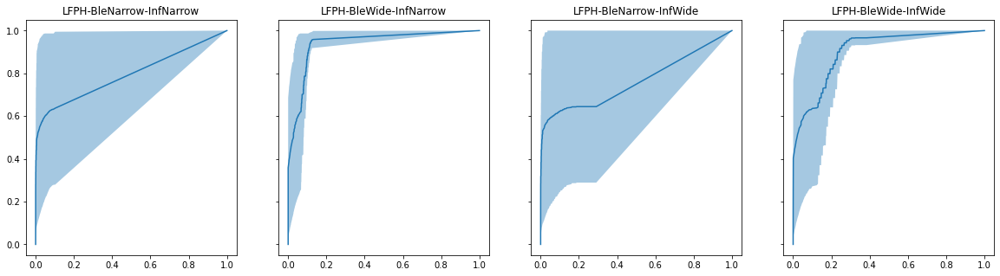

In [ ]:
config_list = [config_lfph_ble_narrow_inf_narrow, config_lfph_ble_wide_inf_narrow, 
               config_lfph_ble_narrow_inf_wide, config_lfph_ble_wide_inf_wide]
sigma_factor = 0.5

eval_configs_df(config_list, sigma_factor = sigma_factor, risk_thresh = 15, show_float=False, w=1)
eval_configs_df(config_list, sigma_factor = sigma_factor, risk_thresh = 15, show_float=False, w=None)
eval_configs_roc_plots(config_list, sigma_factor = sigma_factor, w=w)

## Debug

In [ ]:
data = make_input_data() 
params = ModelParams()
pthresh = pthresh_cdc
expo_dist = expo_dist_unif
sigma_mle = ble_params_default.sigma
sigma = sigma_mle * sigma_factor
config = config_swiss
name = '{}'.format(config.name, sigma)
roc = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w=1)
risk_thresh = 15
stats = compute_stats_at_roc_thresh_with_bounds(risk_thresh, roc)
print(stats)
for k in stats.keys():
  print('{}: {}'.format(k, stats[k]))


Making grid of 25 distances x 20 durations x 21 onsets = 10500 points
{'thresh_low': 15.03078787878788, 'thresh_mid': 15.03078787878788, 'thresh_high': 15.03078787878788, 'thresh_clean': 15.03078787878788, 'fpr_low': 0.018005967596541456, 'fpr_mid': 0.17871583141032846, 'fpr_high': 0.3394256952241155, 'fpr_clean': 0.07410545957061339, 'tpr_low': 0.12647412455388465, 'tpr_mid': 0.40477359582834843, 'tpr_high': 0.6830730671028122, 'tpr_clean': 0.48139924583162963, 'frac_low': 0.03178658868045534, 'frac_mid': 0.2074359321468655, 'frac_high': 0.38308527561327566, 'frac_clean': 0.12585116536796534, 'nabove_low': 3.178658868045534, 'nabove_mid': 20.74359321468655, 'nabove_high': 38.308527561327566, 'nabove_clean': 12.585116536796534, 'sens_low': 0.12647412455388465, 'sens_mid': 0.40477359582834843, 'sens_high': 0.6830730671028122, 'sens_clean': 0.48139924583162963, 'spec_low': 0.6605743047758845, 'spec_mid': 0.8212841685896716, 'spec_high': 0.9819940324034586, 'spec_clean': 0.925894540429386

In [ ]:
data = make_input_data() 
params = ModelParams()
pthresh = pthresh_cdc
expo_dist = expo_dist_unif
sigma_mle = ble_params_default.sigma
sigma = sigma_mle * sigma_factor
config = config_swiss
name = '{}'.format(config.name, sigma)
roc = compute_weighted_ROC_curve_with_sigma(data, params, config, sigma, pthresh, expo_dist, w=1)
risk_thresh = 15
stats_list = compute_stats_from_roc(roc)
print(len(stats_list))
stats = stats_list[10]
print(stats)
for k in stats.keys():
  print('{}: {}'.format(k, stats[k]))

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points
34
{'nabove_low': 3.4666666666666663, 'nabove_mid': 21.69761904761905, 'nabove_high': 39.92857142857143, 'nabove_clean': 13.37142857142857, 'frac_low': 0.034666666666666665, 'frac_mid': 0.2169761904761905, 'frac_high': 0.3992857142857143, 'frac_clean': 0.1337142857142857, 'sens_low': 0.1386806596701649, 'sens_mid': 0.4224512743628186, 'sens_high': 0.7062218890554723, 'sens_clean': 0.5044977511244377, 'spec_low': 0.9202487453632991, 'spec_mid': 0.9503600261837224, 'spec_high': 0.9804713070041458, 'spec_clean': 0.9202487453632991, 'ppv_low': 0.5082417582417582, 'ppv_mid': 0.5356641222025837, 'ppv_high': 0.5630864861634093, 'ppv_clean': 0.47934472934472927, 'npv_low': 0.8866416732438832, 'npv_mid': 0.9211216500445476, 'npv_high': 0.9556016268452119, 'npv_clean': 0.9273306948109059, 'thresh_low': 14.342105263157896, 'thresh_mid': 14.342105263157896, 'thresh_high': 14.342105263157896, 'thresh_clean': 14.342105263157896, '

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


# Static plots

## Infectiousness

In [ ]:
def plot_infectiousness_model(params, config, ax, scale_peak=0, scale_factor=1):
  weights = config.inf_weights
  levels  = config.inf_levels
  tost = np.arange(-14, 14+1, 0.1)
  ps = infectiousness_student(tost)
  pmax = infectiousness_student(scale_peak)
  ps  = ps/pmax
  ps = ps * scale_factor
  ax.plot(tost, ps, label='Student t', color='k', lw=3)
  ts = np.arange(-14, 14+1, 1)
  ps = infectiousness_score_batch(ts, levels, weights) 
  nweights = len(weights)
  if nweights == 3: # v2 API
    red = (1.0, 0.18954248366013093, 0.0, 1.0)
    orange = (1.0, 0.7269426289034134, 0.0, 1.0)
    green = (0.7179000632511068, 1.0, 0.2498418722327641, 1.0)
    cmap = [green, orange, red] # drop (0) , standard (1), high (2)
    colors = [cmap[c] for c in levels] 
  else:
    cmap = cm.get_cmap('jet')
    nlevels = len(np.unique(levels))
    colors = [cmap(c/nlevels) for c in levels]  
  ax.bar(ts, ps, color = colors)
  ax.set_xlabel('days since symptom onset')
  ax.set_ylabel('infectiousness')

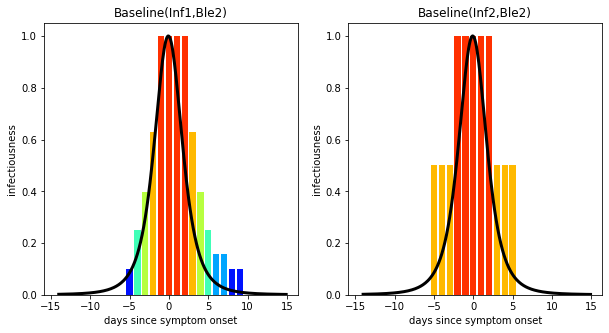

In [ ]:
config_list = [config_baseline_inf1_ble2, config_baseline_inf2_ble2]
n = len(config_list)
fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i in range(n):
  config = config_list[i]
  ax = axs[i]
  plot_infectiousness_model(params, config, ax, scale_peak=0, scale_factor=1)
  ax.set_title(config.name)



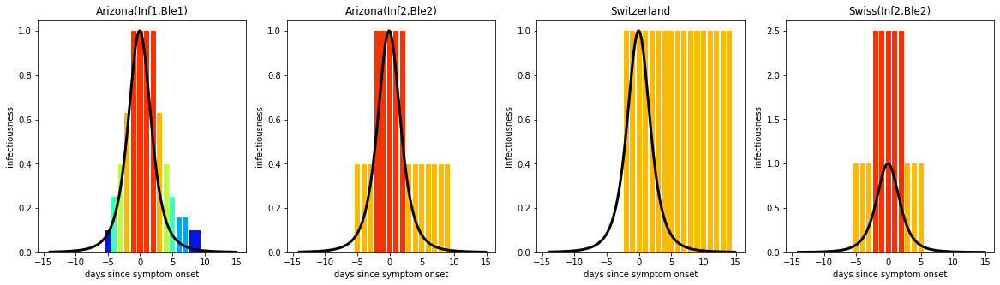

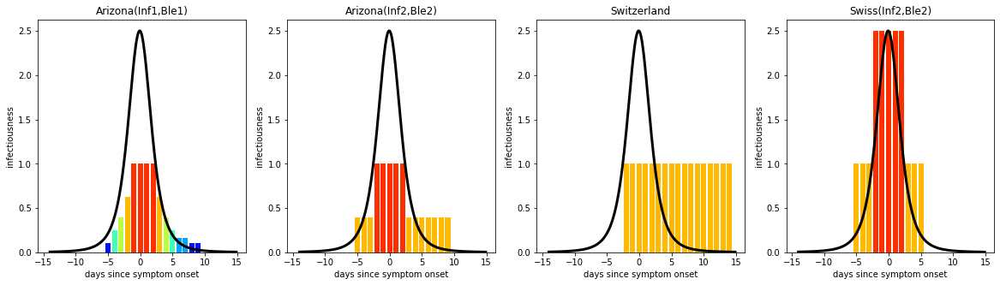

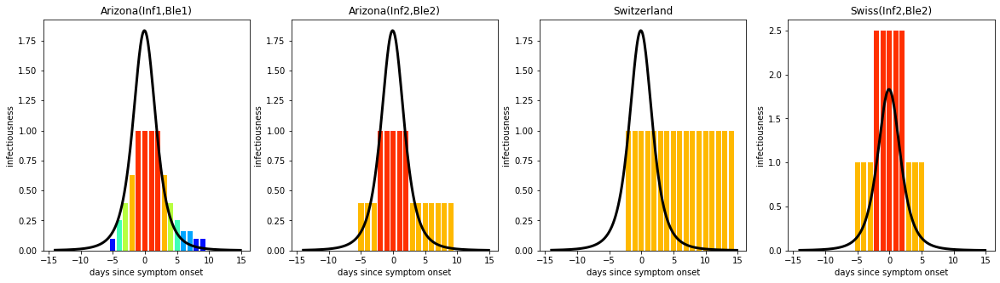

In [ ]:
config_list = [config_arizona_inf1_ble1, config_arizona_inf2_ble2, config_swiss, config_swiss_inf2_ble2]

config_swiss_inf2_ble2 = RiskConfig(ble_thresholds = ble_thresh_swiss_v2,
                          ble_weights = ble_weights_swiss_v2,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'Swiss(Inf2,Ble2)')  



                                 
n = len(config_list)
fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i in range(n):
  config = config_list[i]
  ax = axs[i]
  plot_infectiousness_model(params, config, ax, scale_peak=0, scale_factor=1)
  ax.set_title(config.name)

fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i in range(n):
  config = config_list[i]
  ax = axs[i]
  plot_infectiousness_model(params, config, ax, scale_peak=0, scale_factor=2.5)
  ax.set_title(config.name)

fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i in range(n):
  config = config_list[i]
  ax = axs[i]
  plot_infectiousness_model(params, config, ax, scale_peak=-2, scale_factor=1)
  ax.set_title(config.name)

## Attenuation

Arizona(Inf1,Ble1)
{'duration': [15, 5], 'distance': [2, 2], 'onset': [-2, -2]}
Arizona(Inf2,Ble2)
[51.64644051 71.64644051]
Switzerland
[52.1455681 62.1455681 72.1455681]
Swiss(Inf2,Ble2)
[56.80829013 64.80829013]
Ireland
[56.63464955 61.63464955 66.63464955]


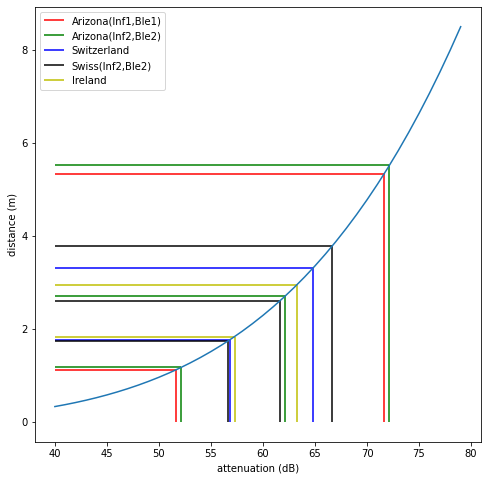

In [ ]:
config_list = [config_arizona_inf1_ble1, config_arizona_inf2_ble2, config_swiss, config_swiss_inf2_ble2, config_ireland]

attens = np.arange(40, 80)
ble_params = ble_params_default
distances = atten_to_dist(attens, ble_params)

fig, axs = plt.subplots(1,1, figsize=(8,8))
axs = np.reshape(axs, (1,))
ax = axs[0]
ax.plot(attens, distances)
ax.set_xlabel('attenuation (dB)')
ax.set_ylabel('distance (m)')
                
names = [config.name for config in config_list]
colors = ['r', 'g', 'b', 'k', 'y']
handles = []
np.random.seed(0)
for i, config in enumerate(config_list):
  print(config.name)
  print(thresholds)
  # add small perturbation so they don't overlap
  thresholds = config.ble_thresholds + 3*np.random.rand()
  for j, thresh in enumerate(thresholds):
    dist =  atten_to_dist(thresh, ble_params)
    if j==0:
      ax.vlines(thresh, 0, dist, color=colors[i], label=config.name)
    else:
      ax.vlines(thresh, 0, dist, color=colors[i])
    ax.hlines(dist, np.min(attens), thresh, color=colors[i])
ax.legend()
plt.show()

In [ ]:
def plot_risk_vs_distance(params, config, ax, max_dist=5):
  dist = np.linspace(0, max_dist, 100)
  atten = dist_to_atten(dist,  params=params.ble_params)
  
  if params.distance_fun == 'quadratic':
    true_risk = transmission_vs_distance_quadratic(dist, params.distance_Dmin)
  elif params.distance_fun == 'sigmoid':
    true_risk = transmission_vs_distance_sigmoid(dist, params.distance_slope, params.distance_inflection)
  elif params.distance_fun == 'spline':
    true_risk = transmission_vs_distance_spline(dist)

  approx_risk = attenuation_score_batch(atten, config.ble_thresholds, config.ble_weights)
  # For plotting purposes, we rescale approx-risk so max is 1, to match true risk
  approx_risk = approx_risk / np.max(approx_risk)
  ax.plot(dist, true_risk, 'k')
  ax.plot(dist, approx_risk, 'r:')
  ax.set_xlabel('distance (meters)')
  ax.set_ylabel('distance factor')
  

In [ ]:
def plot_risk_vs_distance_two(params, config, ax, max_dist=5):
  dist = np.linspace(0.1, max_dist, 100)
  atten = dist_to_atten(dist, params=params.ble_params)
  
  if params.distance_fun == 'quadratic':
    true_risk = transmission_vs_distance_quadratic(dist, params.distance_Dmin)
  elif params.distance_fun == 'sigmoid':
    true_risk = transmission_vs_distance_sigmoid(dist, params.distance_slope, params.distance_inflection)
  elif params.distance_fun == 'spline':
    true_risk = transmission_vs_distance_spline(dist)

  approx_risk = attenuation_score_batch(atten, config.ble_thresholds, config.ble_weights)
  # For plotting purposes, we rescale approx-risk so max is 1, to match true risk
  approx_risk = approx_risk / np.max(approx_risk)
  ax.plot(dist, true_risk, 'k')
  ax.plot(dist, approx_risk, 'r:')
  ax.set_xticks(np.arange(0, max_dist+0.1, 1))
  ax.set_xlabel('distance (meters)')
  ax.set_ylabel('distance factor')

  ax2 = ax.twiny()
  ax2.set_xlim(ax.get_xlim())
  distances = ax.get_xticks()
  attens = dist_to_atten(distances+1e-5, params=params.ble_params)
  labels = ['{:0.1f}'.format(a) for a in attens]
  ax2.set_xticks(distances)
  ax2.set_xticklabels(labels)
  ax2.set_xlabel('Attenuation (db')


ModelParams(ble_params=BleParams(slope=0.21, intercept=3.92, sigma=0.5744562646538028, model='log-normal', name='log-normal-old', tx=0.0, correction=2.398), distance_fun='sigmoid', distance_Dmin=1.0, distance_slope=2.0, distance_inflection=2.0, infectiousness_fun='skew-logistic', beta=0.0008)
ModelParams(ble_params=BleParams(slope=0.127, intercept=4.23, sigma=0.7, model='log-normal', name='log-normal-new', tx=0.0, correction=2.398), distance_fun='sigmoid', distance_Dmin=1.0, distance_slope=2.0, distance_inflection=2.0, infectiousness_fun='skew-logistic', beta=0.0008)


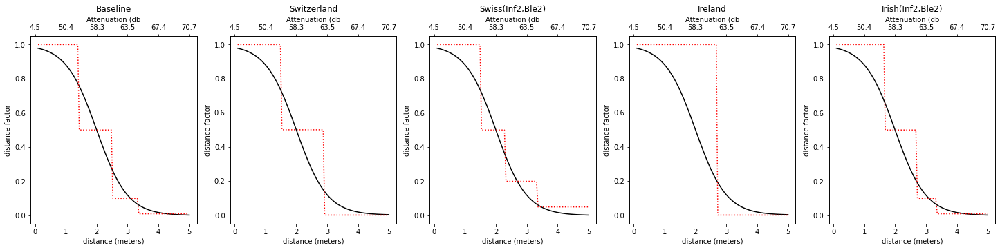

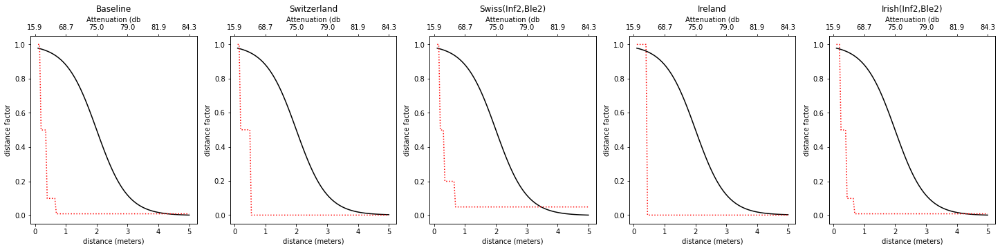

In [ ]:


#config_list = [config_baseline, config_swiss, config_swiss_inf2_ble2, config_ireland, config_ireland_inf2_ble2]
config_list = [config_baseline, config_swiss, config_swiss_inf2_ble2, config_ireland, config_ireland_inf2_ble2]
param_list = [ModelParams(ble_params = ble_params_lognormal_lovett), ModelParams(ble_params = ble_params_lognormal_briers)]
for params in param_list:
  print(params)
  n = len(config_list)
  fig, axs = plt.subplots(1,n, figsize=(5*n,5))
  axs = np.reshape(axs, (n,))
  for i in range(n):
    config = config_list[i]
    ax = axs[i]
    plot_risk_vs_distance_two(params, config, ax)
    ax.set_title(config.name)

ModelParams(ble_params=BleParams(slope=0.21, intercept=3.92, sigma=0.5744562646538028, model='log-normal', name='log-normal-old', tx=0.0, correction=2.398), distance_fun='sigmoid', distance_Dmin=1.0, distance_slope=2.0, distance_inflection=2.0, infectiousness_fun='skew-logistic', beta=0.0008)


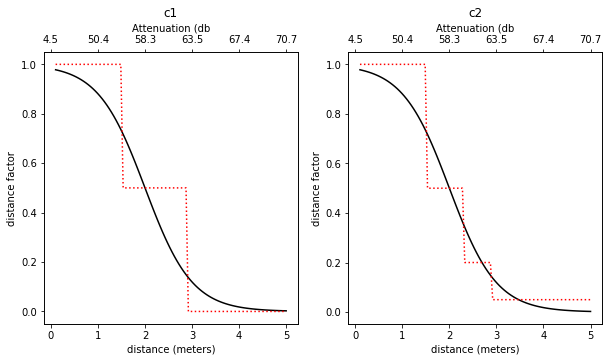

In [ ]:
ble_thresh_swiss_v1 = np.array([55, 63])
ble_thresh_swiss_v2 = np.array([55, 63, 65])
ble_weights_swiss_v1 = np.array([100, 50, 0])/100
ble_weights_swiss_v2 = np.array([100, 50, 10, 1])/100

config1 = RiskConfig(ble_thresholds = np.array([55, 63]),
                          ble_weights = np.array([100, 50, 0])/100,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'c1') 

config2 = RiskConfig(ble_thresholds = np.array([55, 60, 63]),
                          ble_weights = np.array([100, 50, 20, 5])/100,
                          inf_levels = inf_levels_bell,
                          inf_weights = inf_weights_bell,
                          name= 'c2') 


config_list = [config1, config2]

params = ModelParams()
print(params)
n = len(config_list)
fig, axs = plt.subplots(1,n, figsize=(5*n,5))
axs = np.reshape(axs, (n,))
for i in range(n):
  config = config_list[i]
  ax = axs[i]
  plot_risk_vs_distance_two(params, config, ax)
  ax.set_title(config.name)

## Scatter plots

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


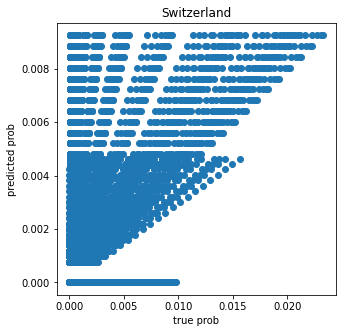

In [ ]:
data = make_input_data()
params = ModelParams()
config_list = [config_swiss]
N = len(config_list)
fig, axs = plt.subplots(1,N, figsize=(5*N,5))
axs = np.reshape(axs, (N))
for i, config in enumerate(config_list):
  ax = axs[i]
  ps = prob_infection_grid(data, params)
  qs = prob_risk_score_grid(data, config)
  ax.scatter(ps, qs)  
  ax.set_xlabel('true prob')
  ax.set_ylabel('predicted prob')
  ax.set_title(config.name)

Making grid of 20 distances x 20 durations x 20 onsets = 8000 points


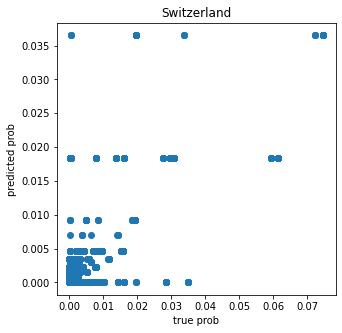

In [ ]:
np.random.seed(0)
distrib = make_input_distributions(duration_counts_rnd, atten_counts_rnd, onset_counts_rnd)
N = 20
distances, durations, onsets = sample_from_input_distributions(N, distrib)   
data_sample = make_input_data(distances=distances, durations=durations, symptoms=onsets)

params = ModelParams()
config_list = [config_swiss]
N = len(config_list)
fig, axs = plt.subplots(1,N, figsize=(5*N,5))
axs = np.reshape(axs, (N))

for i, config in enumerate(config_list):
  ax = axs[i]
  ps = prob_infection_grid(data_sample, params)
  qs = prob_risk_score_grid(data_sample, config)
  ax.scatter(ps, qs)  
  ax.set_xlabel('true prob')
  ax.set_ylabel('predicted prob')
  ax.set_title(config.name)

## 3d Surface plots

In [ ]:
def plot_true_risk_surface(data, params, ax, fig, duration=15, use_prob=True):
  if use_prob:
    ps = prob_infection_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  else:
    ps = hazard_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  ps2 = np.reshape(ps, data['atten_grid_2d_matrix'].shape)
  surf = ax.plot_surface(data['symptom_grid_2d_matrix'], data['atten_grid_2d_matrix'], ps2, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
  ax.set_xlabel('symptom onset')
  ax.set_ylabel('attenuation')
  if use_prob:
    ax.set_zlabel('Prob. infection')
  else:
    ax.set_zlabel('Risk score')
  ax.set_title('True risk surface, duration {} min'.format(duration))
  fig.colorbar(surf, shrink=0.5, aspect=5)


In [ ]:
def calc_true_risk_surface(data, params, duration=15, use_prob=True):
  if use_prob:
    scores = prob_infection_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  else:
    scores = hazard_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  return fmt_surface_data(data, scores)
  #return scores

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


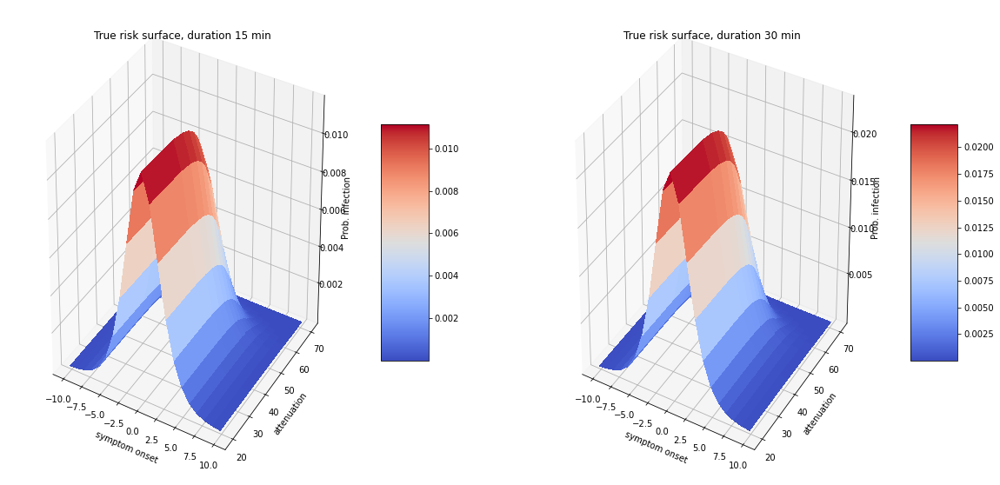

In [ ]:

data = make_input_data()
fig = plt.figure(figsize=(10*2,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_true_risk_surface(data, params, ax, fig, duration=15)
ax = fig.add_subplot(1, 2, 2, projection='3d')
plot_true_risk_surface(data, params, ax, fig, duration=30)

In [ ]:
def plot_approx_risk_surface(data, config, ax, fig, duration=15, use_prob=True):
  if use_prob:
    ps = prob_risk_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], config)
  else:
    ps = risk_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], config)
  ps2 = np.reshape(ps, data['atten_grid_2d_matrix'].shape)
  surf = ax.plot_surface(data['symptom_grid_2d_matrix'], data['atten_grid_2d_matrix'], ps2, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
  ax.set_xlabel('symptom onset')
  ax.set_ylabel('attenuation')
  if use_prob:
    ax.set_zlabel('Prob. infection')
  else:
    ax.set_zlabel('Risk score')
  ax.set_title(config.name)
  fig.colorbar(surf, shrink=0.5, aspect=5)

In [ ]:
data = make_input_data()
params = ModelParams()
config = config_swiss
#print(config.beta)
#config.beta = 3*1e-4
fig = plt.figure(figsize=(10*2,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_true_risk_surface(data, params, ax, fig)
ax = fig.add_subplot(1, 2, 2, projection='3d')
plot_approx_risk_surface(data, config, ax, fig)

Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


Making grid of 25 distances x 20 durations x 21 onsets = 10500 points


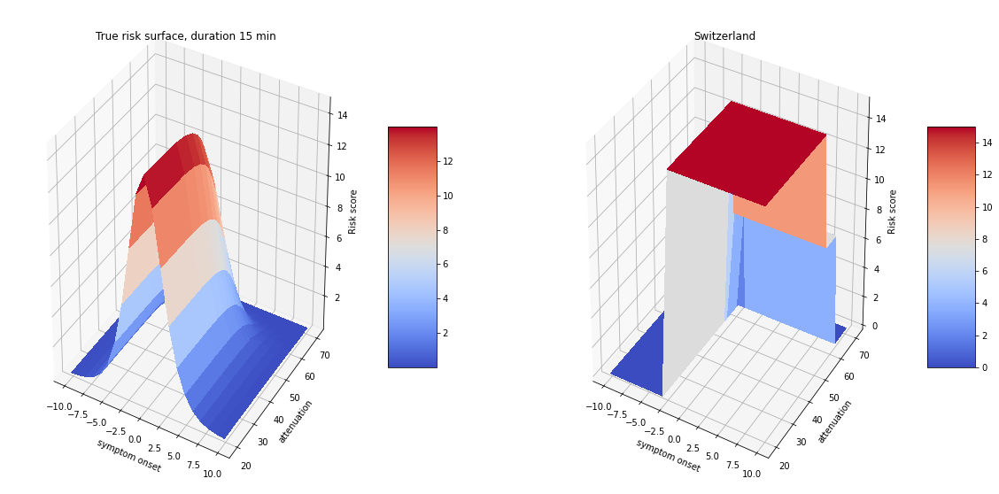

In [ ]:
data = make_input_data()
params = ModelParams()
config = config_swiss
#print(config.beta)
#config.beta = 3*1e-4
fig = plt.figure(figsize=(10*2,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_true_risk_surface(data, params, ax, fig, use_prob=False)
ax = fig.add_subplot(1, 2, 2, projection='3d')
plot_approx_risk_surface(data, config, ax, fig, use_prob=False)

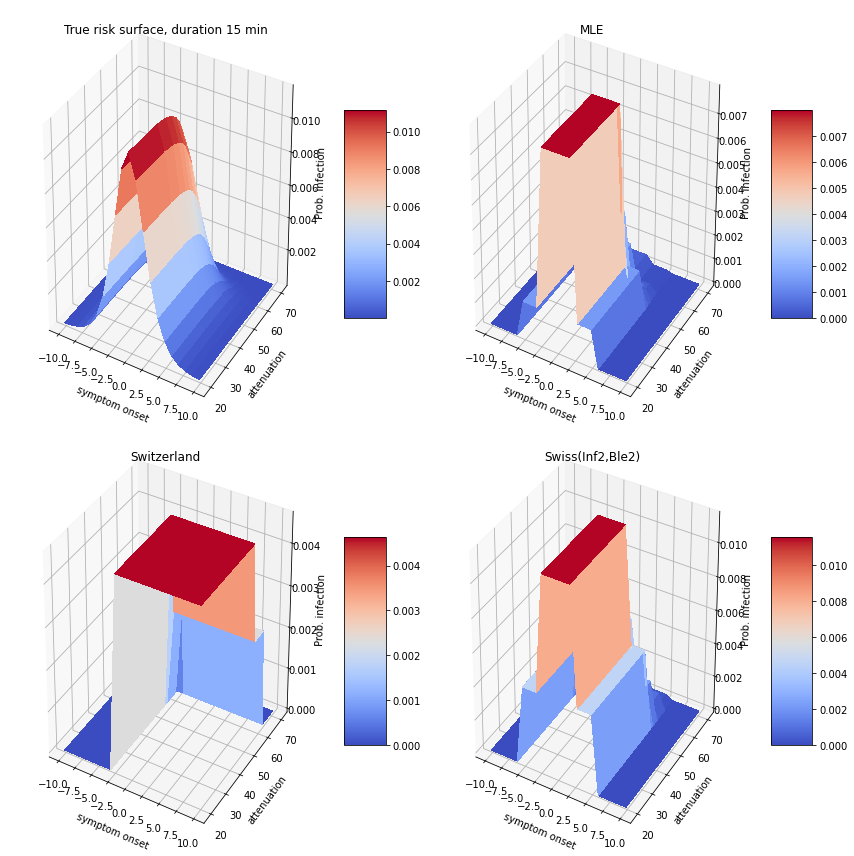

In [ ]:
config_list = [config_mle,  config_swiss, config_swiss_inf2_ble2]
nrows = 2; ncols = 2; sz = 6;
fig = plt.figure(figsize=(sz*ncols, sz*nrows))
ax = fig.add_subplot(nrows, ncols, 1, projection='3d')
plot_true_risk_surface(data, params, ax, fig)
for i, config in enumerate(config_list):
  ax = fig.add_subplot(nrows, ncols, i+2, projection='3d')
  plot_approx_risk_surface(data, config, ax, fig)
fig.tight_layout()

# Javascript user interface 


## JS Code 

This code will not run in a jupyter notebook.



In [ ]:
import IPython
from google.colab import output
import json


In [ ]:
#levels, weights = make_infectiousness_params_v2()

class NumpyEncoder(json.JSONEncoder):
  """ Special json encoder for numpy types """
  def default(self, obj):
    if isinstance(obj, np.integer):
      return int(obj)
    elif isinstance(obj, np.floating):
      return float(obj)
    elif isinstance(obj, np.ndarray):
      return obj.tolist()
    return json.JSONEncoder.default(self, obj)



In [ ]:

FRONT_END = '''
<style>body{
  width: 1528px;
  margin: 0px auto;
  padding: 20px;
  height: 10px !important;
  font-family: 'Roboto', serif;
  min-height: 1100px
}

.graph{
  min-height: 1100px;
}

h1, p{
  width: 600px;
  margin-left: 30px;
}

p{
  font-weight: 300;
  line-height: 1.4em;
}



h2{
  background: #000;
  color: #fff;
  padding: 3px;
  margin-right: 30px;
  margin-left: 30px;
  /*width: calc(100% - 50px);*/
 /*display: inline-block;*/
  /*margin: 0px auto;*/
  text-align: center;
  font-weight: 300;
  margin-bottom: 0px
}

h2.slide-left{
  position: relative;
  left: -30px;
  width: 220px;
}
h2.slide-right{
  position: relative;
  left: -18px;
  /*width: 220px;*/
}


.cell{
  display: inline-block;
  vertical-align: top;
  width: 360px;
}


.rendered_html{
  /*display: none;*/
}

.tooltip {
  top: -1000px;
  position: fixed;
  padding: 10px;
  background: rgba(255, 255, 255, .95);
  border: 1px solid lightgray;
  pointer-events: none;
  width: 320px;
  font-weight: 300;
  z-index: 10000000;
}
.tooltip-hidden{
  opacity: 0;
  transition: all .3s;
  transition-delay: .1s;
}

@media (max-width: 590px){
  div.tooltip{
    bottom: -1px;
    width: calc(100%);
    left: -1px !important;
    right: -1px !important;
    top: auto !important;
    width: auto !important;
  }
}

svg{
  overflow: visible;
}

.domain{
  display: none;
}

text{
  /*pointer-events: none;*/
  text-shadow: 0 1px 0 #fff, 1px 0 0 #fff, 0 -1px 0 #fff, -1px 0 0 #fff;
}

text.color-label{
  /*pointer-events: none;*/
  /*text-shadow: none;*/
}


.top{
  margin-bottom: -26px;
}
.top > div{
  display: inline-block;
  width: 360px;
  vertical-align: top;
}

.bot > div{
  vertical-align: top;
}

.sim, .viral{
  position: relative;
  z-index: 100;
}
.sim h2, .viral h2{
  text-align: left;
}

.slider-row{
  margin-top: -15px;
  height: 23px;
  position: relative;
  z-index: 10000;
}

.slider-row > div{
  display: inline-block;
  width: 100px;
  margin-right: 10px;
}

.slider-row select{
  position: relative;
  margin-right: 23px;
  top: -17px;
  font-weight: bold;
  /*top: 20px;*/
}

.slider-row .slider input{
  width: 80px;
}


.slider-row{
  margin-left: 30px;
}

.onset .slider-row > div{
  width: 155px;
}
.onset .slider-row .slider input{
  width: 100px;
}



.drag{
  user-select: none;
  -webkit-tap-highlight-color: rgba(0,0,0,0);
}
.drag rect{
  fill: rgba(0,0,0,0);
}
.drag:hover rect{
  fill: rgba(0,0,0,.3);
}
.drag circle{
  stroke: #000;
}
/*.drag circle{
  fill: rgba(0,0,0,.3);
  fill: rgba(0,0,0,1);
}
.drag:hover circle{{
  fill: rgba(0,0,0,1) !important;
}
*/
h2{
  margin-top: 30px;
  text-align: center;
  font-size: 16px;
}

.onset h2{
  position: relative;
  /*left: -40px;*/
}

.axis .tick text{
  opacity: .5;
}
.axis .tick line{
  opacity: .4;
}



.letter:hover{
  font-weight: 700;
}

.letter.inactive{
  fill: #ddd;
}

.bot > div {
  display: inline-block;
  vertical-align: top;
}






input[type="range" i] {
  background-color:#000;
  -webkit-appearance: none;
  height:1px;
  border: none;
  /*overflow: hidden;*/
}

input[type='range']::-webkit-slider-thumb {
  -webkit-appearance: none;
  width: 13px;
  height: 13px;
  border-radius:15px;
  cursor: ew-resize;
  background: #000;
  /*box-shadow: -200px 0 0 200px #999;*/
}

.auc input[type='range']::-webkit-slider-thumb {
  background: steelblue;
}

.onset input[type='range']::-webkit-slider-thumb {
  background: red;
}


.onset .slider:first-child input[type='range']::-webkit-slider-thumb {
  background: orange;
}

input:focus {
  outline-width: 0;
}


.light-num{
  fill:rgb(0, 0, 0);
  font-family:sans-serif;
  font-size:12px;
  font-weight:400;
  /*opacity: .5;*/
}


.modebar-container{
  display: none !important;
}

.surface{
  /*width: 300px;*/
  /*width: 200px;*/
  position: relative;
  z-index: 0;
  margin-left: -20px;
  min-width: 200px;
}

h2, .param-label{
  cursor: pointer;
  user-select: none;
}
.inactive{
  border-color: #fff !important;
}
.inactive > * {
  opacity: 0;
  pointer-events: none;
}
.inactive > h2, .inactive > .param-label{
  opacity: .4 !important;
  pointer-events: all !important;
}
.inactive > .param-label{
  opacity: 1 !important;
}

.top{
  position: relative;
  z-index: 1000;
}

.mid{
  position: relative;
  /*z-index: 100;*/
  /*margin-bottom: -55px;*/
  margin-bottom: 25px
}

.how-to{
  top: 40px;
  left: 38px;
  position: absolute;
  font-weight: 200;
  pointer-events: none;
  opacity: 1 !important;
  font-size: 14px;
}

.expose{
  /*margin-left: -30px;*/
}

.sim{
  display: none;
}


#en-params{
  margin-top: 50px;
}

.params-region{
  border: 3px dotted #ddd;
  padding: 5px;
  border-radius: 20px;
  position: relative;
  padding-top: 30px;
  display: inline-block;
  margin-bottom: 20px;
  vertical-align: top;

}

.param-label{
  position: absolute;
  left: 30px;
  top: -17px;
  background: #fff;
  padding: 5px;
  color: #999;
  font-weight: 300;
  cursor: pointer;
}
.param-label:hover{
  color: #000;
}
.info {
  content: "ⓘ";
  float: right;
  position: relative;
  top: -2px;
  right: 2px;
  color: #fff;
  font-weight: 500;
}

.download-button{
  margin-left: 20px;
  font-weight: 500;
  padding-left: 5px;
  padding-right: 5px;
  position: relative;
  font-size: 20px;
  top: 2px;
}
.download-button:hover{
  outline: 1px solid #000;
  cursor: pointer;
}
.upload-button{
  margin-left: 20px;
}


.confidential{
  background: yellow;
  padding: 5px;
  display: inline-block;
  font-weight: 600;
}</style>
<script>window.presetConfigs = [
  {
    name: 'LFPH-BleNarrow-InfNarrow',
    ble_thresholds: [53, 62, 70],
    ble_weights: [150, 100, 40, 0], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    inf_weights:  [0, 30, 100],
  },
  {
    name: 'LFPH-BleWide-InfNarrow',
    ble_thresholds: [55, 70, 80],
    ble_weights: [200, 100, 25, 0], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    inf_weights:  [0, 30, 100],
  },
  {
    name: 'LFPH-BleNarrow-InfWide',
    ble_thresholds: [53, 62, 70],
    ble_weights: [150, 100, 40, 0], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 75, 250],
  },
  {
    name: 'LFPH-BleWide-InfWide',
    ble_thresholds: [55, 70, 80],
    ble_weights: [200, 100, 25, 0], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 75, 250],
  },
  {
    name: 'Ireland',
    ble_thresholds: [56, 62, 70],
    ble_weights: [100, 100, 0, 0],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    inf_weights: [0, 100, 100],
  },
  {
    name: 'Ire+Inf',
    ble_thresholds: [56, 62],
    ble_weights: [100, 100, 0, 0],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 100, 250],
  },
  {
    name: 'Ire+Ble',
    ble_thresholds: [56, 62, 65],
    ble_weights: [100, 100, 10, 1],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    inf_weights: [0, 100, 100],
  },
  {
    name: 'Ire+Inf+Ble',
    ble_thresholds: [56, 62, 65],
    ble_weights: [100, 100, 10, 1],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 100, 250],
  },
  {
    name: 'Switzerland',
    ble_thresholds: [55, 63, 70],
    ble_weights: [100, 50, 0, 0],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    inf_weights: [0, 100, 100],
  },
  {
    name: 'Swiss+Inf2',
    ble_thresholds: [55, 63, 70],
    ble_weights: [100, 50, 0, 0],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 100, 250],
  },
  {
    name: 'Swiss+Ble',
    ble_thresholds: [55, 63, 65],
    ble_weights: [100, 50, 10, 1],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    inf_weights: [0, 100, 100],
  },
    {
    name: 'Swiss+Inf+Ble',
    ble_thresholds: [55, 63, 65],
    ble_weights: [100, 50, 10, 1],
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights: [0, 100, 250],
  },
  {
    name: 'MLE',
    ble_thresholds: [51, 55, 60],
    ble_weights: [200, 85.7, 43.3, 9.8], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights:  [0 , 16, 86],
  },
  {
    name: 'MLE-old',
    ble_thresholds: [48, 55, 68],
    ble_weights: [85.6, 48.7, 9.9, 1], 
    inf_levels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,  1, 1, 0, 0, 0, 0, 0],
    inf_weights:  [5 , 38, 209],
  },

]

window.histogramDefaults = [
  {
    name: 'Random',
    bars: [
      {
        name: 'duration',
        str: 'Duration (Minutes)',
        vals: [5, 10, 15, 22.5, 30, 60, 120],
        pcts: [1, .9, .8, .7, .6, .5, 1]
      }, 
      {
        name: 'distance',
        valsdb: [50, 55, 60, 65, 70, 75, 80],
        str: 'Distance (Meters) / Attenuation (dB)',
        vals: [1.2, 1.9, 2.8, 4.0, 5.6, 7.7, 10.4],
        pcts: [.21, .17, .16, .11, .07, .12, .16].map(d => d*4.5),
      }, 
      {
        name: 'onset',
        str: 'Symptom Onset (Days)',
        vals: [-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
        pcts:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, .2, .3, .4, .5, .6, .7, .8, .9, 1, 1, 1],
      }, 
    ]
  },
  {
    name: 'Uniform',
    bars: [
      {
        name: 'duration',
        str: 'Duration (Minutes)',
        vals: [5, 10, 15, 22.5, 30, 60, 120],
        pcts: [.8, .8, .8, .8, .6, .8, .8]
      }, 
      {
        name: 'distance',
        valsdb: [50, 55, 60, 65, 70, 75, 80],
        str: 'Distance (Meters) / Attenuation (dB)',
        vals: [1.2, 1.9, 2.8, 4.0, 5.6, 7.7, 10.4],
        pcts: [.8, .8, .8, .8, .8, .8, .8],
      }, 
      {
        name: 'onset',
        str: 'Symptom Onset (Days)',
        vals: [-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
        pcts:  [.8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8, .8],
      }, 
    ]
  },
]



window.initActualBLE = function(){
  var sel = d3.select('.actualBLE').html('')

  sel.append('h2').text('Transmission v. Distance')
    .st({marginBottom: 30})
  var c = d3.conventions({
    sel: sel.append('div'),
    height: 120,
    margin: {left: 80, right: 50, bottom: 15, top: 0}
  })

  c.x.domain([0, 5])
  c.xAxis.ticks(5)
  c.yAxis.ticks(5).tickFormat(d3.format('.0%'))
  d3.drawAxis(c)
  c.svg.select('.y')//.selectAll('.tick').remove()
  addAxisLabel(c, 'Distance (Meters)', 'Transmission Probability')

  var lineSel = c.svg.appendMany('path', [1, 0])
    .at({
      stroke: d => d ? '#000' : '#f00',
      strokeDasharray: d => d ? '' : '3 3',
      fill: 'none',
    })

  var labelSel = c.svg.appendMany('text', [1, 0])
    .at({fill: d=> d ? '#000' : '#f00', x: c.width + 2, fontSize: 12, fontFamily: 'sans-serif', fontWeight: 400, textAnchor: 'start', dy: '.33em'})
    .text(d => d ? 'Model' : 'ENS')
    .translate(d => !d ? -5 : 5, 1)

  return function(risk_v_distance){
    var {approx_risk, dist, true_risk} = risk_v_distance

    var line = d3.line()
      .x((d, i) => c.x(dist[i]))
      .y(c.y)

    lineSel.data([true_risk, approx_risk]).at({d: line})

    labelSel.data([true_risk, approx_risk]).at({y: d => c.y(_.last(d))})
  }
}

if (window.init) window.init()



window.initActualOnset = function(){
  var sel = d3.select('.actualOnset').html('')

  sel.append('h2').text('Infectiousness v. Time')
    .st({marginBottom: 30})

  var c = d3.conventions({
    sel: sel.append('div'),
    height: 120,
    margin: {left: 40, right: 40, bottom: 15, top: 0}
  })

  c.x.domain([-14, 14]).interpolate(d3.interpolateRound)
  c.y.domain([0, 2.5])
  c.xAxis.tickValues([-14, -7, 0, 7, 14])
  c.yAxis.ticks(5).tickFormat(d3.format('.0%'))
  d3.drawAxis(c)
  c.svg.select('.y')//.selectAll('.tick').remove()
  addAxisLabel(c, 'Date of Exposure Relative to Symptom Onset', 'Infectiousness')

  var line = d3.line()
    .x((d, i) => c.x(i/10 - 14))
    .y(c.y)

  var bw = c.x(1) - c.x(0)
  var barSel = c.svg.appendMany('rect', onset.levels)
    .at({
      x: d => c.x(d.day - .5), 
      width: d => c.x(d.day + .5) - c.x(d.day - .5) - .4,
    })

  var lineSel = c.svg.append('path').at({stroke: '#000', fill: 'none', strokeWidth: 2, xstrokeDasharray: '4 1'})

  var rv = {}

  rv.update_actual_onset = actual_onset =>{
    if (rv.actual_onset) return // Only redraw first time
    rv.actual_onset = actual_onset

    lineSel.at({d: line(rv.actual_onset)})

    // if (window.google) google.colab.output.resizeIframeToContent()
  }

  rv.render = () => {
    var i2color = [color.green, color.orange, color.red]
    var i2w = [0, onset.weights[0].v/100, onset.weights[1].v/100]
    barSel.at({
      fill: d => i2color[d.l],
      y: d => c.y(i2w[d.l]),
      height: d => Math.max(1, c.height - c.y(i2w[d.l])),
    })
  }

  return rv
}

if (window.init) window.init()



  
window.initAUC = function(){
  var sel = d3.select('.auc').html('').st({height: 0}).append('div')
  var aucTextSel = sel.append('h2').append('span')
  var c = d3.conventions({
    sel: sel,
    height: 200,
    width: 200,
    margin: {bottom: 60, left: 50, right: 50, top: 20}
  })

  var sliders = [
    {
      s: 'threshold',
      pp: 'Risk Threshold',
      u: ' min',
      step: 1,
      v: 15,
      r: [1, 30]
    },
  ]

  var rvSliders = addSliders(sel.append('div').st({marginLeft: 30}), sliders, d => renderFPR(sliders[0].v))
  // c.svg
  //   .on('mousemove', function(){
  //     var fpr = d3.mouse(this)[0]/c.width

  //     auc.fpr = fpr
  //     auc.renderFPR()
  //   })
  //   .append('rect').at({width: c.width, height: c.height, fillOpacity: 0})


  var line = d3.line()
    .x(d => c.x(d.fpr_mid))
    .y(d => c.y(d.tpr_mid))

  var area = d3.area()
    .x(d => c.x(d.fpr_mid))
    .y0(d => c.y(d.tpr_low))
    .y1(d => c.y(d.tpr_high))

  c.xAxis.ticks(5)
  c.yAxis.ticks(5)
  d3.drawAxis(c)

  addAxisLabel(c, 'FPR = 1 - Specificity', 'TPR = Sensitivity')

  var areaSel = c.svg.append('path.area')
    .at({fill: '#ddd'})
  var pathSel = c.svg.append('path.line')
    .at({stroke: '#000', strokeWidth: 2, fill: 'none'})

  var fmt = d3.format('.2f')
  // var fmt = d3.format('.0%')

  function dragEnd(auc, roc_array){
    rv.data = []

    rv.auc = auc
    rv.roc_array = roc_array
    areaSel.at({d: area(rv.roc_array)})
    pathSel.at({d: line(rv.roc_array)})
    aucTextSel.html('<b>AUC: ' + fmt(auc.mid) + '</b> [' + fmt(auc.low) + ' - ' + fmt(auc.high) + ']')

    renderFPR(15, true)
  }

  var fprSel = c.svg.append('g')
  fprSel.append('circle').at({r: 6, fill: 'steelblue', })

  var fixedTextSel = c.svg.append('g')
    .translate([120, 320])
    .st({pointerEvents: 'none'})

  var lh = 15
  var alertText    = fixedTextSel.append('text').translate([10, lh*0]).st({fontSize: 12, fontWeight: 300, textAnchor: 'end', fontFamily: 'sans-serif'})
  var fprText    = fixedTextSel.append('text').translate([10, lh*1]).st({fontSize: 12, fontWeight: 300, textAnchor: 'end', fontFamily: 'sans-serif'})
  var tprText    = fixedTextSel.append('text').translate([10, lh*2]).st({fontSize: 12, fontWeight: 300, textAnchor: 'end', fontFamily: 'sans-serif'})
  var ppvText    = fixedTextSel.append('text').translate([10, lh*3]).st({fontSize: 12, fontWeight: 300, textAnchor: 'end', fontFamily: 'sans-serif'})
  var npvText = fixedTextSel.append('text').translate([10, lh*4]).st({fontSize: 12, fontWeight: 300, textAnchor: 'end', fontFamily: 'sans-serif'})

  function renderFPR(threshTarget, forceSliderRender){
    if (typeof(rv) == 'undefined' || !rv.roc_array) return

    var i = -1
    var minDist = 100000

    var searchArray = rv.roc_array.map(d => threshTarget ? d.thresh_mid : d.fpr_mid)
    var searchTarget = threshTarget ? threshTarget : rv.fpr
    searchArray.forEach((d, curI) => {
      var dist = Math.abs(d - searchTarget)
      if (dist < minDist){
        minDist = dist
        i = curI
      }
    })

    var fpr = rv.roc_array[i].fpr_mid
    var tpr = rv.roc_array[i].tpr_mid
    var thresh = rv.roc_array[i].thresh_mid

    sliders[0].v = Math.round(thresh)
    if (!threshTarget || forceSliderRender){
      rvSliders.render('automatic')
    }

    fprSel
      .st({opacity: 1})
      .translate([c.x(fpr), c.y(tpr)])
 


    function printKey(key, f=fmt){
      var d = rv.roc_array[i]
      return f(d[key + '_mid']) + ' [' + f(d[key + '_low']) + ' - ' + f(d[key + '_high']) + ']'
    }

    alertText.text('Alerts: ' + printKey('nabove', d => fmt(d/100)))
    tprText.text('Sensitivity (Recall): ' + printKey('sens'))
    fprText.text('Specificity: ' + printKey('spec'))
    ppvText.text('PPV (Precision): ' + printKey('ppv'))
    npvText.text('NPV: ' + printKey('npv'))

  }

  var rv = {dragEnd, drag: d => d, renderFPR, fpr: .1, data: [], lastIndex: -1, rvSliders}
  return rv
}


if (window.init) window.init()



    // var {nneg, npos} = rv.roc

    // var nfp = fpr*nneg
    // var ntp = tpr*npos

    // var fp = fpr*nneg
    // var tp = tpr*npos
    // var fn = (1 - tpr)*npos
    // var tn = (1 - fpr)*nneg

    // var npred_pos = nfp + ntp
    // var precision = ntp / npred_pos // PPV

  
// var fmtS = d3.format('.1f')
// console.log(1 - fpr, tn/(tn + fp)) // specificity
// console.log(tpr, tp/(tp + fn)) // Sensitivity
// console.log(precision, tp/(tp + fp)) //precision 

// fprText.text('Specificity: ' + fmtS(nneg - nfp) + '/' + rnd(nneg) + ' = ' + fmt(1 - fpr))
// tprText.text('Sensitivity: ' + fmtS(ntp) + '/' + rnd(npos) + ' = ' + fmt(tpr))
// ppvText.text('Precision (PPV): ' + fmtS(ntp) + '/' + rnd(npred_pos) + ' = ' + fmt(precision))
// npvText.text('Threshold: ' + fmt(thresh))


// function drag(index=rv.index){
//   rv.index = index
//   if (!rv.data.length) return rv.index = index

//   aucTextSel.text(' AUC: ' + fmt(rv.data[index].auc))

//   pathSel.at({d: line(rv.data[index])})
// }




  
window.initBLE = function(){
  var sel = d3.select('.ble').html('')
  sel.append('h2').text('Bluetooth Attenuation Settings')

  var c = d3.conventions({
    sel: sel.append('div'),
    totalHeight: 165,
    totalWidth: 360,
    margin: {right: 20, left: 50},
  })

  var weights = [
    {
      str: 'Immediate-Near',
      p: [0, 30],
      w: 150,
      fill: color.red,
    },
    {
      str: 'Near-Medium',
      p: [30, 50],
      w: 100,
      fill: color.orange,
    },
    {
      str: 'Medium-Far',
      p: [50, 60],
      w: 50,
      fill: color.yellow
    },
    {
      str: 'Other',
      p: [60, 100],
      w: 10,
      fill: color.green,
    },
  ]

  weights.forEach((d, i) => d.i = i)
  var thresholds = weights.slice(0, 3).map((d, i) => ({i, d, t: d.p[1]}))

  c.x.domain([40, 80]).interpolate(d3.interpolateRound).clamp(1)
  c.y.domain([0, 250]).interpolate(d3.interpolateRound).clamp(1)

  c.xAxis.ticks(5)
  c.yAxis.ticks(5)
  d3.drawAxis(c)
  addAxisLabel(c, 'Attenuation (dB)', 'Weight (%)')

  var gSel = c.svg.append('g').translate([.5, .5])

  var wSel = gSel.appendMany('rect', weights)
    .at({
      fill: d => d.fill,
      stroke: '#000',
    })

  var rs = 14

  var sideDragSel = gSel.appendMany('g.drag.axis', thresholds)
    .st({cursor: 'ew-resize'})
    .call(d3.drag()
      .on('start', function(d){
        var configs = d3.range(100 + 1).map(i => {
          var config = generateJSConfig()
          config.ble_thresholds[d.i] = i
          config.ble_thresholds = _.sortBy(config.ble_thresholds)

          return config
        })

        dragStart(configs)
      })
      .on('drag', function(d){
        var x = d3.mouse(c.svg.node())[0]
        d.t = d3.clamp(0, c.x.invert(x), 100)

        render()
        auc.drag(Math.round(d.t))
      })
      .on('end', dragEnd)
    )


  sideDragSel.append('rect')
    .at({width: rs, x: -rs/2, height: c.height})

  var sideDragCircleSel = sideDragSel.append('circle').at({r: 3, fill: d => d.d.fill})

  sideDragSel.append('path')
    .at({stroke: '#000', d: 'M 0 ' + c.height + ' v ' + 6})

  var sideDragTextSel = sideDragSel.append('text')
    .at({y: c.height + 8, dy: '.71em', fontSize: 10, fontFamily: 'sans-serif', textAnchor: 'middle', fontWeight: 800})
    .text(90)

  var topDragSel = gSel.appendMany('g.drag', weights)
    .st({cursor: 'ns-resize'})
    .call(d3.drag()
      .on('start', function(d){
        var configs = d3.range(200 + 1).map(i => {
          var config = generateJSConfig()
          config.ble_weights[d.i] = i

          return config
        })

        dragStart(configs)
      })
      .on('drag', function(d){
        var y = d3.mouse(c.svg.node())[1]
        d.w = c.y.invert(y)

        render()
        auc.drag(Math.round(d.w))
      })
      .on('end', dragEnd)
    )

  var topDragRectSel = topDragSel.append('rect')
    .at({height: rs, y: -rs/2})

  var topDragCircleSel = topDragSel.append('circle').at({r: 3, fill: d => d.fill})

  topDragSel.append('text.color-label')
    .text(d => d.str.split('-')[0])
    .at({fontFamily: 'sans-serif', fontSize: 10, dy: '-1.45em', x: 4, fill: d => d3.color(d.fill).darker(.5)})

  var weightText = topDragSel.append('text.color-label')
    // .text(d => d.str.split('-')[0])
    .at({fontFamily: 'sans-serif', fontSize: 10, dy: '-.45em', x: 4, fill: d => d3.color(d.fill).darker(.5)})


  function render(){
    var ts = thresholds.sorted = _.sortBy(thresholds.map(d => d.t))
    weights[0].p = [0, ts[0]]
    weights[1].p = [ts[0], ts[1]]
    weights[2].p = [ts[1], ts[2]]
    weights[3].p = [ts[2], 100]

    wSel.at({
      x: d => c.x(d.p[0]),
      width: d => c.x(d.p[1]) - c.x(d.p[0]),
      y: d => c.y(d.w),
      height: d => Math.max(.1, c.height - c.y(d.w)),
    })

    sideDragSel.translate(d => c.x(d.t), 0)
    sideDragTextSel.text(d => Math.round(d.t))

    topDragSel.translate(d => [c.x(d.p[0]), c.y(d.w)])
    topDragRectSel.at({width: d => c.x(d.p[1]) - c.x(d.p[0])})

    topDragCircleSel.at({cx: d => (c.x(d.p[1]) - c.x(d.p[0]))/2}).st({opacity: d => d.w == 0 ? 0 : 1})
    sideDragCircleSel.at({cy: d => (c.height + c.y(d.d.w))/2}).st({opacity: d => d.d.w == 0 ? 0 : 1})

    weightText.text(d => Math.round(Math.round(d.w)) + '%')
  }
  render()


  return {sel, weights, thresholds, render}
}

if (window.init) window.init()



window.initExpose = function(){
  var sel = d3.select('.expose-params-sliders').html('')

  var sliders = [
    {
      s: 'duration',
      pp: 'Duration',
      u: ' min',
      v: 15,
      r: [1, 30]
    },
    {
      s: 'distance',
      pp: 'Distance',
      u: ' m',
      v: 2,
      r: [0, 10],
      step: .1,
    },
    {
      s: 'onset',
      pp: 'Onset',
      u: ' days',
      v: -2,
      r: [-14, 14]
    },
  ]

  return addSliders(sel, sliders)
}

if (window.init) window.init()



window.initHeaders = function(){
  var isFirstDrag = true
  var h2Sel = d3.selectAll('h2,.param-label')
    .each(function(d, i){
      var sel = d3.select(this)
      var text = sel.html()
      if (text == '<span></span>') text = 'AUC'

      var info = null
      headerLabels.forEach(d => {
        if (d.header == text) info = d.info
      })

      sel.datum({text, info, i, isActive: true})

      if (info) sel.append('span.info').text('ⓘ').call(d3.attachTooltip).on('mouseover', () => ttSel.html(info))
    })

  var sectionSel = d3.selectAll('.graph > div')
    .st({opacity: 0})


  function render(){
    if (!isFirstDrag) return
    isFirstDrag = false

    sectionSel.st({opacity: 1})

    h2Sel.each((d, i) => {
      if (d.text.includes('Parameters') && i) d.isActive = false
    })
    // h2Sel.each(function(d, i){ d3.select(this).datum({isActive: i < 3})})
    var isDev = 0
    if (isDev){
      h2Sel.each(d => d.isActive = 1)
      d3.select('.how-to').remove()
    }

    h2Sel
      .on('click', function(d){
        d.isActive = !d.isActive
        d3.select(this).parent().classed('inactive', !d.isActive)
        d3.select('.how-to').remove()
      })
    h2Sel.each(function(d){
      d3.select(this).parent().classed('inactive', !d.isActive)
    })
  }

  return {render}
}

if (window.init) window.init()


  
window.initHistogram = function(){
  var sel = d3.select('.histogram').html('').st({marginBottom: 50})

  sel.append('h2').text('Exposure Distribution')
    .st({marginBottom: 0})


  var charts = JSON.parse(JSON.stringify(window.histogramDefaults[0].bars))

  charts.forEach(chart => {
    var c = d3.conventions({
      sel: sel.append('div'),
      height: 30,
      margin: {bottom: 35}
    })

    c.svg.append('g.axis').append('g.label')
      .translate([c.width/2, c.height + 26])
      .append('text')
      .text(chart.str)
      .at({textAnchor: 'middle'})
      .st({fill: '#000', fontSize: 12, fontWeight: 600})

    chart.cols = chart.vals.map((xVal, i) => {
      return {xVal, i, yVal: chart.pcts ? chart.pcts[i] : 1}
    })


    c.x.domain([0, chart.cols.length]).clamp(1)
    c.y.clamp(1)
    var bw = c.x(1)

    var colSel = c.svg.appendMany('g.axis', chart.cols)
      .translate(d => c.x(d.i), 0)
      .call(d3.drag()
        .on('drag', function(d){
          var y = d3.mouse(c.svg.node())[1]
          d.yVal = c.y.invert(y)
          render()
        })
        .on('end', dragEnd)
      )
      .st({cursor: 'ns-resize'})

    var tickSel = colSel.append('g.tick')
      .append('text')
      .text(d => d.xVal)
      .at({fontSize: 10, fontFamily: 'sans-serif', x: bw/2, textAnchor: 'middle', y: c.height + 10})

    var rectSel = colSel.append('rect')
      .at({width: bw - 1, fill: '#bbb'})

    var textSel = colSel.append('text')
      .at({fontSize: 10, fontFamily: 'sans-serif', x: bw/2, textAnchor: 'middle', y: c.height -5})


    if (chart.name == 'onset'){
      tickSel.st({opacity: d => [-10, -5, 0, 5, 10].includes(d.xVal) ? '' : 0})

      textSel.at({dy: d => d.i % 2 ? 11 : 0})
    }

    if (chart.name == 'distance'){
      tickSel.text(d => d.xVal + ' m')

      colSel.append('g.tick')
        .append('text')
        .text(d => chart.valsdb[d.i] + ' dB')
        .at({fontSize: 10, fontFamily: 'sans-serif', x: bw/2, textAnchor: 'middle', y: c.height + 22})

      c.sel.st({marginBottom: 12})
      c.svg.select('.label text').at({y: 12})
    }


    function render(){
      rectSel.at({y: d => c.y(d.yVal), height: d => Math.max(2, c.height - c.y(d.yVal))})

      var sum = d3.sum(chart.cols, d => d.yVal)
      textSel
        .text(d => d3.format('.2f')(d.yVal / sum).replace('0.', '.'))
        .at({y: d => c.y(d.yVal) - 2})
    }
    render()

  })

  var rv = {}
  charts.forEach(d => rv[d.name] = d)

  return rv
}

if (window.init) window.init()


  
window.initOnset = function(){
  var sel = d3.select('.onset').html('')
  sel.append('h2').text('Symptom Onset Settings')

  var c = d3.conventions({
    sel: sel.append('div'),
    totalHeight: 200,
    totalWidth: 400,
    margin: {right: 80, bottom: 130, top: 40, left: 40},
  })

  var levels = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]
    .map((l, i) => ({l, day: i - 14}))

  var letterData = d3.cross(levels, [0, 1, 2])
  letterData.forEach(d => {
    d.level = d[0]
    d.letter = d[1]
    d.str = 'DSH'[d.letter]
    d.strColor = [color.green, color.orange, color.red][d.letter]
  })

  c.x.domain([-14, 14])
  c.y.domain([0, 2])
  c.xAxis.tickValues([-14, -7, 0, 7, 14])
  d3.drawAxis(c)
  c.svg.select('.y').translate(15, 0).selectAll('.tick').remove()
  addAxisLabel(c, 'Date of Exposure Relative to Symptom Onset', 'Infectiousness')

  var letterSel = c.svg.appendMany('text.letter', letterData)
    .text(d => 'DSH'[d.letter])
    .at({
      x: d => c.x(d.level.day),
      y: d => c.y(d.letter),
      fill: d => d.strColor,
      textAnchor: 'middle',
      cursor: 'pointer',
    })
    .on('click', d => {
      d.level.l = d.letter
      render()
      dragEnd()
    })


  var weights = [
    {
      i: 0, 
      v: 100, 
      pp: 'Standard weight', 
      fill: color.orange,
      step: 1,
      r: [0, 250],
      u: '%',
    },
    {
      i: 1, 
      v: 100, 
      pp: 'High weight', 
      fill: color.red,
      step: 1,
      r: [0, 250],
      u: '%',
    },
  ]

  var sliderSel = sel.append('div.slider-row')
    .st({position: 'relative', top: -50, left: 20})

  var sliders = addSliders(sliderSel, weights, type => {
    if (!window.onset) return
    render()
    if (type == 'change') dragEnd()
  })

  var bh = 20
  var leftPad = 120
  var x = d3.scaleLinear().domain([0, 250]).range([0, c.width - 110]).clamp(1)

  function render(){
    letterSel.classed('inactive', d => d.level.l != d.letter)

    // rectSel.at({width: d => Math.max(1, x(d.v))})
    // numSel.translate(d => x(d.v), 0).text(d => Math.round(d.v))
    actualOnset.render()
  }

  return {sel, levels, weights, render, sliders}
}

if (window.init) window.init()


  
window.initSelect = function(){
  var sel = d3.select('.select').html('')

  presetConfigs.forEach(d => d.id = Math.random())
  var selectSel = sel.append('span').text('Preset Configurations: ')
    .st({marginLeft: 30, fontWeight: 500})
    .append('select')
    .on('change', function(){
      var m = selectSel.selectAll('option').data().filter(d => d.id == this.value)[0]
      if (!m) return console.log(this.value)

      onSelect(m)
    })
    .appendMany('option', presetConfigs)
    .text(d => d.name)
    .at({value: d => d.id})
    .parent()

  sel.append('span.download-button').text('⤓').on('click', () => {
    var {name, ble_thresholds, ble_weights, inf_levels, inf_weights} = generateJSConfig('Custom-Tuner')
    var data = {name, ble_thresholds, ble_weights, inf_levels, inf_weights}

    var el = document.createElement('a')
    el.setAttribute('href', 'data:json/plaincharset=utf-8,' + encodeURIComponent(JSON.stringify(data, null, 2)))
    el.setAttribute('download', 'ens-config.json')
    el.style.display = 'none'
    document.body.appendChild(el)
    el.click()
    document.body.removeChild(el)
  })


  sel.append('input.upload-button').at({type: 'file'}).on('change', function(){
    var reader = new FileReader()
    reader.onload = e => {
      var config = JSON.parse(e.target.result)
      config.id = Math.random()

      selectSel.append('option').datum(config)
        .text(d => d.name)
        .at({value: d => d.id})

      selectSel.node().value = config.id
      onSelect(config)
    }
    reader.readAsText(d3.event.target.files[0])
  })

  function onSelect(presetConfig){
    presetConfig.ble_thresholds.forEach((d, i) => ble.thresholds[i].t = d)
    presetConfig.ble_weights.forEach((d, i) => ble.weights[i].w = d)
    ble.render()
    
    presetConfig.inf_levels.forEach((d, i) => onset.levels[i].l = d)
    presetConfig.inf_weights.slice(1).forEach((d, i) => onset.weights[i].v = d)
    onset.render()
    onset.sliders.render('automatic')

    dragEnd()
  }
  onSelect(presetConfigs[0])
}

if (window.init) window.init()


  
window.initSurface = function(){
  var charts = [
    {
      title: 'Model Risk',
      key: 'true_risk_surface'
    },
    {
      title: 'ENS Risk',
      key: 'approx_risk_surface'
    }
  ]

  var chartSel = d3.selectAll('.ens-risk,.model-risk').data(charts)
    .append('div')
    .append('h2').text(d => d.title).st({ zIndex: 20, position: 'relative'})
    .parent().append('div')

  return py_data => {
    chartSel.each(function(d){
      var sel = d3.select(this).st({marginTop: -60})
      sel.html('')
      d.node = this

      // console.log(py_data[d.key].ps2)

      var data = [{
        z: py_data[d.key].ps2, 
        type: 'surface',
        colorbar: {
          thichness: 5,
        },
        colorscale: 'Viridis',
        showscale: false,
        // x: [1, 2, 3, 4],
      }]

      var tickfont = {
        color: '#A5A5A5',
        family: 'sans-serif',
        size: 12
      }
      var titlefont = {
        color: '#000',
        family: 'sans-serif',
        size: 12,
        fontWeight: 600,
      }

      var xTicks = [-10, -5, 0, 5, 10]

      var y = d3.scaleLinear().range([0, 19]).domain(d3.extent(py_data[d.key].atten_grid_2d))
      var yTicks = y.ticks(5)

      d.layout = {
        autosize: false,
        width: 360,
        height: 360,
        margin: {l: 0, r: 0, b: 0, t: 0},
        scene: {
          xaxis: {
            title: 'Onset',
            ticktext: xTicks.map(d => d > 0 ? '+' + d : d),
            tickvals: xTicks.map(i => py_data[d.key].symptom_grid_2d_matrix[0].indexOf(i)),
            tickfont,
            titlefont
          },
          yaxis: {
            title: 'Attenuation',
            ticktext: yTicks,
            tickvals: yTicks.map(y),
            tickfont,
            titlefont
          },
          zaxis: {
            title: 'Weighted Exposure Minutes',
            tickfont,
            titlefont
          },
          camera: {
            eye: {x: 0.7575368690502688, y: 2.0162026227202694, z: 0.22037439997745298}
          }
        },
      }

      Plotly
        .newPlot(sel.node(), data, d.layout, {displayModeBar: false})
        .then(function() {
          sel.node().on('plotly_relayouting', function(e) {
            charts.forEach(other => {
              if (other == d) return
              var scene = JSON.parse(JSON.stringify(other.layout.scene))
              scene.camera = e['scene.camera']
              // layout.camera = e['scene.camera']

              // // other.layout.camera = e['scene.camera']
              Plotly.relayout(other.node, {scene})
            })
          })
        })
    })

  }
}

if (window.init) window.init()



  
window.initViral = function(){
  var isInit = true

  var sel = d3.select('.sim-params-sliders').html('').classed('viral', 1)

  var distanceSelect = sel
    .append('select')
    .on('change', function(){
      updateDistanceFun(this.value)
      dragEnd()
    })
    .appendMany('option', ['sigmoid', 'quadratic', 'spline'])
    .text(d => d)
    .at({value: d => d})

  var sliders = [
    {
      s: 'distance_slope',
      pp: 'Steepness',
      u: '',
      step: .1,
      v: 2,
      r: [.1, 5],
      type: 'sigmoid',
    },
    {
      s: 'distance_inflection',
      pp: 'Inflection',
      u: '',
      step: .1,
      v: 2,
      r: [.1, 10],
      type: 'sigmoid',
    },
    {
      s: 'distance_Dmin',
      pp: 'Dmin',
      u: '',
      step: .1,
      v: 2,
      r: [.1, 5],
      type: 'quadratic',
    },
    {
      s: 'sigma',
      pp: 'BLE Noise',
      u: '',
      step: .05,
      v: .05,
      r: [0, .5]
    },
  ]
  var rv = addSliders(sel, sliders)

  var bleSelect = sel
    .append('select')
    .on('change', function(){
      updateBleFn(this.value)
      dragEnd()
    })
    .appendMany('option', ['ble_params_lognormal_lovett', 'ble_params_normal_lovett',  'ble_params_lognormal_briers', 'ble_params_normal_sklearn'])
    .text(d => d)
    .at({value: d => d})


  function updateDistanceFun(fnStr){
    rv.distance_fun = fnStr
    rv.sliderSel.st({display: d => d.type == rv.distance_fun ? '' : 'none', opacity: 1, pointerEvents: 'all'})

    // if (rv.distance_fun == 'spline'){
    //   rv.sliderSel.filter((d, i) => !i).st({display: '', opacity: 0, pointerEvent: 'none'})
    // }
    rv.sliderSel.filter(d => d.s == 'sigma').st({display: ''})

    if (!isInit) dragEnd()
  }

  function updateBleFn(str){
    rv.ble_params = str

    if (!isInit) dragEnd()
  }

  updateDistanceFun(distanceSelect.data()[0])
  updateBleFn(bleSelect.data()[0])

  rv.render = function({x, y}){
  }

  isInit = false

  return rv
}

if (window.init) window.init()



var ttSel = d3.select('body').selectAppend('div.tooltip.tooltip-hidden')

var headerLabels = d3.csvParse(`"header","info"
"Exposure Notification Parameters",""
"Bluetooth Attenuation Settings","Drag edges of the bar chart to select Bluetooth attenuation settings "
"Symptom Onset Settings","Select infectiousness levels (based on symptom onset timing) and corresponding weights"
"AUC","Configuration's ability to identify exposures <b>at least as risky</b> as a 'meaningful exposure' (default: 15min at 2m, -2 days from symptom onset)"
"Transmission v. Distance","Compare ENS configuration to modeled transmission risk, based on distance"
"Infectiousness v. Time","Compare ENS configuration to modeled transmission risk, based on symptom onset timing "
"Simulation Parameters",""
"Model Risk","Illustrates the assumed transmission risk over a range of exposure scenarios"
"ENS Risk","Illustrates the configuration's estimated transmission risk over a range of scenarios"
"Evaluation Metric Parameters",""
"Exposure Distribution","Set the expected distribution of exposure duration, distance, and time since symptom onset"
"Meaningful Exposure Settings","Set the minimum exposure that should trigger an alert"
"Simulation Settings","Adjust parameters for distance's impact on infection risk and amount of Bluetooth noise"
`)
// d3.selectAll('h2,.param-label').each(function(){ console.log(d3.select(this).text()) })

var color = {
  red: '#F44336',
  orange: '#FF9800',
  yellow: '#f1f70e',
  green: '#4CAF50',
  grey: '#ccc',
}


window.init = function(){
  d3.select('.graph').html(`
    <div id='en-params' class='params-region'>
      <div class='param-label'>Exposure Notification Parameters</div>
      <div class='select'></div>
      <div class='top'>
        <div class='ble cell'></div>
        <div class='onset cell'></div>
        <div class='auc'></div>
      </div>

      <div class='mid'>
        <div class='actualBLE cell'></div>
        <div class='actualOnset cell'></div>
      </div>
    </div>


    <div id='sim-params' class='params-region'>
      <div class='param-label'>Simulation Parameters</div>
      <div class='slider-row sim-params-sliders'></div>

      <div class='how-to'>↑ <i>Click section titles to toggle advanced settings</i></div>

      <div class='ens-risk cell'></div>
      <div class='model-risk cell'></div>
    </div>

    <div id='eval-params' class='params-region'>
      <div class='param-label'>Evaluation Metric Parameters</div>
      <div class='slider-row expose-params-sliders'></div>

      <div class='histogram cell'></div>
    </div>

    <div class='right-sliders cell'>
      <div class='sim'></div>
    </div>
  `)

  window.ble = initBLE()
  window.onset = initOnset()
  window.auc = initAUC()
  window.actualBLE = initActualBLE()
  window.actualOnset = initActualOnset()
  window.viral = initViral()
  window.expose = initExpose()
  window.histogram = initHistogram()
  window.surface = initSurface()
  window.select = initSelect()

  window.headers = initHeaders()
}
window.init()






window.js_drag_end = function(pyData){
  var [pyDataCustom, pyDataDefault] = pyData
  window.pyData = pyData
  window.pyDataCustom = pyDataCustom

  auc.dragEnd(pyDataCustom.auc, pyDataCustom.roc_array)
  surface(pyDataCustom)

  actualOnset.update_actual_onset(pyDataCustom.actual_onset)
  actualBLE(pyDataCustom.risk_v_distance)

  headers.render()
}

window.js_drag_start = function(array){
  auc.dragStart(array)
}

async function dragStart(configs){
  window.dragStartData = null
  if (!window.ENABLE_DRAG_LINES) return 

  google.colab.kernel.invokeFunction('py_drag_start', [configs], {})
}

async function dragEnd(){
  window.dragStartData = null

  var js_settings = generateJSSettings()

  if (window.google && window.google.colab){
    google.colab.kernel.invokeFunction('py_drag_end', [js_settings], {})
  } else{
    var pyData = await post('drag_end_data', js_settings)
    console.log()
    window.pyData = pyData
    window.js_drag_end(pyData)
  }
}

function generateJSSettings(name='js'){
  function normalize(array){
    var sum = d3.sum(array)
    return array.map(d => d/sum)
  }

  return {
    ble_thresholds: ble.thresholds.sorted.map(Math.round),
    ble_weights: ble.weights.map(d => d.w).map(Math.round),
    inf_weights: [0].concat(onset.weights.map(d => d.v)),
    inf_levels: onset.levels.map(d => d.l),
    sigma: viral.sigma.v,
    distance_slope: viral.distance_slope.v,
    distance_inflection: viral.distance_inflection.v,
    distance_Dmin: viral.distance_Dmin.v,
    distance_fun: viral.distance_fun,
    ble_params: viral.ble_params,
    distance: expose.distance.v,
    duration: expose.duration.v,
    onset: expose.onset.v,
    use_prob: true,
    duration_probs: normalize(histogram['duration'].cols.map(d => d.yVal)),
    distance_probs: normalize(histogram['distance'].cols.map(d => d.yVal)),
    onset_probs: normalize(histogram['onset'].cols.map(d => d.yVal)),
    name
  }
}

function addAxisLabel(c, xText, yText){
  c.svg.select('.x').append('g.label')
    .translate([c.width/2, 35])
    .append('text')
    .text(xText)
    .at({textAnchor: 'middle'})
    .st({fill: '#000', fontSize: 12, fontWeight: 600})

  c.svg.select('.y')
    .append('g.label')
    .translate([-37, c.height/2])
    .append('text')
    .text(yText)
    .at({textAnchor: 'middle', transform: 'rotate(-90)'})
    .st({fill: '#000', fontSize: 12, fontWeight: 600})
}

function addSliders(sel, sliders, renderFn){
  var sliderSel = sel.appendMany('div.slider', sliders)
    .st({marginBottom: 20})

  var textSel = sliderSel.append('div')
    .st({fontSize: 12, fontFamily: 'sans-serif'})

  sliderSel.append('input')
    .at({
      type: 'range',
      value: d => d.v,
      min: d => d.r[0],
      max: d => d.r[1],
      step: d => d.step || 1
    })
    .on('input', function(d){
      d.v = +this.value
      render('input')

    })
    .on('change', function(d){
      d.v = +this.value
      render('change')
      if (d.s == 'threshold') return
      dragEnd()
    })

  render('init')

  function render(type){
    textSel.html(d => '<b>' + (d.pp || d.s) + '</b>: ' + d.v + '' + d.u)

    if (type != 'automatic' && renderFn) renderFn(type)

    if (type == 'automatic'){
      sliderSel.each(function(d){
        d3.select(this).select('input').node().value = d.v
      })
    }
  }

  var rv = {sliderSel, render}
  sliders.forEach(d => rv[d.s] = d)

  return rv
}

async function post(route, obj){
  var body = JSON.stringify(obj)
  var cacheKey = body + route

  if (!window.postCache) postCache = {}
  if (postCache[cacheKey]) return postCache[cacheKey]

  var root = window.location.href.includes('localhost') ? 'http://localhost:5001/' : '/'
  var res = await fetch(root + route, {method: 'POST', body})

  var rv = await res.json()
  postCache[cacheKey] = rv

  return rv
}



  
// window.initTemplate = function(){

// }

// if (window.init) window.init()
</script>
'''



## Dropdown configurations

In [ ]:
print(config_baseline)

if False:
  print(config_mle)

  print(config_ireland)
  print(config_ireland_inf2)
  print(config_ireland_ble2)

  print(config_swiss)
  print(config_swiss_inf2)
  print(config_swiss_ble2)

RiskConfig(ble_thresholds=array([54, 61, 65]), ble_weights=array([1.  , 0.5 , 0.1 , 0.01]), inf_levels=array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0]), inf_weights=array([0. , 1. , 2.5]), name='Baseline', beta=0.00031)


In [ ]:


HTML_STR = '''
  <script>window.ENABLE_DRAG_LINES = false</script>

  <div class='graph'></div>
  <link href='https://fonts.googleapis.com/css?family=Roboto+Slab:400,500,700|Roboto:700,500,300' rel='stylesheet' type='text/css'>  
  <script src='https://roadtolarissa.com/colab-sliders/d3_.js'></script>
  <script src='https://roadtolarissa.com/colab-sliders/plotly-1.56.0.min.js'></script>
'''


DEV_HTML = '''
  <link rel='stylesheet' href='https://roadtolarissa.com/colab/risk-score/static/style.css?cache=7'>

  <script src='https://roadtolarissa.com/colab/risk-score/static/config.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-headers.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-actual-onset.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-actual-ble.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-expose.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-histogram.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-viral.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-surface.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-auc.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-ble.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-onset.js'></script>
  <script src='https://roadtolarissa.com/colab/risk-score/static/init-select.js'></script>

  <script src='https://roadtolarissa.com/colab/risk-score/static/script.js?cache=7'></script>
  
  <script src='https://roadtolarissa.com/colab/risk-score/static/watch-files.js?cache=7'></script>
  <script>
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-headers.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-actual-onset.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-actual-ble.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-expose.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-histogram.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-viral.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-surface.js')
    watchFile('https://roadtolarissa.com/colab/risk-score/static/init-auc.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-ble.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-onset.js')
    // watchFile('https://roadtolarissa.com/colab/risk-score/static/init-select.js')
  </script>
'''

IS_DEV = False
if (IS_DEV):
  HTML_STR = HTML_STR + DEV_HTML
else:
  HTML_STR = HTML_STR + FRONT_END

## Python interface code

In [ ]:
np.seterr(divide = 'ignore')
ble_params_gui = ble_params_lognormal_lovett
#ble_params_gui = ble_params_lognormal_briers

def extract_params_from_js(js_settings):
  ble_dict = {
    'ble_params_normal_lovett': ble_params_normal_lovett,
    'ble_params_lognormal_lovett': ble_params_lognormal_lovett,
    'ble_params_lognormal_briers': ble_params_lognormal_briers,
    'ble_params_normal_sklearn': ble_params_normal_sklearn,
  }

  params_js = ModelParams(
    distance_fun = js_settings['distance_fun'],
    distance_Dmin = js_settings['distance_Dmin'],
    distance_slope = js_settings['distance_slope'],
    distance_inflection = js_settings['distance_inflection'],
    ble_params = ble_dict[js_settings['ble_params']],
    infectiousness_fun = 'student'
  )
  sigma = js_settings['sigma']
  params_js.ble_params.sigma = sigma
  return params_js

def extract_pthresh_from_js(js_settings):
  distance = js_settings['distance']
  duration = js_settings['duration']
  onset = js_settings['onset']
  params_js = extract_params_from_js(js_settings)
  atten = dist_to_atten(distance, params_js.ble_params)
  pthresh = prob_infection_batch(atten, duration, onset, params_js)
  return pthresh

def extract_config_from_js(js_settings):
  #published weights are in percentages, so we divide by 100
  return RiskConfig(
    ble_thresholds = np.array(js_settings['ble_thresholds']),
    ble_weights = np.array(js_settings['ble_weights'])/100,
    inf_weights = np.array(js_settings['inf_weights'])/100,
    inf_levels = np.array(js_settings['inf_levels']),
    name = js_settings['name']
  )

def fmt_surface_data(data, ps):
  ps2 = np.reshape(ps, data['atten_grid_2d_matrix'].shape)
  return {
    'ps2': ps2, 
    'atten_grid_2d_matrix': data['atten_grid_2d_matrix'],
    'atten_grid_2d': data['atten_grid_2d'],
    'symptom_grid_2d': data['symptom_grid_2d'],
    'symptom_grid_2d_matrix': data['symptom_grid_2d_matrix'],
  }

def calc_true_risk_surface(data, params, duration=15, use_prob=True):
  if use_prob:
    scores = prob_infection_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  else:
    scores = hazard_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], params)
  return fmt_surface_data(data, scores)

def calc_approx_risk_surface(data, config, duration=15, use_prob=True):
  if use_prob:
    scores = prob_risk_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], config)
  else:
    scores = risk_score_batch(data['atten_grid_2d'], duration, data['symptom_grid_2d'], config)
  return fmt_surface_data(data, scores)

def calc_ble_curve_data(params):
  distances = np.arange(0, 5, 0.01)
  mu = dist_to_atten(distances, params.ble_params)
  np.random.seed(0)
  attens = dist_to_atten_sample(distances, params.ble_params)
  return {'mu': mu, 'attens': attens, 'distances': distances}

def calc_transmission_data(js_settings):
  x = np.linspace(0, 5, 100)
  if js_settings['distance_fun'] == 'sigmoid':
    y = transmission_vs_distance_sigmoid(x, js_settings['distance_slope'], js_settings['distance_inflection'])
  elif js_settings['distance_fun'] == 'quadratic':
     y = transmission_vs_distance_quadratic(x, js_settings['distance_Dmin'])
  elif js_settings['distance_fun'] == 'spline':
    y = transmission_vs_distance_spline(x)
  return {'x': x, 'y': y}

def calc_risk_v_distance(params, config):
  dist = np.linspace(0, 5, 100)
  atten = dist_to_atten(dist, params.ble_params)
  
  if params.distance_fun == 'quadratic':
    true_risk = transmission_vs_distance_quadratic(dist, params.distance_Dmin)
  elif params.distance_fun == 'sigmoid':
    true_risk = transmission_vs_distance_sigmoid(dist, params.distance_slope, params.distance_inflection)
  elif params.distance_fun == 'spline':
    true_risk = transmission_vs_distance_spline(dist)

  approx_risk = attenuation_score_batch(atten, config.ble_thresholds, config.ble_weights)
  # For plotting purposes, we rescale approx-risk so max is 1, to match true risk
  approx_risk = approx_risk / np.max(approx_risk)

  return {'dist': dist, 'true_risk': true_risk, 'approx_risk': approx_risk}
  
np.random.seed(0)
sigmaToData = {}
settingsToData = {}
# data used for 3d surface plots and cube plots
distances, durations, symptoms = uniform_input_data_grid(max_dur=30, min_dist=0.01, max_dist=5, ngrid_dist=25, ngrid_dur=25)
data_grid = make_input_data(distances=distances, durations=durations, symptoms=symptoms, ble_params=ble_params_gui)


def normalize(x):
  x = np.array(x)
  return x/np.sum(x)

def extract_expo_dist(js_settings):
  smoothing = 1e-3 # add this to all probabilities to avoid 0s
  duration_probs = normalize(np.array(js_settings['duration_probs'])+ smoothing)
  onset_probs = normalize(np.array(js_settings['onset_probs']) + smoothing)
  distance_probs = normalize(np.array(js_settings['distance_probs']) + smoothing)
  expo_dist = ExposureDist(atten_counts = distance_probs,
                             duration_counts = duration_probs,
                             onset_counts = onset_probs)
  return expo_dist


'''
def sample_data(js_settings):
  dictKey = ' '.join(map(str, js_settings['duration_probs'] + js_settings['onset_probs'] + js_settings['distance_probs'] +  [js_settings['sigma']]))
  if (dictKey in settingsToData):
    return settingsToData[dictKey]
  distrib = make_input_distributions()
  distrib['duration_probs'] = np.array(js_settings['duration_probs'])
  distrib['onset_probs'] = np.array(js_settings['onset_probs'])
  distrib['distance_probs'] = np.array(js_settings['distance_probs'])
  np.random.seed(0)
  ngrid = 10
  distances, durations, onsets = sample_from_input_distributions(ngrid, distrib)   
  data = make_input_data(distances=distances, durations=durations, symptoms=onsets, sigma=js_settings['sigma'])
  settingsToData[dictKey] = data
  return data
'''

'''
# data used for ROC curve
def make_noisy_data(sigma):
  dictKey = str(sigma)
  if (dictKey in settingsToData):
    return settingsToData[dictKey]
  np.random.seed(0)
  distances, durations, symptoms = uniform_input_data_grid(max_dur=30, max_dist=5, ngrid_dist=25, ngrid_dur=25)
  data = make_input_data(sigma=sigma, distances=distances, durations=durations, symptoms=symptoms)
  settingsToData[dictKey] = data
  return data
'''




def py_drag_end(js_settings):
  #print(js_settings)
  config_js = extract_config_from_js(js_settings)
  params_js = extract_params_from_js(js_settings)
  pthresh = extract_pthresh_from_js(js_settings)
  sigma = js_settings['sigma']
  expo_dist = extract_expo_dist(js_settings)
  use_prob = True

  rv = {}
  w = None #  Set to 1 to turn off weighting 
  roc = compute_weighted_ROC_curve_with_sigma(data_grid, params_js, config_js, sigma, pthresh, expo_dist, w)
  #rv['auc'] = {'mid': roc['auc'], 'low': roc['auc_lower'], 'high': roc['auc_upper']}
  rv['auc'] = {'mid': roc['interp_auc'], 'low': roc['interp_auc_lower'], 'high': roc['interp_auc_upper']}
  #rv['roc_array'] = compute_stats_at_roc_with_bounds(roc)
  rv['roc_array'] = compute_stats_from_roc(roc) # interpolated

  rv['true_risk_surface'] = calc_true_risk_surface(data_grid, params_js)
  rv['approx_risk_surface'] = calc_approx_risk_surface(data_grid, config_js)

  # TODO: Add endpoint for fixed data
  rv['actual_onset'] = infectiousness_student(np.arange(-14, 14+1, 0.1))
  rv['risk_v_distance'] = calc_risk_v_distance(params_js, config_js)

  outjson = json.dumps([rv], cls=NumpyEncoder).replace('NaN' , 'null')
  output.eval_js('js_drag_end({})'.format(outjson))
output.register_callback('py_drag_end', py_drag_end)

IPython.display.display(IPython.display.HTML(HTML_STR))

Making grid of 25 distances x 25 durations x 21 onsets = 13125 points


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


## Make the GUI

In [ ]:
#IPython.display.display(IPython.display.HTML(HTML))

## Debug